# Data analysis and Chisquare fitting
We will use the movie data as an input into a data analysis example.  We want to test our pendulum calculations against the measurement based on reality.  
We start by reading in the data that we saved and plotting it out.

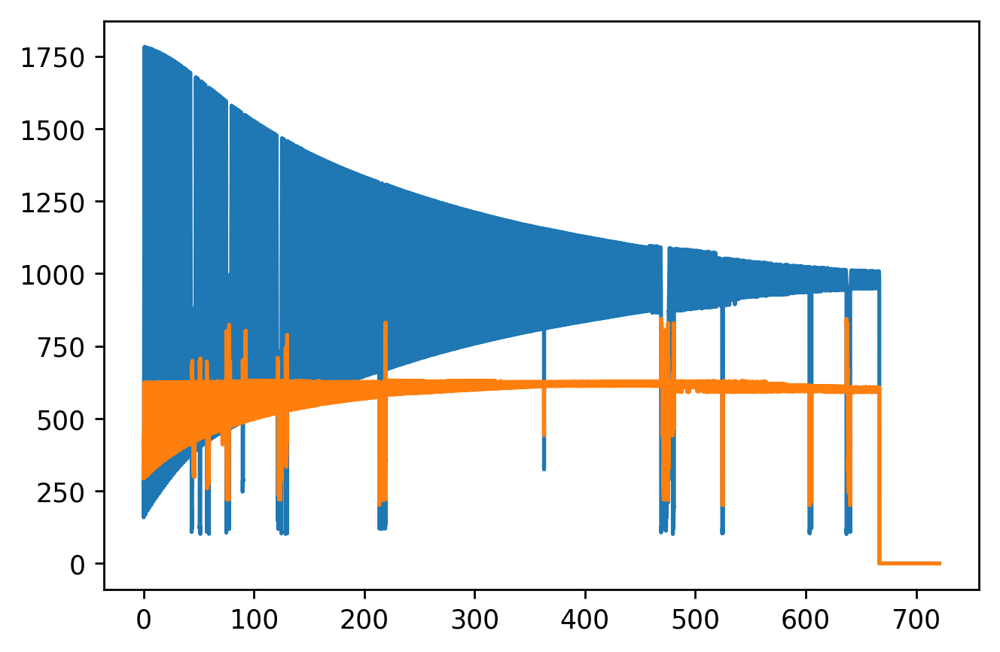

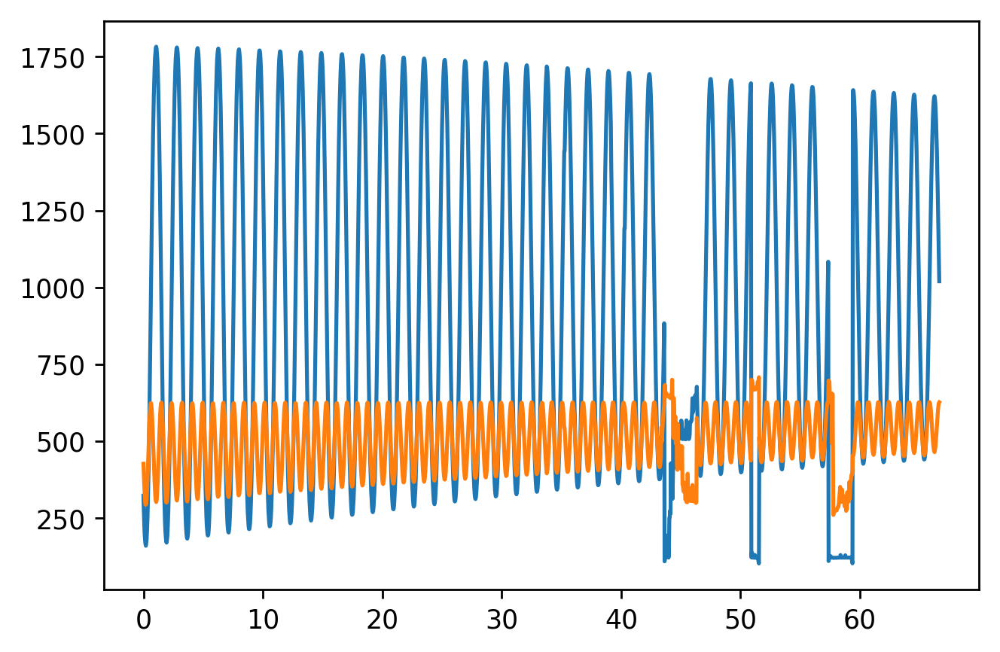

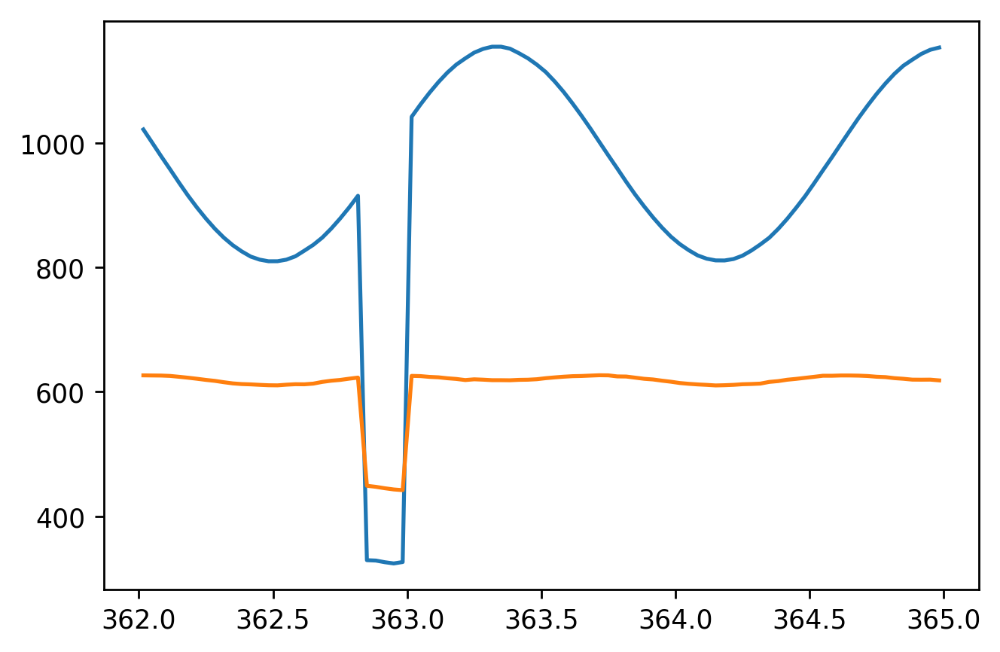

In [1]:
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rc('figure',dpi=250)

fps=30  #we could, perhaps, read this in from the movie and save it, but it is too much work for too little gain

x=np.load('xposLong.npy')
y=np.load('yposLong.npy')

t=np.linspace(0,len(x)/fps,len(x))
plt.figure()
plt.plot(t,x)
plt.plot(t,y)
plt.figure()
plt.plot(t[:2000],x[:2000])
plt.plot(t[:2000],y[:2000])
plt.figure()
t1=362*fps
t2=365*fps
plt.plot(t[t1:t2],x[t1:t2])
plt.plot(t[t1:t2],y[t1:t2])


In [2]:
print([(i,x[i]) for i in range(363*30,364*30) ])

[(10890, 1041.914351851852), (10891, 1061.9263157894736), (10892, 1080.6022988505747), (10893, 1097.7102473498232), (10894, 1113.0023337222869), (10895, 1125.8479604449938), (10896, 1135.8453987730061), (10897, 1145.094130675526), (10898, 1151.0692148760331), (10899, 1154.5971922246219), (10900, 1154.6162162162161), (10901, 1151.4273858921163), (10902, 1144.1769316909295), (10903, 1136.020935960591), (10904, 1125.8267515923567), (10905, 1113.9207100591716), (10906, 1098.7946324387399), (10907, 1081.9529411764706), (10908, 1063.3532863849766), (10909, 1043.6512702078521), (10910, 1022.9686411149826), (10911, 1001.4201388888889), (10912, 979.93240093240092), (10913, 958.89755529685681), (10914, 937.48826291079808), (10915, 917.04886769964241), (10916, 898.13271245634462), (10917, 880.32816229116941), (10918, 863.99641577060936), (10919, 849.38164251207729)]


What features do we see?  What do they tell us?
1.
2.
3.
4.
5.
6.
7.


How do we test the hypothesis that the camera is tilted along the x-axis?

/usr/local/lib/python3.6/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


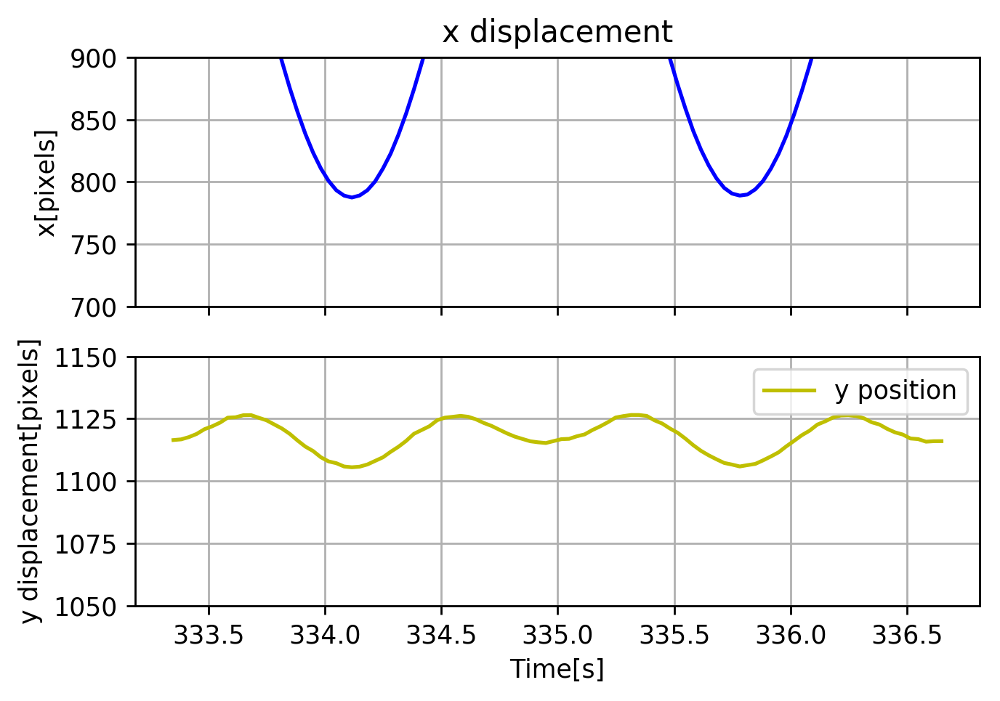

In [3]:
plt.figure()
m=10000
n=10100
f, axarr = plt.subplots(2, sharex=True)
axarr[0].set_title('x displacement')
axarr[0].set_ylabel('x[pixels]')
axarr[0].set_ylim(700,900)
axarr[0].legend()
axarr[0].grid()
axarr[0].plot(t[m:n],x[m:n], 'b',label='x position');
axarr[1].set_xlabel('Time[s]')
axarr[1].set_ylabel('y displacement[pixels]')
axarr[1].plot(t[m:n],500+y[m:n], 'y',label='y position');
axarr[1].set_ylim(1050,1150)
axarr[1].grid()
axarr[1].legend()


# Fitting a function to data

We now want to calibrate our data- in particular we want to find $(x_0,y_0),$ the pivot point.  We can then calculate $\theta=\tan^{-1}\frac{x-x_0}{y-y_0}$.  We can do reasonably well finding $x_0$ by looking at the data relatively late in the data set, where the pendulum amplitude is low.  We know that the oscillation must be symmetric in $x$.  To start tinkering, let's just print out the data from 500-502 seconds:

In [4]:
t1=500*30
t2=502*30
ar=np.array([np.arange(t1,t2),t[t1:t2],x[t1:t2],y[t1:t2]]).transpose()
print(ar)

[[ 15000.            500.02311711   1079.24225067    624.40144879]
 [ 15001.            500.05645199   1079.210077      625.45396719]
 [ 15002.            500.08978686   1076.17978652    624.35156771]
 [ 15003.            500.12312173   1073.33835957    625.25219553]
 [ 15004.            500.15645661   1043.95981087    619.95491388]
 [ 15005.            500.18979148   1041.20793269    619.78348214]
 [ 15006.            500.22312636   1039.74256733    616.14585519]
 [ 15007.            500.25646123   1030.43283582    622.47354138]
 [ 15008.            500.28979611   1022.61518987    625.98734177]
 [ 15009.            500.32313098   1013.96433121    626.5133758 ]
 [ 15010.            500.35646586   1004.55          626.8975    ]
 [ 15011.            500.38980073    994.69538077    627.71785268]
 [ 15012.            500.4231356     984.11111111    627.31623932]
 [ 15013.            500.45647048    973.39678616    627.05067985]
 [ 15014.            500.48980535    963.08044554    626.93193

We do pretty well- probably with an accuracy of about .1 pixel- by just taking the average of the extremes:

In [5]:
x0=(x[15025]+x[15050])/2
print('x0=',x0)

x0= 980.058604319


But there are somethings that don't feel completely right about this procedure.  What is that?  

We are now going to look at fitting a function to data.  What we do is use the metric $\chi^2$, which measures the mean difference between data and a model by summing the squared normalized 'residuals'.  (Although we need to be careful with the word 'residual'.  It tends to be used in different ways, with different units and different normalizations. )  We define
\begin{equation}\chi^2=\sum_{i=0}^{i=N}\left(\frac{f(x_i)-y_i}{\sigma_i}\right)^2\end{equation}
where $x_i,y_i,\sigma_i$ are the independent variable, dependent variable and uncertainty associated with each data point.  If our uncertainties are correct, and the fluctuations are statistical, we expect that $\chi^2=N-1$-- that is the number of "degrees of freedom".  

Let's take our function looks like a cosine curve:
\begin{equation}x(t)=A\cos(\omega*t-\theta_0)+x_0$

We make two functions- on that calculates $x(t)$ and one that calculates $\chi^2$.


In [6]:
def xFunction(t,A,x0,omega,theta0):
    #if one of the parameters is a vector, it returns a 2d array with the rows corresponding to a vector of one of A,X0,omega,theta0 and 
    #columns to different times
    #if parameters are scalers it returns a 1d vector
    tt=t.reshape(1,-1)  # we make t into a row matrix and one of the other parameters into a column matrix.
    if not np.isscalar(A):
        return A.reshape(-1,1)*np.cos(omega*tt-theta0)+x0
    if not np.isscalar(x0):
        return A*np.cos(omega*tt-theta0)+x0.reshape(-1,1)
    if not np.isscalar(omega):
        return A*np.cos(omega.reshape(-1,1)*tt-theta0)+x0
    if(not np.isscalar(theta0)):
        return A*np.cos(omega*tt-theta0.reshape(-1,1))+x0
    return A*np.cos(omega*tt-theta0)+x0

def chisquare(func,t,x,sigma,A,x0,omega,theta0):
    '''Calculates chisquare.  t is the independent variable for the data, x are the data value, sigma are the uncertainties.  
    Those three arrays need to be the same length.  '''
    return np.sum(((func(t,A,x0,omega,theta0)-x)/sigma)**2,axis=1).reshape(-1)

To see how the function behaves, let's plot it from t[11500:12000], and we will tweak the parameters to make it look like the data (which we overlay).


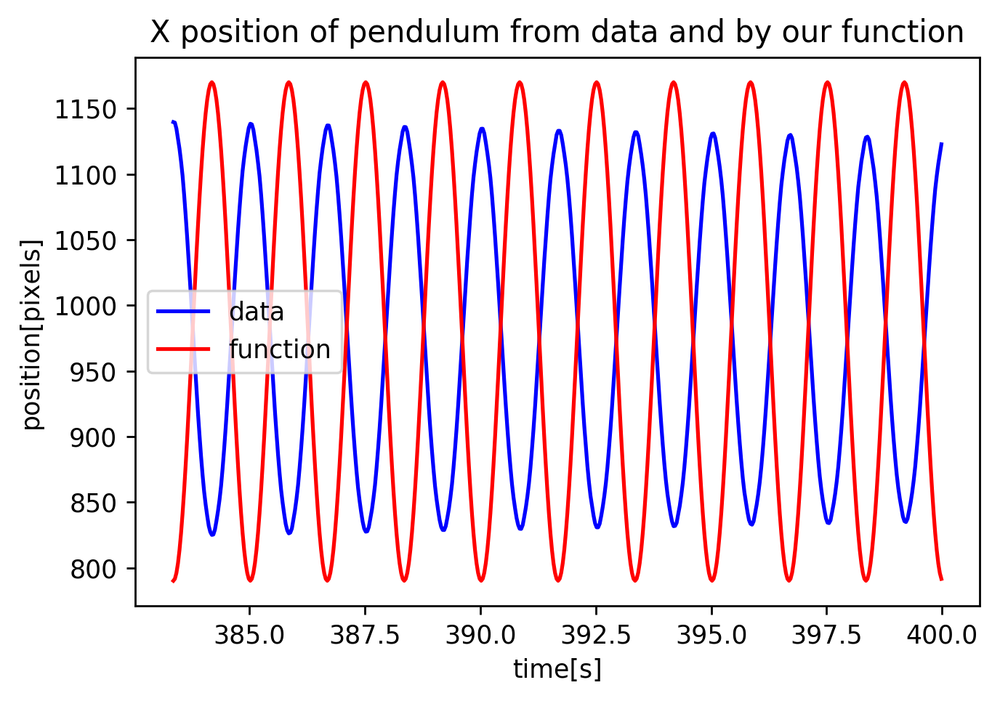

In [7]:
m=11500
n=12000

omega=2*np.pi/50.0*30  #tweak denominator to make traces match bins between minimum and maximum
theta0=omega*t[m]-np.pi  #so that bin m is at a minimum

xcalc=xFunction(t[m:n],190,x0,omega,theta0).reshape(-1)

plt.figure()
plt.title('X position of pendulum from data and by our function')
plt.xlabel('time[s]')
plt.ylabel('position[pixels]')
plt.plot(t[m:n],x[m:n],'b',label='data')
plt.plot(t[m:n],xcalc,'r',label='function')
plt.legend()

We need to shift the function to the left- so we want to decrease theta0 by roughly $\pi/2$

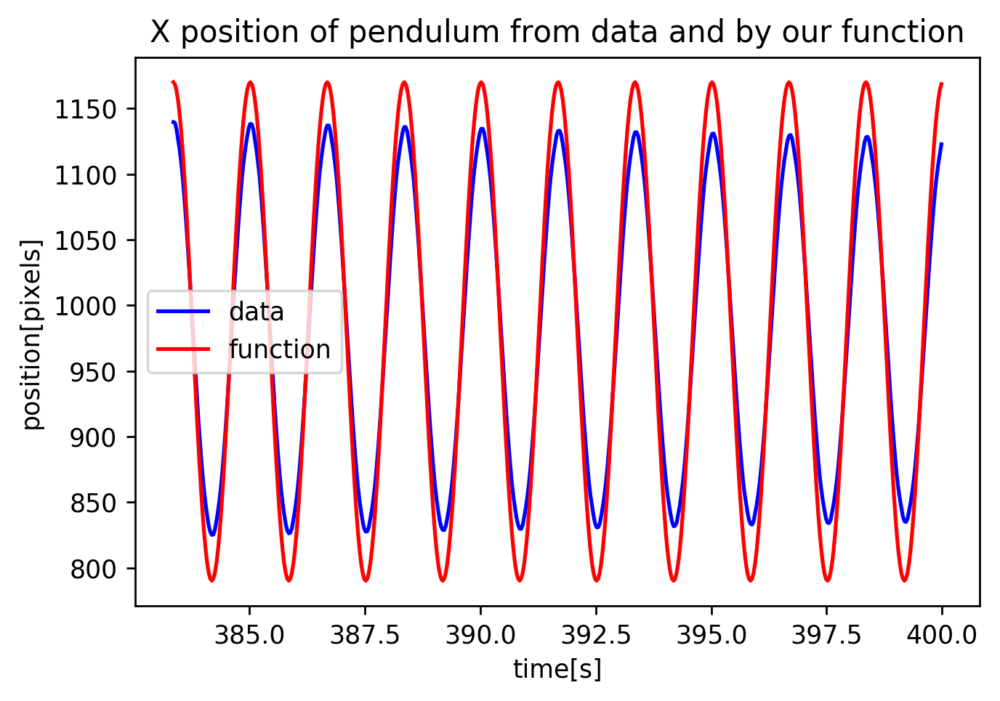

In [8]:
theta0=theta0-np.pi
xcalc=xFunction(t[m:n],190,x0,omega,theta0).reshape(-1)

plt.figure()
plt.title('X position of pendulum from data and by our function')
plt.xlabel('time[s]')
plt.ylabel('position[pixels]')
plt.plot(t[m:n],x[m:n],'b',label='data')
plt.plot(t[m:n],xcalc,'r',label='function')
plt.legend()

Now let's calculate $\chi^2$.  We will do a "minimization by hand", where we plot chisquare versus each parameter in turn, and pick the parameters that correspond to the minimum.

Let's start by varying the amplitude

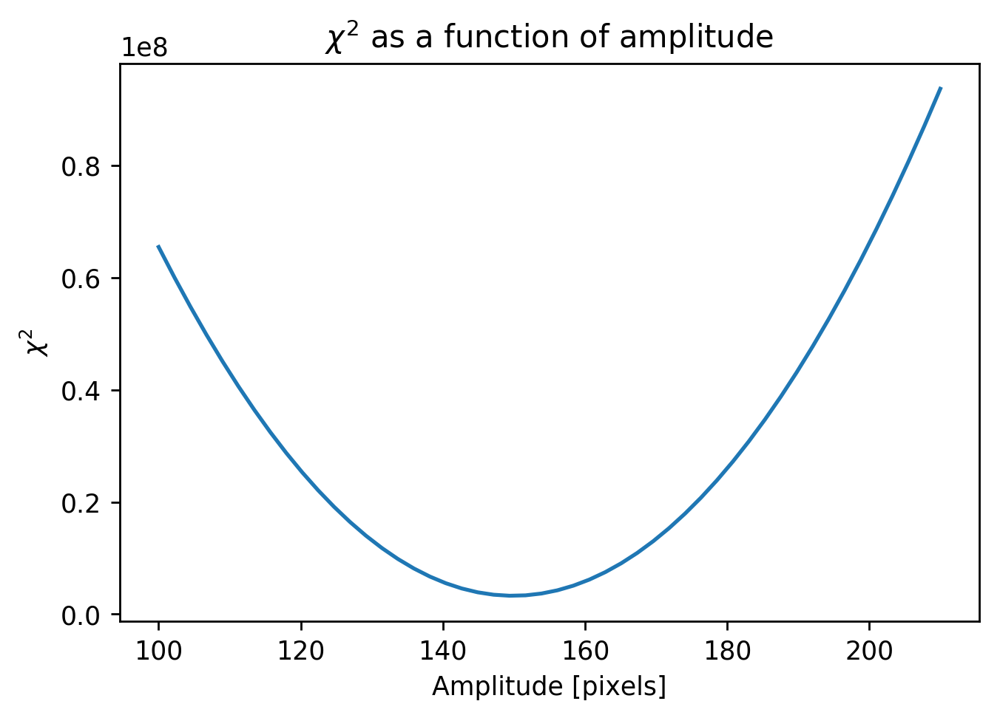

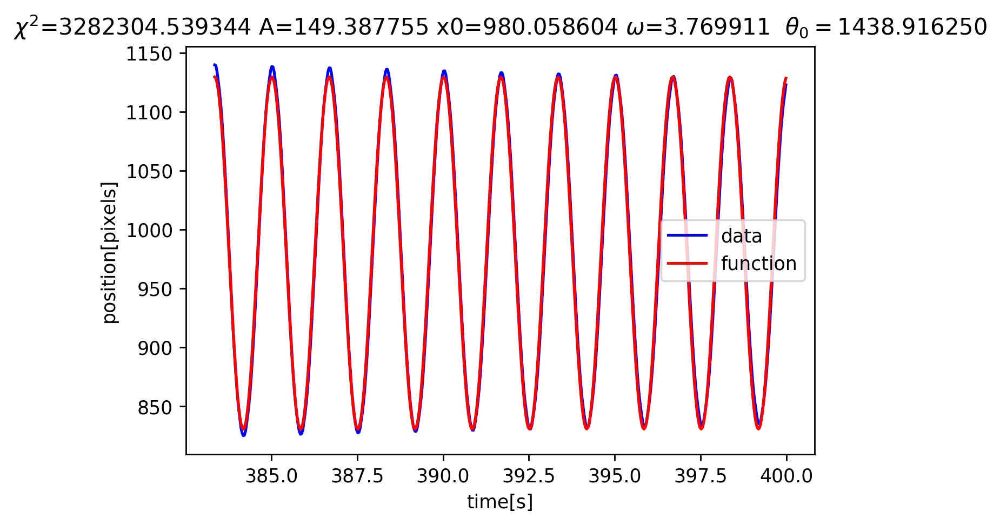

In [9]:
uncertainties=np.ones(n-m)*0.1  #  0.1 pixel seems reasonable, but perhaps a little small. We may come back and address this
amplitude=np.linspace(100,210,50)
chisq=chisquare(xFunction,t[m:n],x[m:n],uncertainties,amplitude,x0,omega,theta0)

amp0=amplitude[np.argmin(chisq)]
bestChiSquare=np.amin(chisq)

plt.figure()
plt.title(r'$\chi^2$ as a function of amplitude')
plt.xlabel('Amplitude [pixels]')
plt.ylabel(r'$\chi^2$')
plt.plot(amplitude,chisq)

xcalc=xFunction(t[m:n],amp0,x0,omega,theta0).reshape(-1)
title=r'$\chi^2$=%f A=%f x0=%f $\omega$=%f  $\theta_0=%f$' % (bestChiSquare,amp0,x0,omega,theta0)
plt.figure()
plt.title(title)
plt.xlabel('time[s]')
plt.ylabel('position[pixels]')
plt.plot(t[m:n],x[m:n],'b',label='data')
plt.plot(t[m:n],xcalc,'r',label='function')
plt.legend()


Now do theta0, since it seems most off

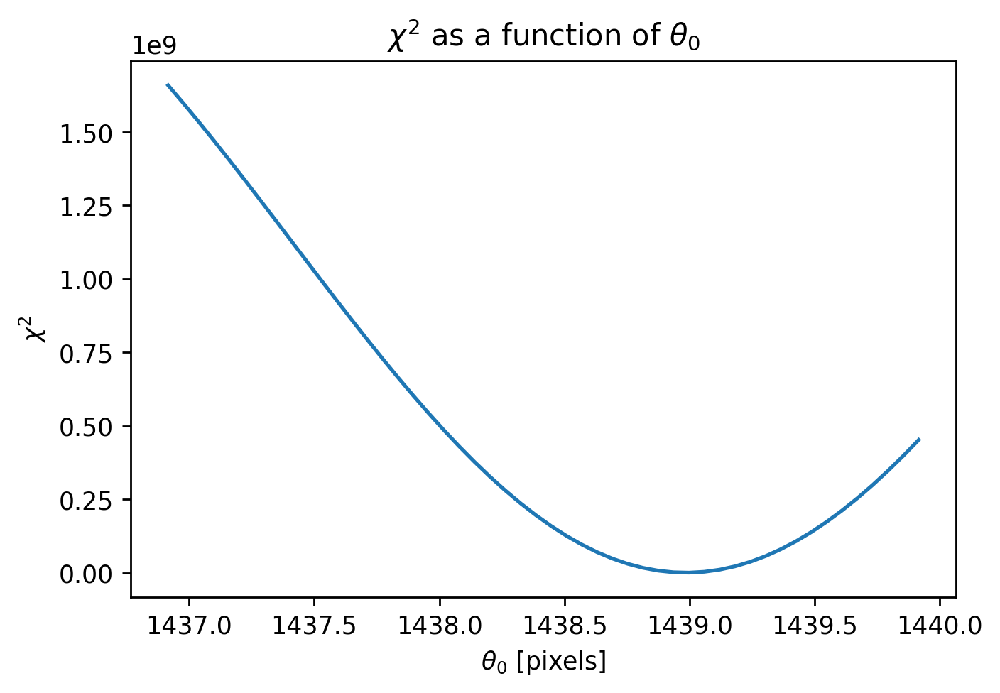

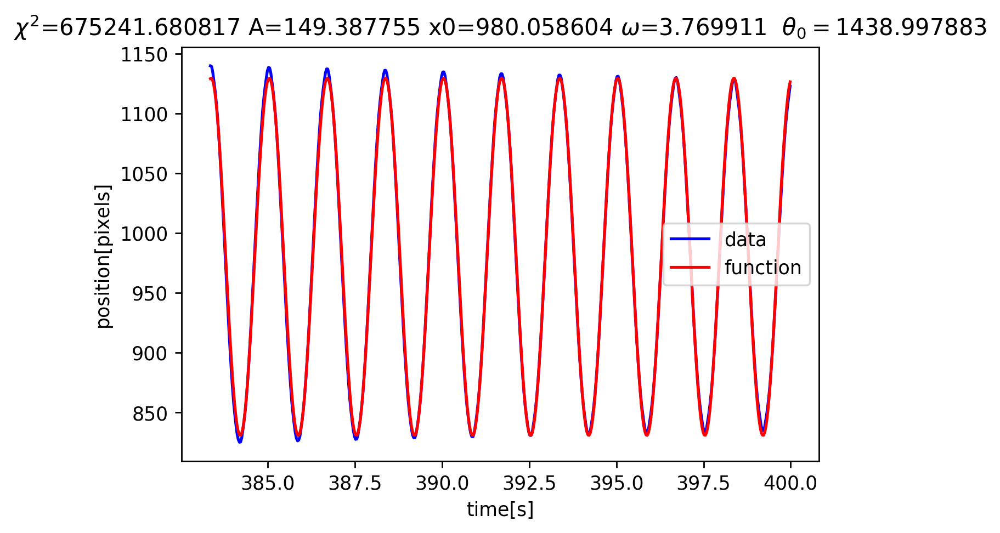

In [10]:
theta0array=np.linspace(theta0-2,theta0+1,50)
chisq=chisquare(xFunction,t[m:n],x[m:n],uncertainties,amp0,x0,omega,theta0array)

theta0=theta0array[np.argmin(chisq)]
bestChiSquare=np.amin(chisq)

plt.figure()
plt.title(r'$\chi^2$ as a function of $\theta_0$')
plt.xlabel(r'$\theta_0$ [pixels]')
plt.ylabel(r'$\chi^2$')
plt.plot(theta0array,chisq)

xcalc=xFunction(t[m:n],amp0,x0,omega,theta0).reshape(-1)
title=r'$\chi^2$=%f A=%f x0=%f $\omega$=%f  $\theta_0=%f$' % (bestChiSquare,amp0,x0,omega,theta0)
plt.figure()
plt.title(title)
plt.xlabel('time[s]')
plt.ylabel('position[pixels]')
plt.plot(t[m:n],x[m:n],'b',label='data')
plt.plot(t[m:n],xcalc,'r',label='function')
plt.legend()


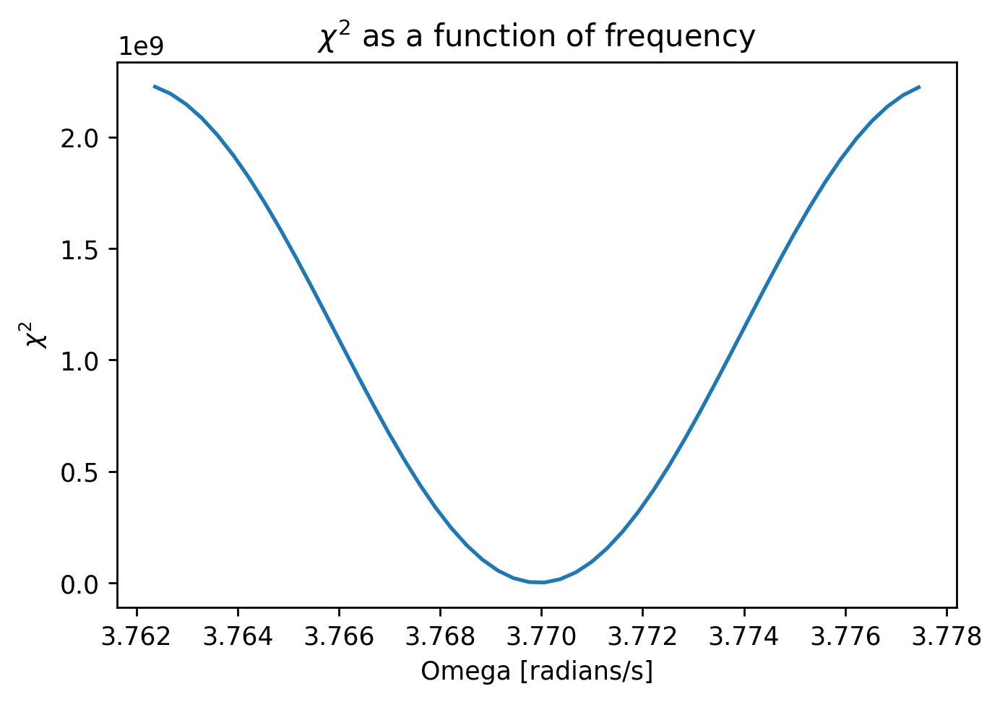

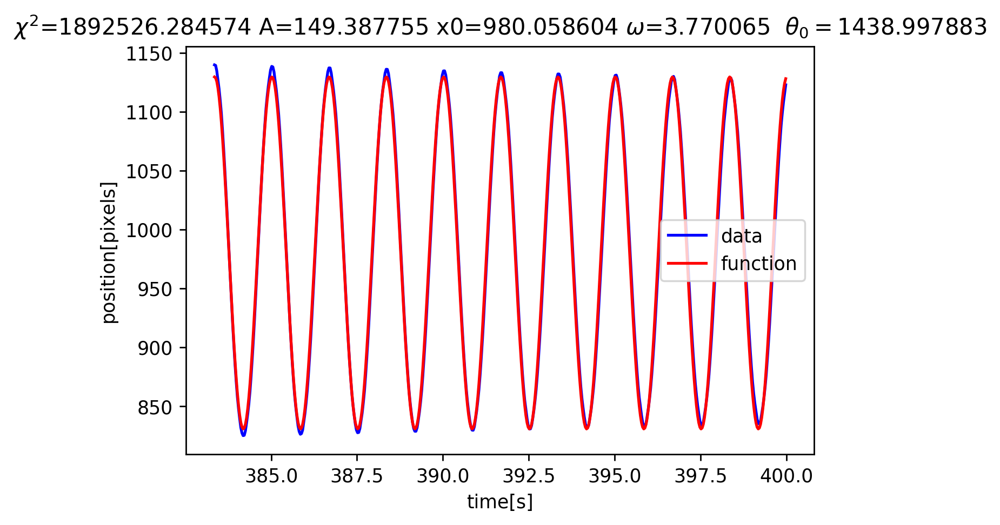

In [11]:
#omega=2*omega
omegaarray=np.linspace(omega*0.998,omega*1.002,50)
chisq=chisquare(xFunction,t[m:n],x[m:n],uncertainties,amp0,x0,omegaarray,theta0)

omega=omegaarray[np.argmin(chisq)]
bestChiSquare=np.amin(chisq)

plt.figure()
plt.title(r'$\chi^2$ as a function of frequency')
plt.xlabel('Omega [radians/s]')
plt.ylabel(r'$\chi^2$')
plt.plot(omegaarray,chisq)

xcalc=xFunction(t[m:n],amp0,x0,omega,theta0).reshape(-1)
title=r'$\chi^2$=%f A=%f x0=%f $\omega$=%f  $\theta_0=%f$' % (bestChiSquare,amp0,x0,omega,theta0)
plt.figure()
plt.title(title)
plt.xlabel('time[s]')
plt.ylabel('position[pixels]')
plt.plot(t[m:n],x[m:n],'b',label='data')
plt.plot(t[m:n],xcalc,'r',label='function')
plt.legend()


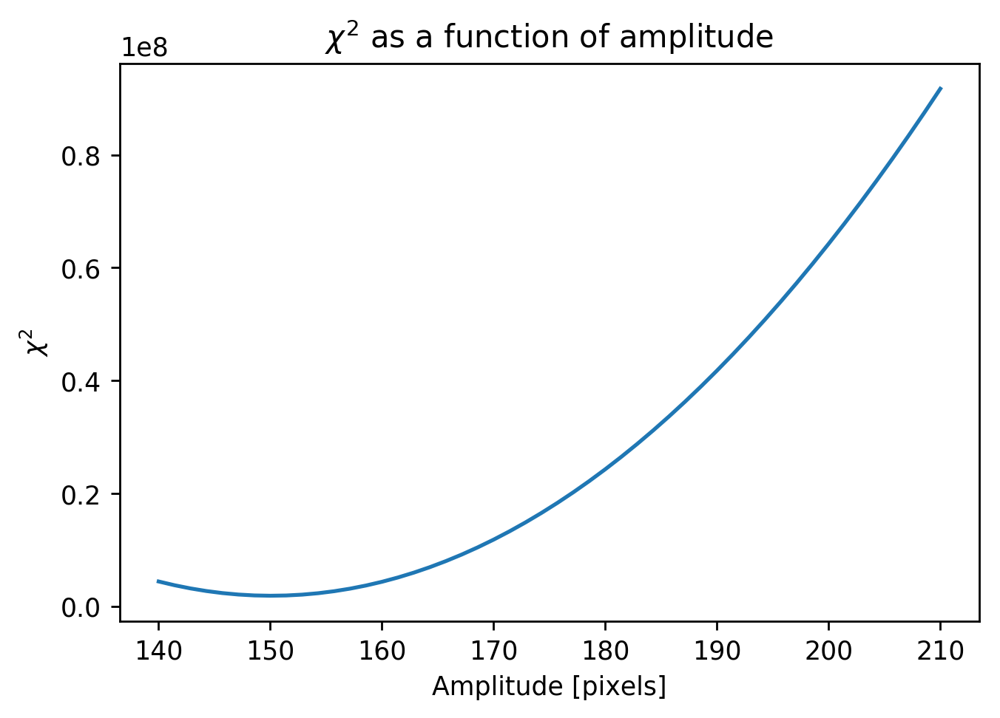

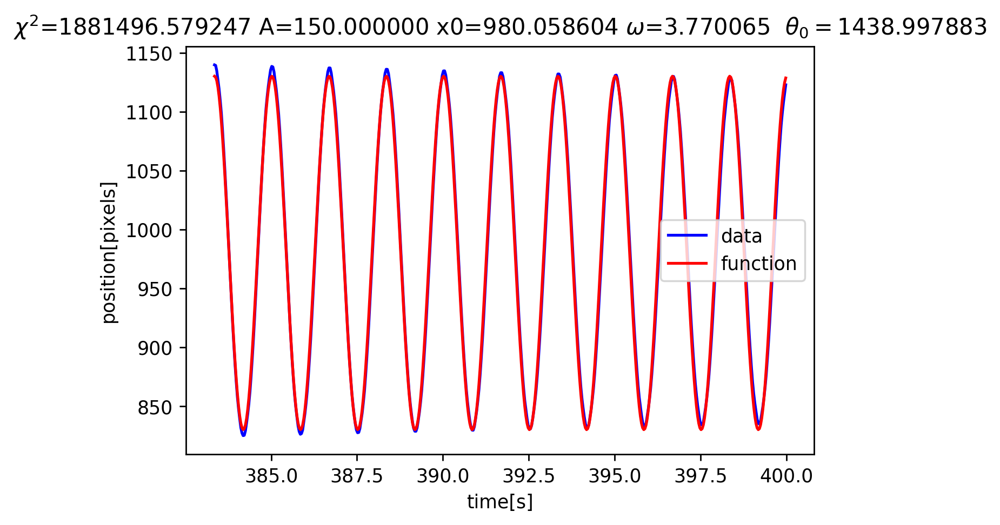

In [12]:
# Redo the amplitude, since it seems most off
amplitude=np.linspace(140,210,50)
chisq=chisquare(xFunction,t[m:n],x[m:n],uncertainties,amplitude,x0,omega,theta0)

amp0=amplitude[np.argmin(chisq)]
bestChiSquare=np.amin(chisq)

plt.figure()
plt.title(r'$\chi^2$ as a function of amplitude')
plt.xlabel('Amplitude [pixels]')
plt.ylabel(r'$\chi^2$')
plt.plot(amplitude,chisq)

xcalc=xFunction(t[m:n],amp0,x0,omega,theta0).reshape(-1)
title=r'$\chi^2$=%f A=%f x0=%f $\omega$=%f  $\theta_0=%f$' % (bestChiSquare,amp0,x0,omega,theta0)
plt.figure()
plt.title(title)
plt.xlabel('time[s]')
plt.ylabel('position[pixels]')
plt.plot(t[m:n],x[m:n],'b',label='data')
plt.plot(t[m:n],xcalc,'r',label='function')
plt.legend()


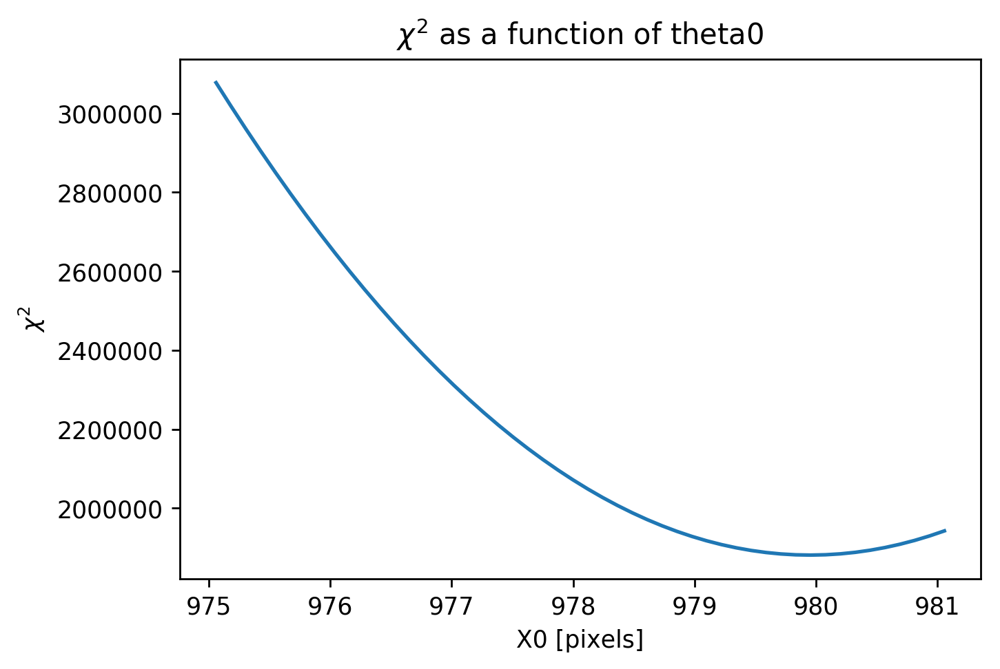

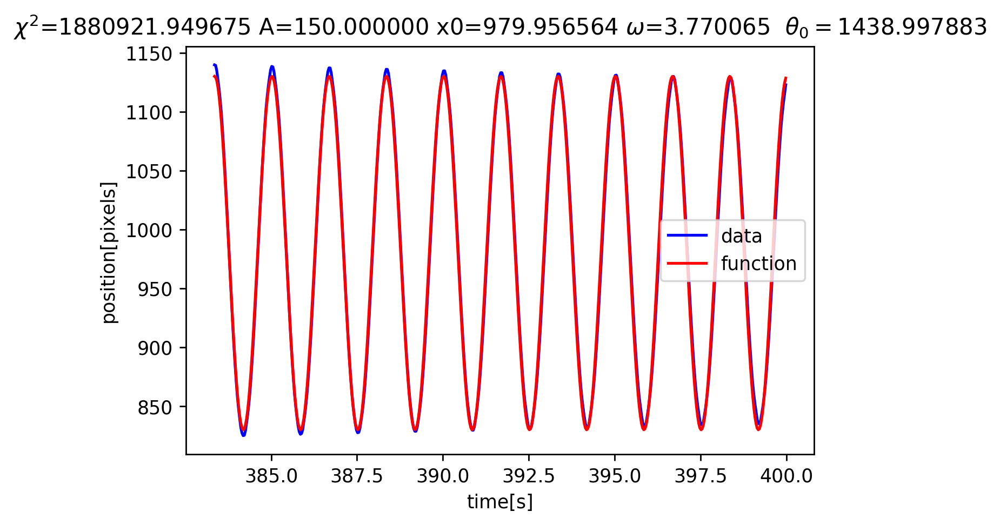

In [13]:
offset=np.linspace(x0-5,x0+1,50)
chisq=chisquare(xFunction,t[m:n],x[m:n],uncertainties,amp0,offset,omega,theta0)

x0=offset[np.argmin(chisq)]
bestChiSquare=np.amin(chisq)

plt.figure()
plt.title(r'$\chi^2$ as a function of theta0')
plt.xlabel('X0 [pixels]')
plt.ylabel(r'$\chi^2$')
plt.plot(offset,chisq)

xcalc=xFunction(t[m:n],amp0,x0,omega,theta0).reshape(-1)
title=r'$\chi^2$=%f A=%f x0=%f $\omega$=%f  $\theta_0=%f$' % (bestChiSquare,amp0,x0,omega,theta0)
plt.figure()
plt.title(title)
plt.xlabel('time[s]')
plt.ylabel('position[pixels]')
plt.plot(t[m:n],x[m:n],'b',label='data')
plt.plot(t[m:n],xcalc,'r',label='function')
plt.legend()


# Fitting multidimensional nonlinear functions to one dimensional data

Read Numerical Recipes, Chapter 15.  It discusses linear least squares fitting, the chisquare distribution, and a number of other concepts that you will run into when modelling data.  We will focus on the section 15.5:
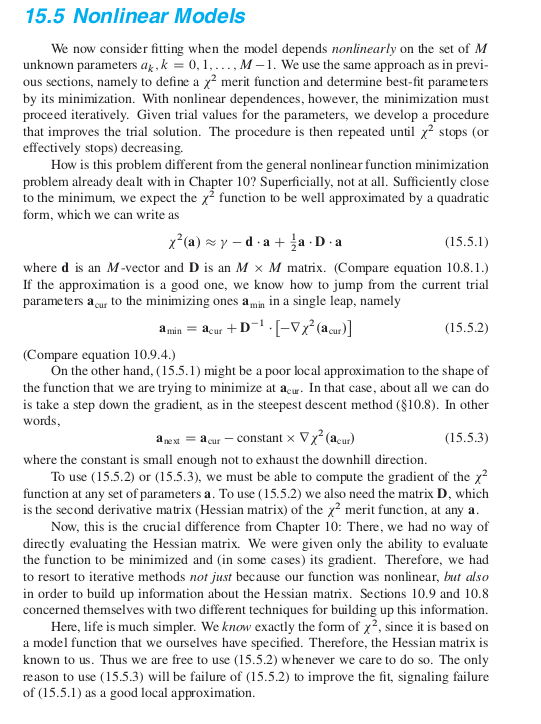
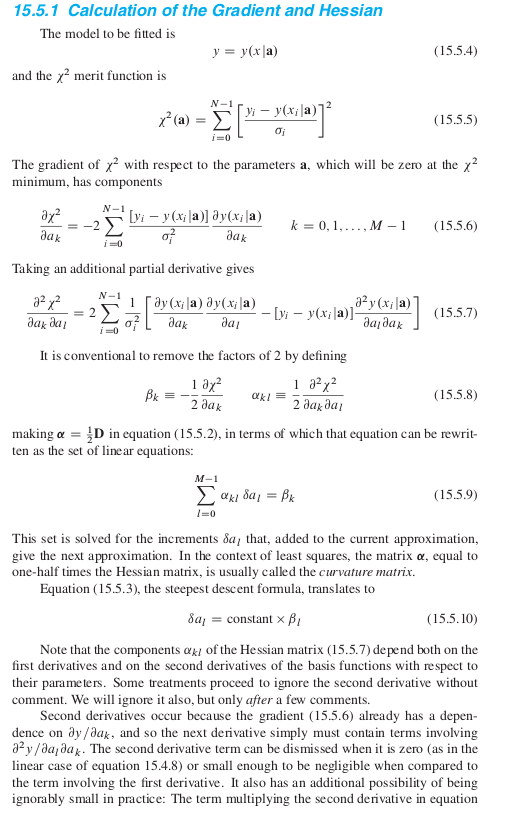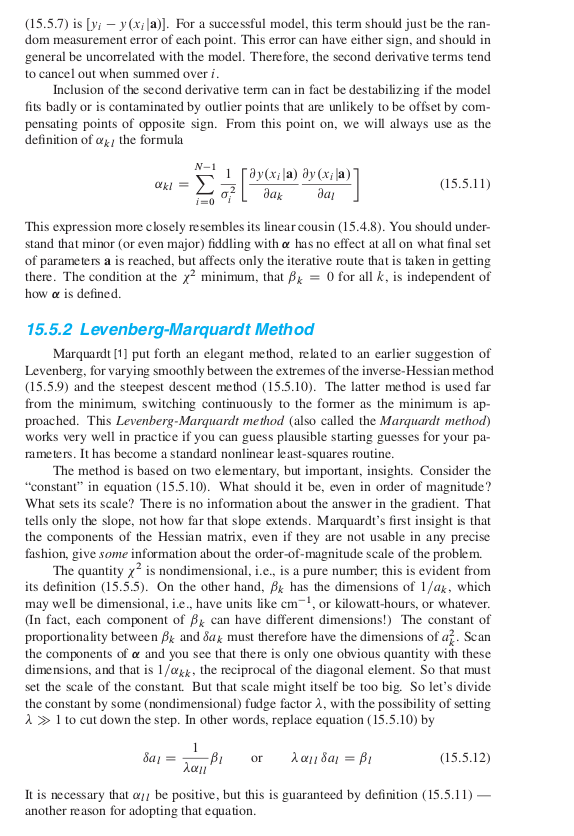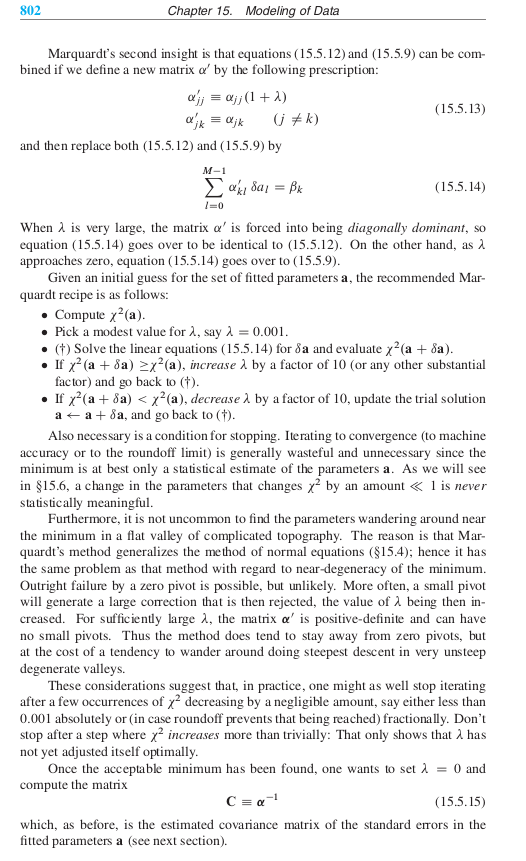

This is implemented inside scipy as https://docs.scipy.org/doc/scipy-0.19.1/reference/generated/scipy.optimize.least_squares.html

A problem with "packages", like that of scipy or of NR3, is that they sometimes contain features that one is tempted to use but are dangerous.  I don't like constraining ranges of variables over which to fit; and I don't like reweighting the function with the "rho(z) capability.  However, this is turned off by default, and we will leave it that way.  In all cases, one should be scientific- we should understand the data, why there might be fluctuations, and we should understand the fit procedure.

So we start by defining our function, which has the specification:
Function which computes the vector of residuals, with the signature fun(x, *args, \**kwargs), i.e., the minimization proceeds with respect to its first argument. The argument x passed to this function is an ndarray of shape (n,) (never a scalar, even for n=1). It must return a 1-d array_like of shape (m,) or a scalar. I

In [14]:
def residuals(parameters,*args):
    t,x,sigma=args
    A,x0,omega,theta0=parameters
    return ((A*np.cos(omega*t-theta0)+x0-x)/sigma)

#test it out with our function
fitParameters=np.array([amp0,x0,omega,theta0])
args=(t[m:n],x[m:n],uncertainties)
xx=residuals(fitParameters,*args)

In [15]:
from scipy.optimize import least_squares
args=(t[m:n],x[m:n],uncertainties)
startingParameters=np.array([amp0,x0,omega,theta0])
#amp,x,omega,theta0=
out=least_squares(residuals,startingParameters,args=args,method='lm')
print(out)

 active_mask: array([0, 0, 0, 0])
        cost: 193996.0592438734
         fun: array([ -9.32295673e+01,  -9.34875906e+01,  -7.55795917e+01,
        -5.05508733e+01,  -4.75560615e+01,  -4.59462258e+01,
        -5.00539050e+01,  -3.97465102e+01,  -2.94821601e+01,
        -1.94744277e+01,  -8.91733585e+00,  -2.33320662e+00,
         8.68070905e+00,   1.72820362e+01,   1.96838836e+01,
         2.86405437e+01,   3.79030801e+01,   3.90472072e+01,
         4.18145697e+01,   4.25563110e+01,   4.21787239e+01,
         3.42023597e+01,   3.22484945e+01,   4.27616403e+01,
         4.59215957e+01,   4.85891421e+01,   5.02061608e+01,
         4.09474091e+01,   2.45577332e+01,   2.30175863e+01,
         3.08622595e+01,   3.88643960e+01,   3.82846617e+01,
         3.67803171e+01,   3.54113543e+01,   3.03190711e+01,
         2.08666453e+01,   1.52848877e+01,   1.01357878e+01,
         2.97263174e+00,  -6.38406840e+00,  -1.40001442e+01,
        -2.20103873e+01,  -2.85223372e+01,  -3.82868975e+01,
     

What do the outputs mean?  

A few general comments about fits:
a.  If there are issues, it is almost always a bug in the fitting function.  Always plot out the function, and see that it makes sense.  In multidimensional fits, you can probably only look in the vicinity of a few points.
b.  Occasionally, fits fail because the parameters are not independent.  
c.  Fitting results in parameters with correlations.  The covariance matrix gives you these correlations.
d.  For a well defined problem, with a single minimum, the results of the fit should not depend upon starting parameters.  If fits only converge with carefully chosen initial conditions there might be multiple local minima.  There is no general solution for this- it requires intelligence to pick out an algorithm that will work.  Often this is seen if you have dependent parameters or bugs in the fitting function.  

Let start by replotting the data, the function, and then the residuals.  

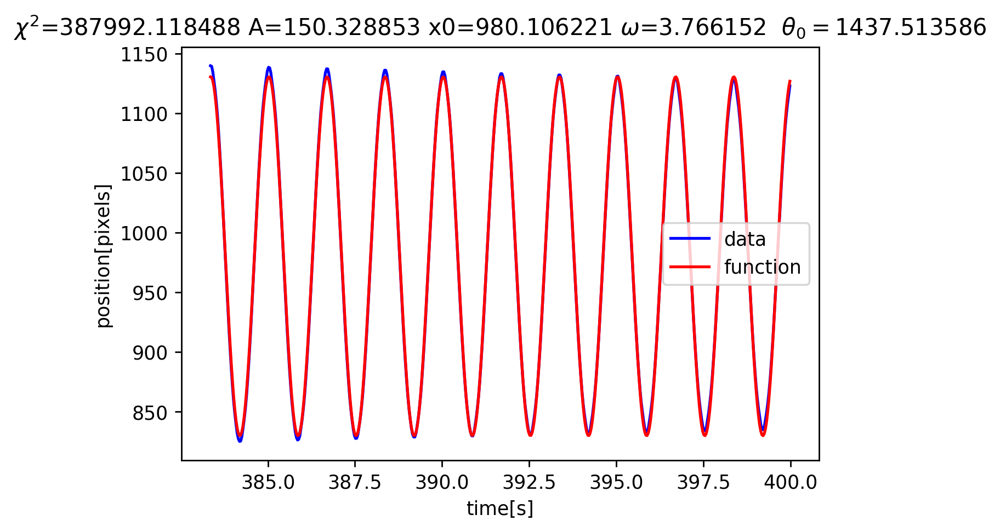

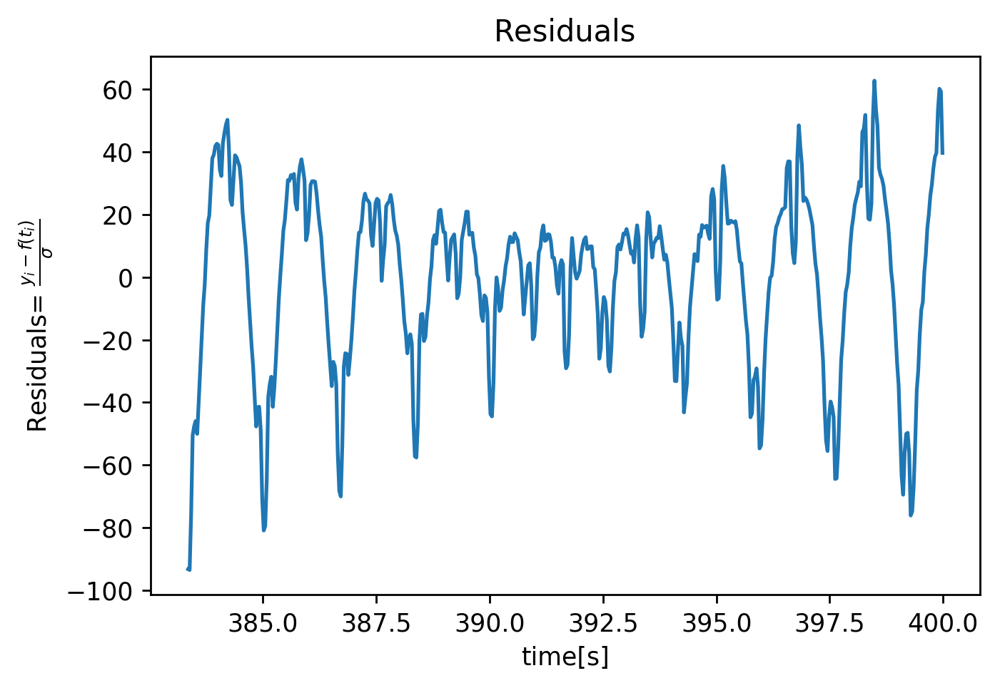

In [16]:
amp0,x0,omega,theta0=out.x
xcalc=xFunction(t[m:n],amp0,x0,omega,theta0).reshape(-1)
bestChiSquare=chisquare(xFunction,t[m:n],x[m:n],uncertainties,amp0,x0,omega,theta0)
title=r'$\chi^2$=%f A=%f x0=%f $\omega$=%f  $\theta_0=%f$' % (bestChiSquare,amp0,x0,omega,theta0)
plt.figure()
plt.title(title)
plt.xlabel('time[s]')
plt.ylabel('position[pixels]')
plt.plot(t[m:n],x[m:n],'b',label='data')
plt.plot(t[m:n],xcalc,'r',label='function')
plt.legend()
plt.figure()
plt.title('Residuals')
plt.xlabel('time[s]')
plt.ylabel(r'Residuals= $\frac{y_i-f(t_i)}{\sigma}$')
plt.plot(t[m:n],out.fun)

Notice that the chisquare is twice the "cost function".  This is just a question of definition- the cost is probably appropriate for a log-likelihood fit. 

But note that the automated fit has done significantly better- with only a handful of calls than we did seeking by hand one dimension at a time.  

The residuals show that the fitting function doesn't have a damping term in it, although the data clearly do.

And the residuals also reveal the compound pendulum oscillations (I think).  We zoom in to look at that:

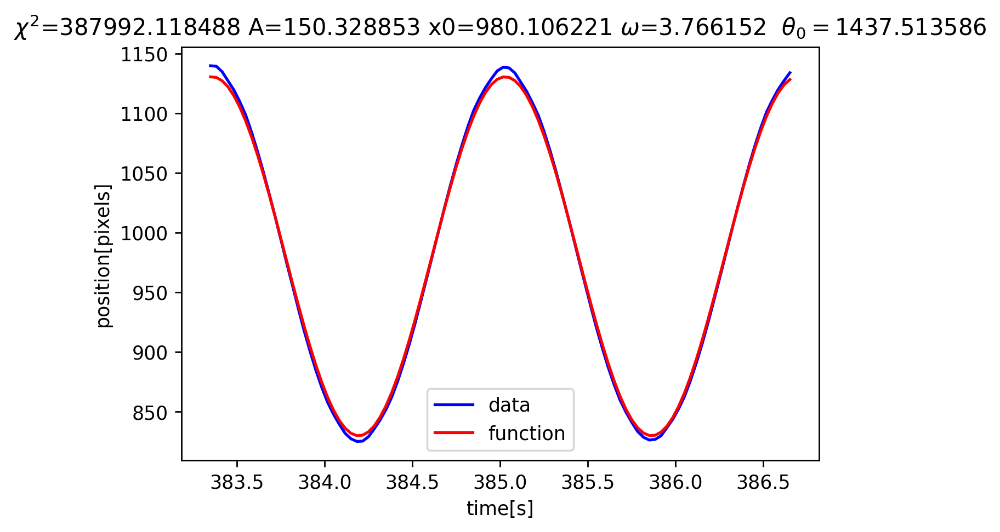

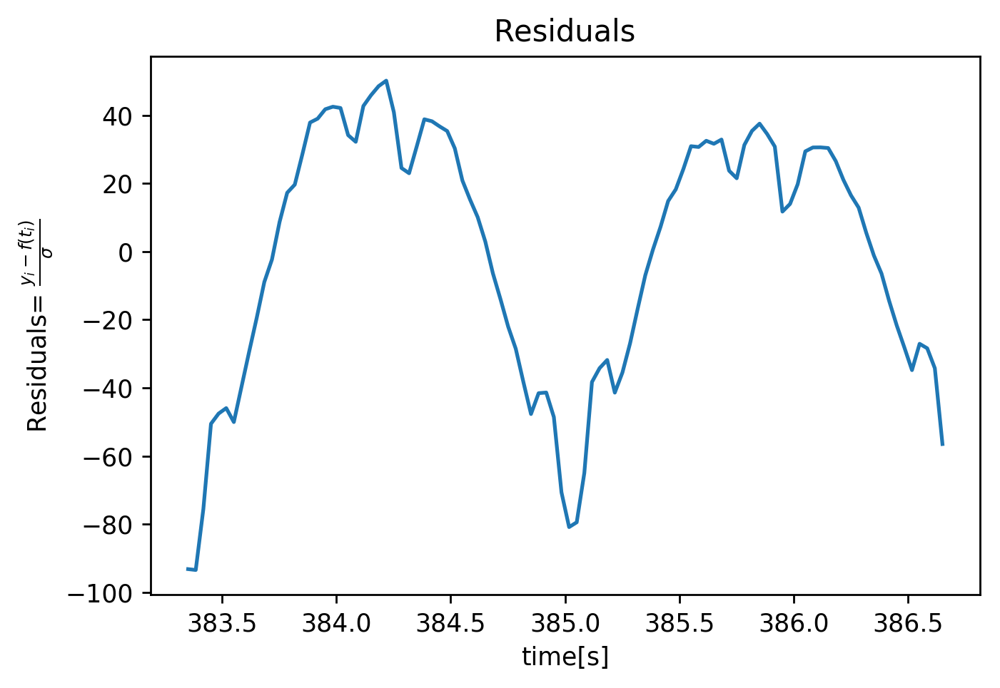

In [17]:
delta=100
n=m+delta
plt.figure()
plt.title(title)
plt.xlabel('time[s]')
plt.ylabel('position[pixels]')
plt.plot(t[m:n],x[m:n],'b',label='data')
plt.plot(t[m:n],xcalc[:delta],'r',label='function')
plt.legend()
plt.figure()
plt.title('Residuals')
plt.xlabel('time[s]')
plt.ylabel(r'Residuals= $\frac{y_i-f(t_i)}{\sigma}$')
plt.plot(t[m:n],out.fun[:delta])

Remember that $\sigma=0.1$ pixels, so a jump in residual of 40 is a change in position of 4 pixels.  

What about uncertainties?  Because we have left out certain factors- like the z-velocity of the ball or the fact that there is damping-$\chi^2=400000$, while we expected $\chi^2=500$- so the fluctuations between data and fit show that the "actual" uncertainties are about 32 times larger than what we used.  These are not properly statistical uncertainties, but we can treat them as such, and we scale the uncertainty by 32.

We do that, and then plot $\chi^2$ as a function of x0.





[[ 979.90622074  380.8516782 ]
 [ 979.914384    380.69549327]
 [ 979.92254727  380.54581606]
 [ 979.93071054  380.40264654]
 [ 979.9388738   380.26598474]
 [ 979.94703707  380.13583064]
 [ 979.95520033  380.01218424]
 [ 979.9633636   379.89504555]
 [ 979.97152686  379.78441456]
 [ 979.97969013  379.68029128]
 [ 979.98785339  379.5826757 ]
 [ 979.99601666  379.49156783]
 [ 980.00417992  379.40696767]
 [ 980.01234319  379.3288752 ]
 [ 980.02050645  379.25729045]
 [ 980.02866972  379.1922134 ]
 [ 980.03683298  379.13364405]
 [ 980.04499625  379.08158241]
 [ 980.05315951  379.03602848]
 [ 980.06132278  378.99698225]
 [ 980.06948605  378.96444372]
 [ 980.07764931  378.9384129 ]
 [ 980.08581258  378.91888979]
 [ 980.09397584  378.90587438]
 [ 980.10213911  378.89936667]
 [ 980.11030237  378.89936667]
 [ 980.11846564  378.90587438]
 [ 980.1266289   378.91888979]
 [ 980.13479217  378.93841291]
 [ 980.14295543  378.96444373]
 [ 980.1511187   378.99698225]
 [ 980.15928196  379.03602849]
 [ 980.1

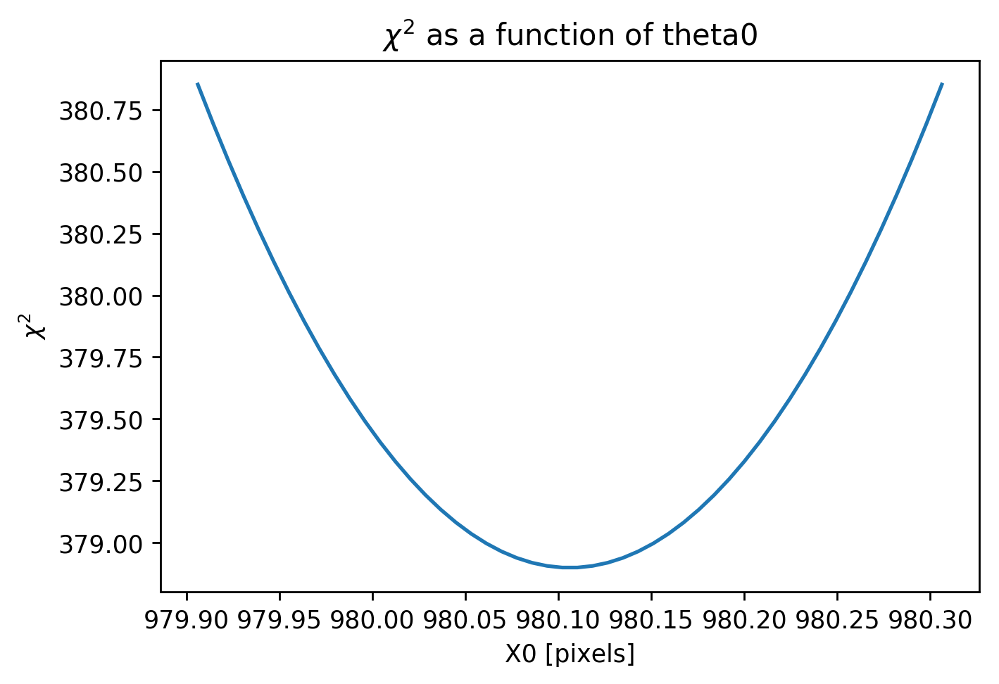

In [18]:
n=m+500
uncertainties=uncertainties*32.0
offset=np.linspace(x0-0.2,x0+0.2,50)
chisq=chisquare(xFunction,t[m:n],x[m:n],uncertainties,amp0,offset,omega,theta0)

x0=offset[np.argmin(chisq)]
bestChiSquare=np.amin(chisq)

plt.figure()
plt.title(r'$\chi^2$ as a function of theta0')
plt.xlabel('X0 [pixels]')
plt.ylabel(r'$\chi^2$')
plt.plot(offset,chisq)
print(np.array([offset,chisq]).transpose())

If we hold the other variables fixed, the uncertainty on X0 is the abscissa at which $\chi^2$ has increased by 1. 

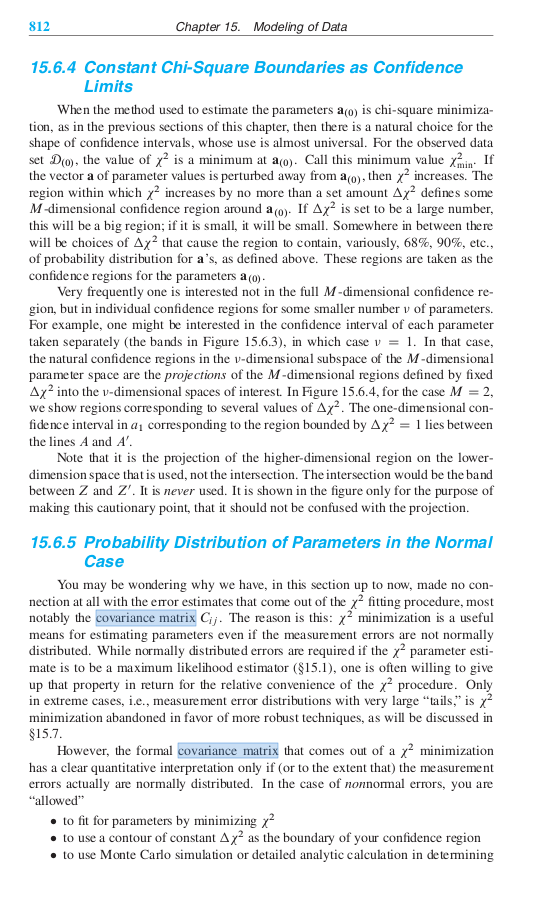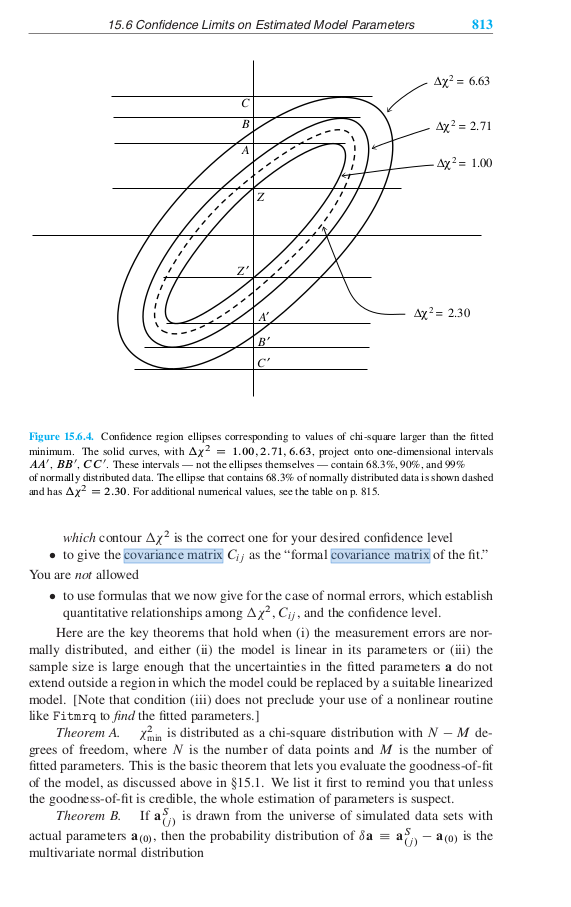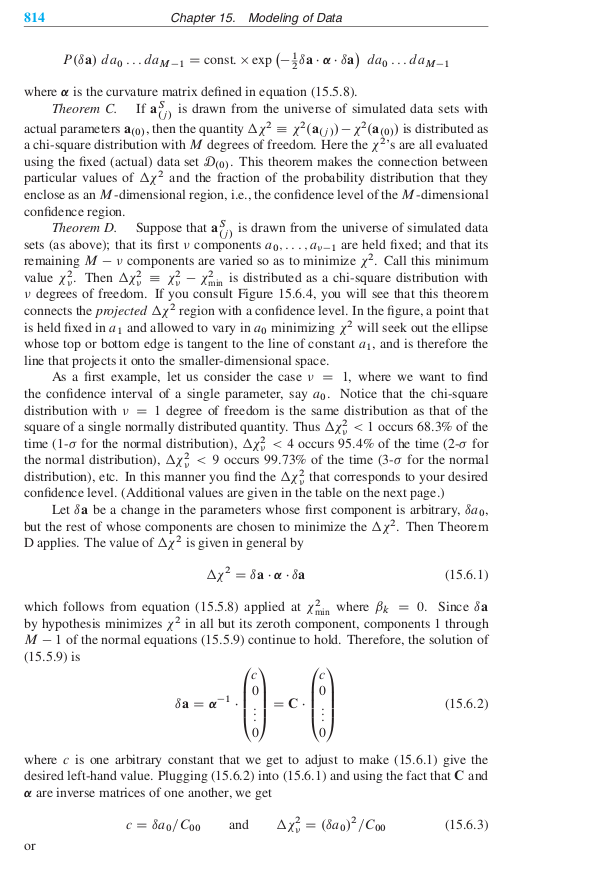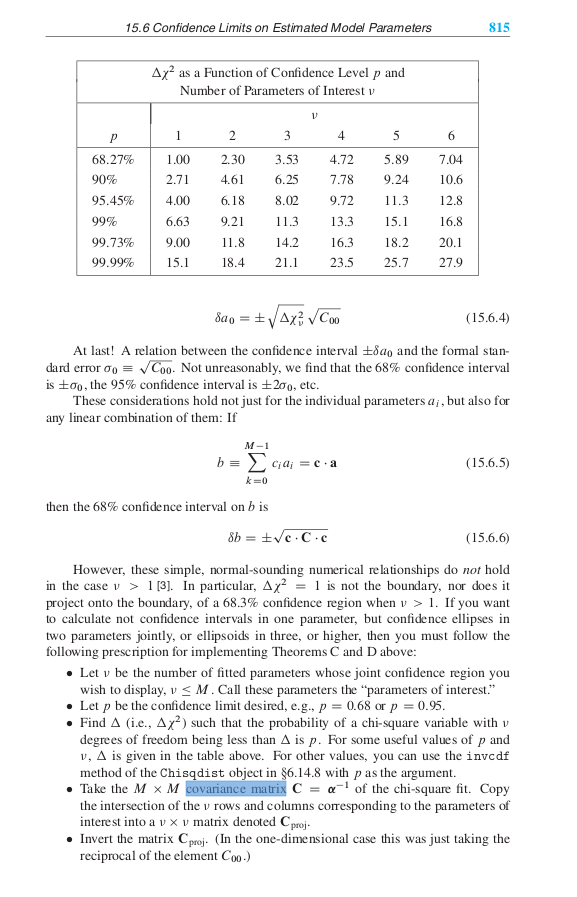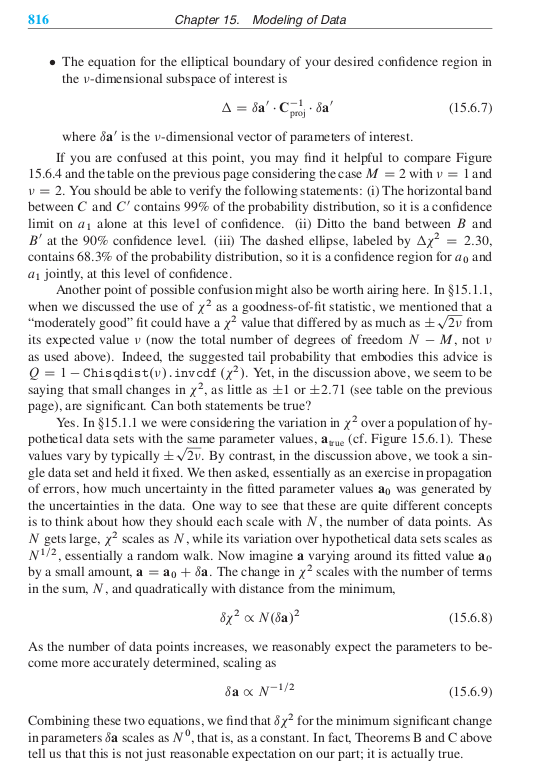

 active_mask: array([0, 0, 0, 0])
        cost: 193996.05924376188
         fun: array([ -9.32295674e+01,  -9.34875909e+01,  -7.55795921e+01,
        -5.05508737e+01,  -4.75560620e+01,  -4.59462264e+01,
        -5.00539056e+01,  -3.97465109e+01,  -2.94821608e+01,
        -1.94744284e+01,  -8.91733661e+00,  -2.33320737e+00,
         8.68070831e+00,   1.72820354e+01,   1.96838829e+01,
         2.86405430e+01,   3.79030795e+01,   3.90472067e+01,
         4.18145692e+01,   4.25563106e+01,   4.21787236e+01,
         3.42023595e+01,   3.22484944e+01,   4.27616403e+01,
         4.59215958e+01,   4.85891423e+01,   5.02061611e+01,
         4.09474095e+01,   2.45577336e+01,   2.30175868e+01,
         3.08622601e+01,   3.88643966e+01,   3.82846623e+01,
         3.67803178e+01,   3.54113550e+01,   3.03190718e+01,
         2.08666460e+01,   1.52848884e+01,   1.01357885e+01,
         2.97263238e+00,  -6.38406781e+00,  -1.40001436e+01,
        -2.20103868e+01,  -2.85223368e+01,  -3.82868972e+01,
    

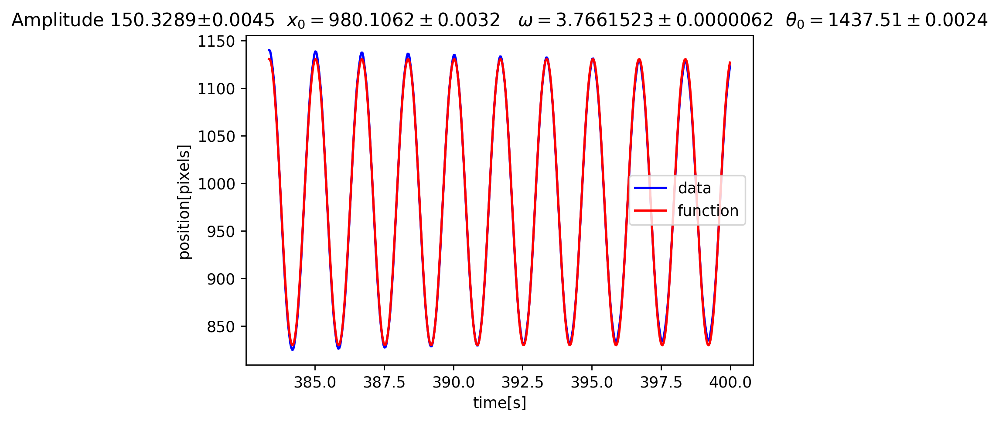

In [19]:
#refit, with the new uncertainties
startingParameters=np.array([amp0,x0,omega,theta0])
#amp,x,omega,theta0=
out=least_squares(residuals,startingParameters,args=args,method='lm')
print(out)

#to find the single parameter uncertainties, we follow the prescription
hessian=out.jac.transpose().dot(out.jac)
alpha=2*hessian  #since we want the hessian of chisquare, and the fitter used the hessian of the cost function=1/2 chisquare
C=np.linalg.inv(alpha)
unc=np.sqrt(np.diagonal(C))

print('Best fit values with single parameter uncertainties are:')
plt.figure()
plt.title(r'Amplitude %8.4f$\pm %6.4f$  $x_0=%8.4f\pm %6.4f$   $\omega=%8.7f\pm %8.7f$  $\theta_0=%6.2f\pm %6.4f$'%
          (out.x[0],unc[0], out.x[1],unc[1],out.x[2],unc[2],out.x[3],unc[3]))

amp0,x0,omega,theta0=out.x
xcalc=xFunction(t[m:n],amp0,x0,omega,theta0).reshape(-1)
bestChiSquare=chisquare(xFunction,t[m:n],x[m:n],uncertainties,amp0,x0,omega,theta0)
#title=r'$\chi^2$=%f A=%f x0=%f $\omega$=%f  $\theta_0=%f$' % (bestChiSquare,amp0,x0,omega,theta0)
#plt.figure()
#plt.title(title)
plt.xlabel('time[s]')
plt.ylabel('position[pixels]')
plt.plot(t[m:n],x[m:n],'b',label='data')
plt.plot(t[m:n],xcalc,'r',label='function')
plt.legend()

In [20]:
unc

array([  4.47581876e-03,   3.17181578e-03,   6.20018237e-06,
         2.42880803e-03])

Now double check to see if the starting guesses matter.  We find that the amplitude and x0 are pretty robust, but that we need to specify theta between 3.7 and 4.2 in order to make the fits work and theta0 around 1300-1550.  Does this make sense?

 active_mask: array([0, 0, 0, 0])
        cost: 193996.05922264027
         fun: array([ -9.32295495e+01,  -9.34875964e+01,  -7.55796206e+01,
        -5.05509245e+01,  -4.75561339e+01,  -4.59463180e+01,
        -5.00540153e+01,  -3.97466366e+01,  -2.94823004e+01,
        -1.94745794e+01,  -8.91749641e+00,  -2.33337334e+00,
         8.68053895e+00,   1.72818655e+01,   1.96837152e+01,
         2.86403801e+01,   3.79029241e+01,   3.90470613e+01,
         4.18144360e+01,   4.25561917e+01,   4.21786209e+01,
         3.42022745e+01,   3.22484284e+01,   4.27615941e+01,
         4.59215702e+01,   4.85891376e+01,   5.02061772e+01,
         4.09474461e+01,   2.45577901e+01,   2.30176620e+01,
         3.08623529e+01,   3.88645055e+01,   3.82847854e+01,
         3.67804531e+01,   3.54115005e+01,   3.03192252e+01,
         2.08668049e+01,   1.52850503e+01,   1.01359509e+01,
         2.97279293e+00,  -6.38391154e+00,  -1.39999940e+01,
        -2.20102459e+01,  -2.85222067e+01,  -3.82867796e+01,
    

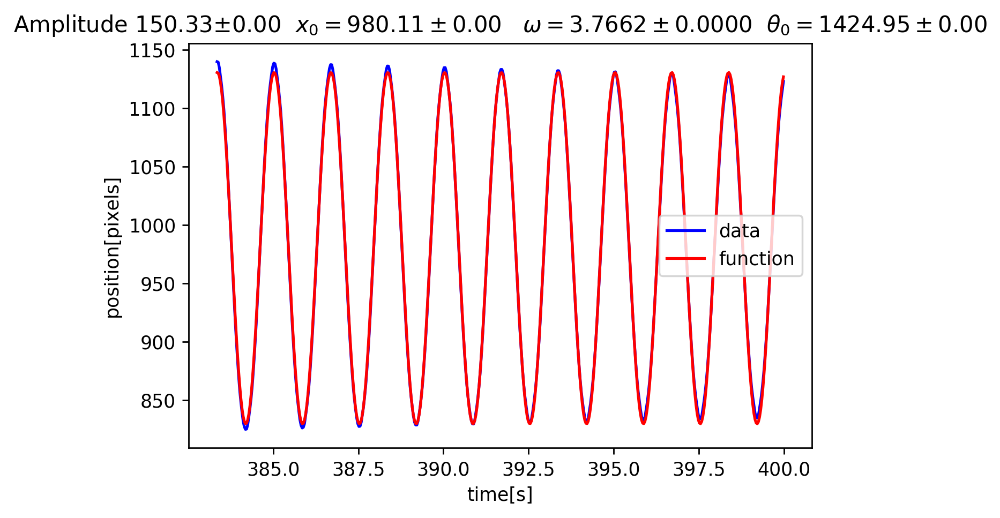

In [21]:
startingParameters=np.array([150,980,3.8,1438])
#amp,x,omega,theta0=
out=least_squares(residuals,startingParameters,args=args,method='lm')
print(out)
#startingParameters=out.x
#out=least_squares(residuals,startingParameters,args=args,method='lm')

#to find the single parameter uncertainties, we follow the prescription
hessian=out.jac.transpose().dot(out.jac)
alpha=2*hessian  #since we want the hessian of chisquare, and the fitter used the hessian of the cost function=1/2 chisquare
C=np.linalg.inv(alpha)
unc=np.sqrt(np.diagonal(C))

print('Best fit values with single parameter uncertainties are:')
plt.figure()
plt.title(r'Amplitude %6.2f$\pm %6.2f$  $x_0=%6.2f\pm %6.2f$   $\omega=%6.4f\pm %6.4f$  $\theta_0=%6.2f\pm %6.2f$'%
          (out.x[0],unc[0], out.x[1],unc[1],out.x[2],unc[2],out.x[3],unc[3]))

amp0,x0,omega,theta0=out.x
xcalc=xFunction(t[m:n],amp0,x0,omega,theta0).reshape(-1)
bestChiSquare=chisquare(xFunction,t[m:n],x[m:n],uncertainties,amp0,x0,omega,theta0)
plt.xlabel('time[s]')
plt.ylabel('position[pixels]')
plt.plot(t[m:n],x[m:n],'b',label='data')
plt.plot(t[m:n],xcalc,'r',label='function')
plt.legend()


Now we know $x_0$.  $y_0$ is harder to get, since we never go through zero.  But we proceed and see how well we can do with a simple fit.

Let's go back to the small angle pendulum solution, which is approximately correct at small amplitudes, which we have at long times.  Then we have

\begin{equation}\theta=\theta_0\cos(\omega t+\phi)\end{equation}
\begin{equation}x-x_0=l\sin(\theta)=l\sin(\theta_0\cos(\omega t+\phi))\approx l\theta_0\cos(\omega t+\phi)\end{equation}
\begin{equation}y-y_0=l(1-\cos(\theta))=l(1-\cos(\theta_0\cos(\omega t+\phi))0\approx l\theta_0^2\frac{\cos^2(\omega t+\phi)}{2}\end{equation}
\begin{equation}\end{equation}

Note that here we have defined $(x0,y0$ as the rest position of the pendulum (so y is always positive) and we have used the small angle approximation $\cos\theta\approx 1-\frac{\theta^2}{2}$ in the last equation.

Now we can proceed and fit the y data.  But we have three choices:  fit four parameters in the y equation and compare them to the x equation; fix the parameters in the y equation to those determined by the x equation, or simultaneously fit both x and y.  What are the advantages of each of the three?  

Start by defining yResiduals, with all four parameters free.  $B=\frac{l\theta_0^2}{2}.$

 active_mask: array([0, 0, 0, 0])
        cost: 121.46765093087851
         fun: array([-0.55398697, -0.50665737, -0.39076783, -0.77853509, -0.66387277,
       -0.66366458, -0.9289641 , -0.77363368, -0.45858629, -0.44526605,
       -0.20850018, -0.06959921, -0.12209237,  0.07908126,  0.43223238,
        0.31473219,  0.59015123,  0.61002993,  0.62583941,  0.65134825,
        0.66525093,  0.85239537,  0.97635746,  0.6307452 ,  0.75486988,
        0.86418008,  0.97093602,  0.99485323,  1.26219402,  1.18175772,
        0.96989743,  0.79180077,  0.73451025,  0.73063679,  0.64917495,
        0.61292845,  0.48400341,  0.37507667,  0.14654976, -0.01109301,
       -0.17691969, -0.32962178, -0.57215426, -0.75611538, -0.9054058 ,
       -1.10988674, -1.03943478, -0.98447469, -1.10337776, -0.8608758 ,
       -0.59724835, -0.54762563, -0.60455119, -0.87769769, -0.77976013,
       -0.88494931, -0.82509741, -0.81103101, -0.52169294, -0.48440687,
       -0.28615113, -0.08556354, -0.12941819,  0.101239

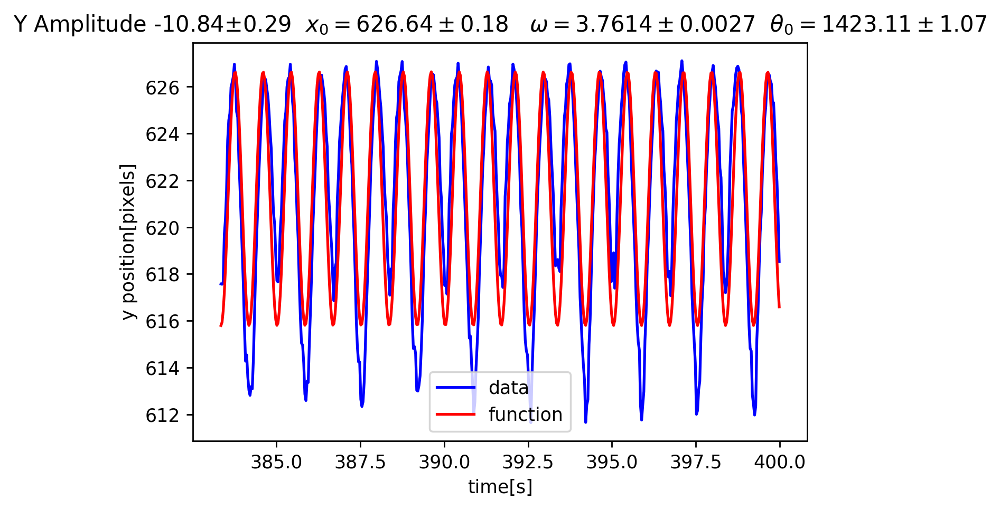

In [22]:
def yResiduals(parameters,*args):
    t,y,sigma=args
    B,y0,omega,theta0=parameters
    return ((B*np.cos(omega*t-theta0)**2+y0-y)/sigma)

#test it out with our function
fitParameters=np.array([amp0,x0,omega,theta0])
args=(t[m:n],y[m:n],uncertainties)
yout=least_squares(yResiduals,fitParameters,method='lm',args=args)
print(yout)

yhessian=yout.jac.transpose().dot(yout.jac)
yalpha=2*yhessian  #since we want the hessian of chisquare, and the fitter used the hessian of the cost function=1/2 chisquare
yC=np.linalg.inv(yalpha)
yunc=np.sqrt(np.diagonal(yC))

plt.figure()
plt.title(r'Y Amplitude %6.2f$\pm %6.2f$  $x_0=%6.2f\pm %6.2f$   $\omega=%6.4f\pm %6.4f$  $\theta_0=%6.2f\pm %6.2f$'%
          (yout.x[0],yunc[0], yout.x[1],yunc[1],yout.x[2],yunc[2],yout.x[3],yunc[3]))

B,y0,omega,theta0=yout.x
ycalc=(B*np.cos(omega*t[m:n]-theta0)**2+y0)
plt.xlabel('time[s]')
plt.ylabel('y position[pixels]')
plt.plot(t[m:n],y[m:n],'b',label='data')
plt.plot(t[m:n],ycalc,'r',label='function')
plt.legend()

A few comments:
    1.  The direction of the data y axis is opposite to the direction of the function y axis.  That is why B is negative.
    2.  The "bottom" of the pendulum is at 640, the top of the arc goes to 626 or 622.5
    3.  What can explain the alternating peak heights?  How can we differentiate the two models.  
    
We fix the model so the y axis is "down" like in the data.  And we refit the data, but now also plot the residuals.



 active_mask: array([0, 0, 0, 0])
        cost: 121.46765093080566
         fun: array([-0.55398698, -0.50665742, -0.39076792, -0.77853521, -0.66387292,
       -0.66366474, -0.92896426, -0.77363383, -0.45858643, -0.44526616,
       -0.20850025, -0.06959925, -0.12209237,  0.0790813 ,  0.43223246,
        0.31473229,  0.59015136,  0.61003007,  0.62583956,  0.65134839,
        0.66525107,  0.85239548,  0.97635755,  0.63074526,  0.7548699 ,
        0.86418007,  0.97093598,  0.99485317,  1.26219393,  1.18175761,
        0.96989731,  0.79180065,  0.73451014,  0.73063669,  0.64917487,
        0.6129284 ,  0.48400339,  0.37507667,  0.1465498 , -0.01109295,
       -0.17691961, -0.32962168, -0.57215415, -0.75611527, -0.9054057 ,
       -1.10988664, -1.03943469, -0.98447463, -1.10337772, -0.86087578,
       -0.59724836, -0.54762566, -0.60455124, -0.87769776, -0.7797602 ,
       -0.88494938, -0.82509749, -0.81103108, -0.521693  , -0.48440691,
       -0.28615115, -0.08556355, -0.12941817,  0.101239

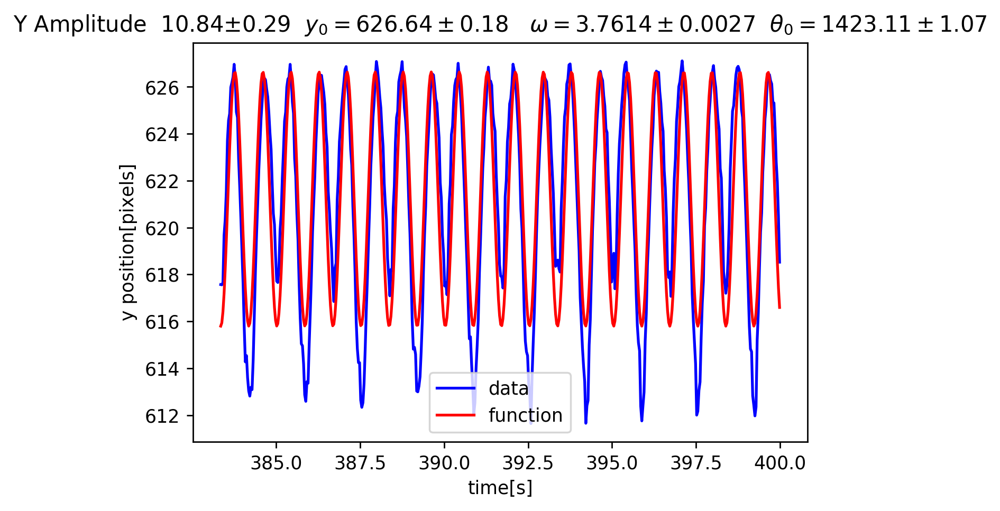

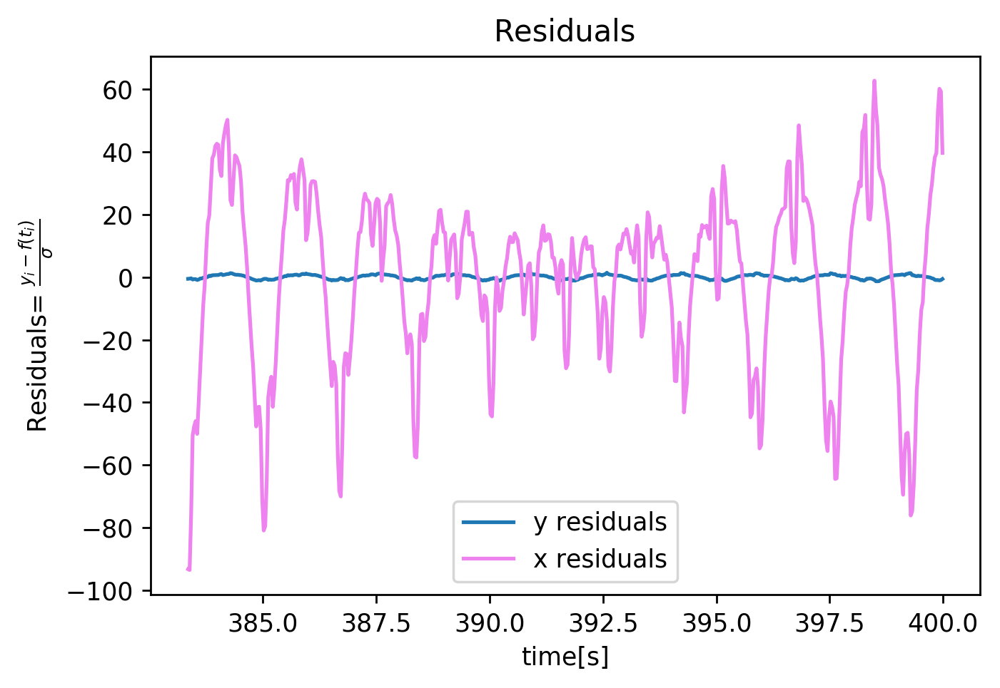

In [23]:
def yResiduals(parameters,*args):
    t,y,sigma=args
    B,y0,omega,theta0=parameters
    return ((y0-B*np.cos(omega*t-theta0)**2-y)/sigma)

#test it out with our function
fitParameters=np.array([amp0,x0,omega,theta0])
args=(t[m:n],y[m:n],uncertainties)
yout=least_squares(yResiduals,fitParameters,method='lm',args=args)
print(yout)

yhessian=yout.jac.transpose().dot(yout.jac)
yalpha=2*yhessian  #since we want the hessian of chisquare, and the fitter used the hessian of the cost function=1/2 chisquare
yC=np.linalg.inv(yalpha)
yunc=np.sqrt(np.diagonal(yC))

plt.figure()
plt.title(r'Y Amplitude %6.2f$\pm %6.2f$  $y_0=%6.2f\pm %6.2f$   $\omega=%6.4f\pm %6.4f$  $\theta_0=%6.2f\pm %6.2f$'%
          (yout.x[0],yunc[0], yout.x[1],yunc[1],yout.x[2],yunc[2],yout.x[3],yunc[3]))

B,y0,omega,theta0=yout.x
ycalc=(y0-B*np.cos(omega*t[m:n]-theta0)**2)
plt.xlabel('time[s]')
plt.ylabel('y position[pixels]')
plt.plot(t[m:n],y[m:n],'b',label='data')
plt.plot(t[m:n],ycalc,'r',label='function')
plt.legend()
plt.figure()
plt.title('Residuals')
plt.xlabel('time[s]')
plt.ylabel(r'Residuals= $\frac{y_i-f(t_i)}{\sigma}$')
plt.plot(t[m:n],yout.fun,label='y residuals')
plt.plot(t[m:n],out.fun,label='x residuals',color='violet')
plt.legend()

#print out parameters and uncertainties for both x fit and y fit
print()
print('The parameters and uncertainties are:')
print(np.array([out.x,unc,yout.x,yunc]).transpose())

Now the amplitude has the right sign.  

We now know $(x_0,y_0)$ and we can proceed with converting our x-y measurements into $\theta$ measurements.  

In [24]:
#  First just print out length of pendulum in pixels and theta0.  We don't actually use these except for sanity checks.
A=amp0
B=yout.x[0]
print('A=%6.2f  B=%6.2f'%(A,B))
theta0=2*B/A
length=A/theta0
print('length = %6.2f theta0=%6.4f'%(length,theta0))


A=150.33  B= 10.84
length = 1042.25 theta0=0.1442


# Two dimensional fit:  simultaneously fitting to both x and y

Two ways to do this
1.  Convert x and y to a one-d variable (theta, or something related) and do a one d fit
2.  Have the fitting function fit calculated x and y directly, and a do a 2 d fit directly.  This involves minimizing a general function, rather than doing least squares.  

To do (1) we go back to the old equations
\begin{equation}\theta=\theta_0\cos(\omega t+\phi)\end{equation}
\begin{equation}x-x_0=l\sin(\theta)=l\sin(\theta_0\cos(\omega t+\phi))\approx l\theta_0\cos(\omega t+\phi)\end{equation}
\begin{equation}y-y_0=l(1-\cos(\theta))=l(1-\cos(\theta_0\cos(\omega t+\phi))0\approx l\theta_0^2\frac{\cos^2(\omega t+\phi)}{2}\end{equation}

We can get the exact result:
\begin{equation}\frac{y-y_0}{x-x_0}=\frac{1-\cos\theta}{\sin\theta}\end{equation}

We will define the yx function:
\begin{equation}\rm{yx}(\theta)=\frac{1-\cos\theta}{sin\theta}\end{equation}

with the th function as its inverse:
\begin{equation}\rm{th}(x)=\rm{yx}^{-1}(x)\end{equation}

We note that yx(0)=0.

We could then get yx for the data and calculate yx and fit.  We did this in 2017 and you can follow that process if you desire.  

In 2018 we will work on version (2).  From our pendulum model we will calculate x and y.  
$$\begin{align}
x(t)&=x_0+l\cos(\theta_0\cos(\omega t+\phi)+\delta)\\
x(t)&=y_0+l\sin(\theta_0\cos(\omega t+\phi)+\delta)\\
\end{align}$$


I was originally thinking we could have six fit parameters-$x_0, y_0$, the initial amplitude $\theta_0$, the time difference between calculation and data, $dt$, and we will also fit the acceleration due to gravity and a factor on the overall drag calculation.  However, the initial amplitude and the time difference are dependent, so we will fix theta0 to a reasonable value, and allow dt to float.  The parameter $\delta$ incorporates the "tilt" of the pendulum.  

Because it is expensive in computation time and changes things very little, we will leave out the compound pendulum, and just use the pendulum with drag.  

Total Mass  0.06766535114503816
lcm  0.6871271490708484  l  0.690705
I, IMass, IString: 0.032058419581795325 0.03195294491254342 0.0001054746692519084


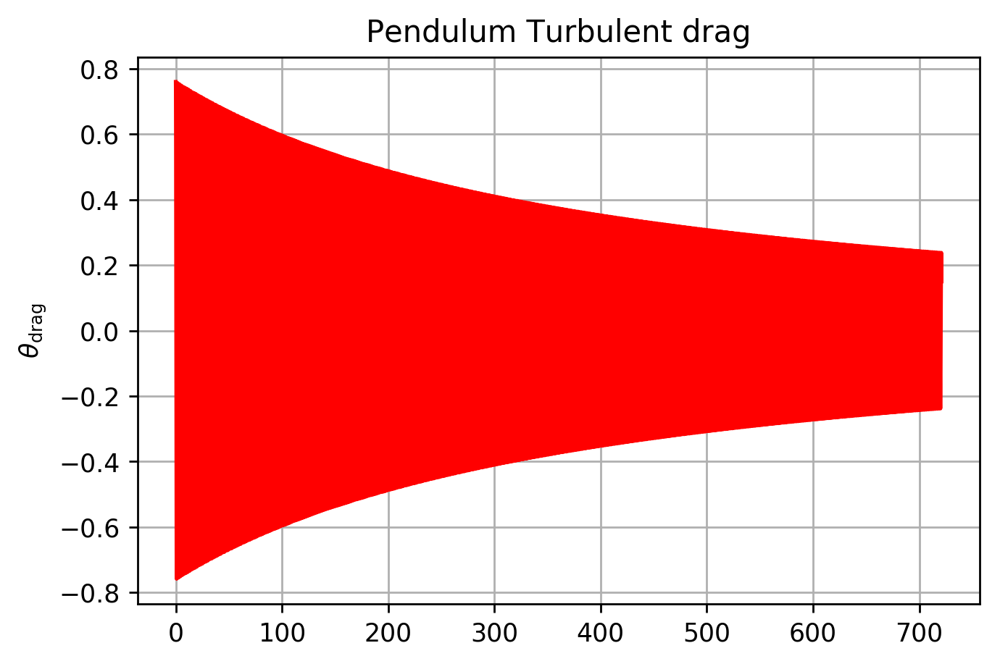

In [25]:
from scipy.integrate import odeint
from scipy.integrate import quadrature
import pendulumParameters2018 as p

#and now we set up some constants (measured quantities)
l=p.l # #length of pendulum, meters
g=9.8 # acceleration of gravity on Earth's surface, meters/s**2
airViscosity=1.827e-5   #Pa-s  
mass=p.mMass #0.029 #kg  mass of pendulum bob
radius=p.dMass/2 #0.00949 #m radius of pendulum bob
wireDiameter=p.stringDiameter #0.00071 # m
b=6*np.pi*airViscosity*radius
airPressure=92.6 #kPa
standardAirDensity=1.225 # kg/m**3
standardAirPressure=101.325 #kPa
airDensity=airPressure/standardAirPressure*standardAirDensity
omega_0=np.sqrt(g/l)
T=2*np.pi/omega_0  #  period, seconds
theta_0=0.76


def ReynoldsNumber(velocity):
    '''Calculates Reynolds number for a pendulum of length l and angular velocity omega.  Because it is used 
    in an logarithmic interpolation, we impose 1 as a lower cutoff'''
    R=airDensity*velocity*radius*2/airViscosity
    return np.maximum(R,1)

RN=np.array([1,4,10,40,100,400,1000,2000,4000,10000])
DC=np.array([24,8,4,1.7,1.1,0.6,0.45,0.4,0.35,0.35])
import scipy.interpolate
logRN=np.log(RN)  #interpolation in log ReynoldsNumber will be more sensible
splineInterpolation=scipy.interpolate.interp1d(logRN,DC,kind='cubic')

def DragCoefficientSpline(reynoldsNumber):
    return splineInterpolation(np.log(reynoldsNumber))

area=np.pi*radius**2
velocityAtR1=airViscosity/(2*airDensity*radius)
ceta= 6*np.pi*airViscosity*radius
ct=.5*airDensity*area
def fdrag(velocity):
    v=abs(velocity)
    if v<velocityAtR1:
        force=ceta*v
    else:
        force=ct*v**2*DragCoefficientSpline(ReynoldsNumber(v))
    return force
drag=np.vectorize(fdrag)  #so that drag can accept either a scalar or an array

wireData=np.array([20,1.88,50,1.57,100,1.39,200,1.25,500,1.10,1000,.972,2000,.876,5000,.972,10000,1.092,20000,1.164,50000,1.178,100000,1.164]).reshape(12,2)
logWireData=np.log(wireData[:,0])  #interpolation in log ReynoldsNumber will be more sensible
interpolation=scipy.interpolate.interp1d(logWireData,wireData[:,1],kind='cubic')
def DragWire(reynoldsNumber):
    return interpolation(np.log(reynoldsNumber))

v20=20*airViscosity/(wireDiameter*airDensity)
v20_Coefficient=DragWire(20)*airDensity*v20*wireDiameter/2
def dWireForce_Scalar(velocity):
    v=abs(velocity)  #we make all velocities positive for this calculation
    if(v<v20):
        dforce=v20_Coefficient*v
    else:
        reynoldsNumber=airDensity*v*wireDiameter/airViscosity
        dforce=DragWire(reynoldsNumber)*airDensity*v**2*wireDiameter/2  #units are N/m since we put dz=1
    return dforce

dWireForce=np.vectorize(dWireForce_Scalar)



def dTorque(rPrime,omega):
    '''Calculates the torque from an element of wire at rprime moving with angular velocity omega'''
    return rPrime*dWireForce(rPrime*omega)
vdTorque=np.vectorize(dTorque)

def wireTorque(anOmega):
    om=np.abs(anOmega)
    if(np.isscalar(om)):
        return quadrature(dTorque,0,l,args=omyy)
    else:
        retval=np.zeros_like(om)
        for i in np.arange(0,om.size):
            retval[i]=quadrature(vdTorque,0,l,args=om[i])[0]
        return retval
    
def ChebyshevCoefficients(func,a,b,n):
    '''Evaluate n chebyshev coefficients for func evaluated between a and b;  based on NR 5.8.7'''
    range=0.5*(b-a)  
    average=0.5*(b+a)
    x=range*np.cos((np.arange(0,n)+0.5)*np.pi/n)+average  #maps from -1 to 1 onto a-b
    v=func(x).reshape(1,n)  #row array of function values
    A=np.cos(np.pi/n*np.arange(0,n)*((np.arange(0,n)+0.5)).reshape(n,1))
    C=np.dot(v,A)*2/n 
    return C
    
    
def ChebEval(x,c,a,b):
    '''Evaluate a chebyshev series c(x), for the range a-b'''
    range=0.5*(b-a)
    average=0.5*(a+b)
    mapped=(x-average)/range
    return np.polynomial.chebyshev.chebval(mapped,c)-c[0]/2

omegaArray=np.linspace(0,10,500)
ChebyshevCoefficientsForWireTorque=ChebyshevCoefficients(wireTorque,omegaArray[0],omegaArray[-1],60).reshape(60,)

def wireTorqueCheb(x):
    return ChebEval(np.abs(x),ChebyshevCoefficientsForWireTorque[:10],omegaArray[0],omegaArray[-1])

def pendulumWithTurbulentDragAndString(y,t):
    theta, omega,energy = y
    dydt = np.array([omega, 
                     - g/l*np.sin(theta)-(drag(l*omega)/(mass*l)
                      +wireTorqueCheb(l*omega)/(mass*l**2))*np.sign(omega),
                     (drag(l*omega)*l+wireTorqueCheb(l*omega))*np.abs(omega)])
    return dydt
#use f0 for the initial conditions
f0 = np.array([theta_0, 0.0,0.0])
                     
dragSolutionWithTurbulenceAndString = odeint(pendulumWithTurbulentDragAndString, f0, t)

plt.figure()
plt.title('Pendulum Turbulent drag')
plt.ylabel(r'$\theta_{\rm{drag}}$')
#axarr[0].plot(t, solrk[:, 0], 'k', label='rk omega(t)')
plt.plot(t, dragSolutionWithTurbulenceAndString[:, 0], 'r', label='rk theta(t)')
plt.grid()



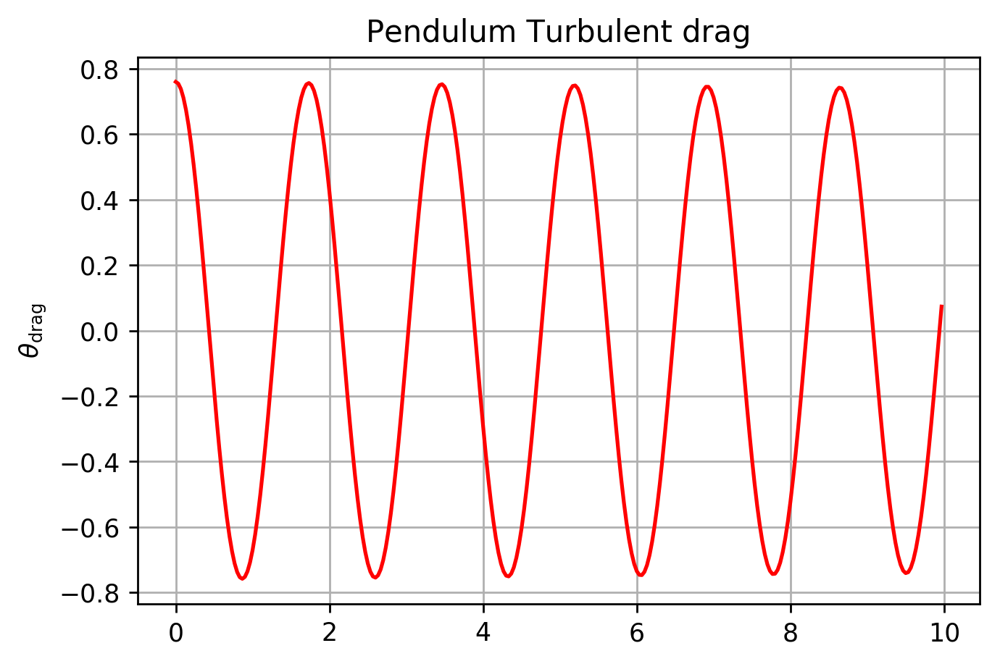

In [26]:
plt.figure()
plt.title('Pendulum Turbulent drag')
plt.ylabel(r'$\theta_{\rm{drag}}$')
#axarr[0].plot(t, solrk[:, 0], 'k', label='rk omega(t)')
plt.plot(t[:300], dragSolutionWithTurbulenceAndString[:300, 0], 'r')
plt.grid()


We now define a function *pendulum*- exactly like before but with a scaling factor $\alpha$ for the drag and the acceleration $g$ as a free parameter.  This is the function that is called by odeint.

We define a function Chi2xy(parameters,args), which returns a $\chi^2$ function that includes both x and y calculations.  This function will be passed to scipy.optimize.minimize, which will adjust the elements in the parameters tuple to minimize chisquare. 

\begin{equation}\chi^2=\sum_{i=0}^{i=N}\left(\frac{x(t_i)-x_i}{\sigma_{x,i}}\right)^2+\left(\frac{y(t_i)-y_i}{\sigma_{y,i}}\right)^2\end{equation}

Here parameters is a tuple that contains the parameters to be minimized, which will include the acceleration due to gravity, $g$, a drag multiplier $\alpha$, the tilt of the camera angle $\delta$, the pixel "center" $x_0,y_0$, and the initial conditions of the motion: $\theta_0, \omega$, and the time offset $dt$.  

$dt$ is a little special.  Our data are taken at fixed intervals (1/30 s) and we arbitrarily define some starting time t.  We can easily set up odeint so that it returns the calculation every 1/30 of a second as well.  But how do we handle an arbitrary time offset between the calculated times and the time of the camera?  $dt$ does this for us.  We break the integration up into two pieces- one between $t=0$ and $t=dt$ (where $dt$ is a parameter we fit) and the other between $dt$ and $dt+n/30$, which we use to do the chisquare calculation.

odeint returns $\theta(t_i)$.

We convert this to 

$$\begin{align}
x(t_i)&=x_0+l\sin(\theta(t_i)+\delta)\\
y(t_i)&=y_0+l\cos(\theta(t_i)+\delta)
\end{align}
$$


In [27]:
t2=t[0:100]
neval=0
def pendulum(y,t,*pargs):
    theta, omega= y
    g,alpha=pargs
    global neval
    neval=neval+1
    if(neval<1):
        print(neval,theta,omega,g,l,mass,alpha)

    dydt = np.array([omega, 
                     - g/l*np.sin(theta)-(alpha*drag(l*omega)/(mass*l)
                      +alpha*wireTorqueCheb(l*omega)/(mass*l**2))*np.sign(omega)])
    return dydt

def Chi2xy(parameters,t,x,y,lpixel,x0,y0,showSolution):
    global sol # so we can plot out the solution
    global neval

    dt,theta0,g,alpha,delta=parameters
    print('x0 %f y0 %f dt %g theta0 %g g %g alpha %g delta %f lpixel %f'%(x0,y0,dt,theta0,g,alpha,delta,lpixel))
    f0 = np.array([theta0, 0.0])
    tprime=np.linspace(t[0]-dt,t[0],2)
    pargs=(g,alpha)
    neval=0
    sol0=odeint(pendulum,f0,tprime,args=pargs) #integrate to dt                  
    sol = odeint(pendulum, sol0[-1], t,args=pargs)
    theta=sol[:,0]+delta
    chi2=np.sum((x0+lpixel*np.sin(theta)-x)**2+ (y0+lpixel*np.cos(theta)-y)**2)
    print('neval=',neval,'chi2= %g'%chi2)
    if showSolution:
        plt.figure()
        plt.plot(t,1000+1000*np.sin(sol[:,0]))
        plt.figure()
        plt.plot(t,x0+lpixel*np.sin(theta))
        plt.plot(t,x)
        plt.figure()
        plt.plot(t,y0+lpixel*np.cos(theta))
        plt.plot(t,y)

    return chi2

#second version to fit for lpixel, x0,y0, delta
def Chi2XY2(parameters,t,x,y,dt,theta0,g,alpha,showSolution):
    lpixel,x0,y0,delta=parameters
    return Chi2xy((dt,theta0,g,alpha,delta),t,x,y,lpixel,x0,y0,showSolution)

m=0
n=1000
x0=980
y0=627
fitParameters=np.array([x0,y0,0.6,0.7,9.8,1.0])
args=(t[m:n],x[m:n],y[m:n])



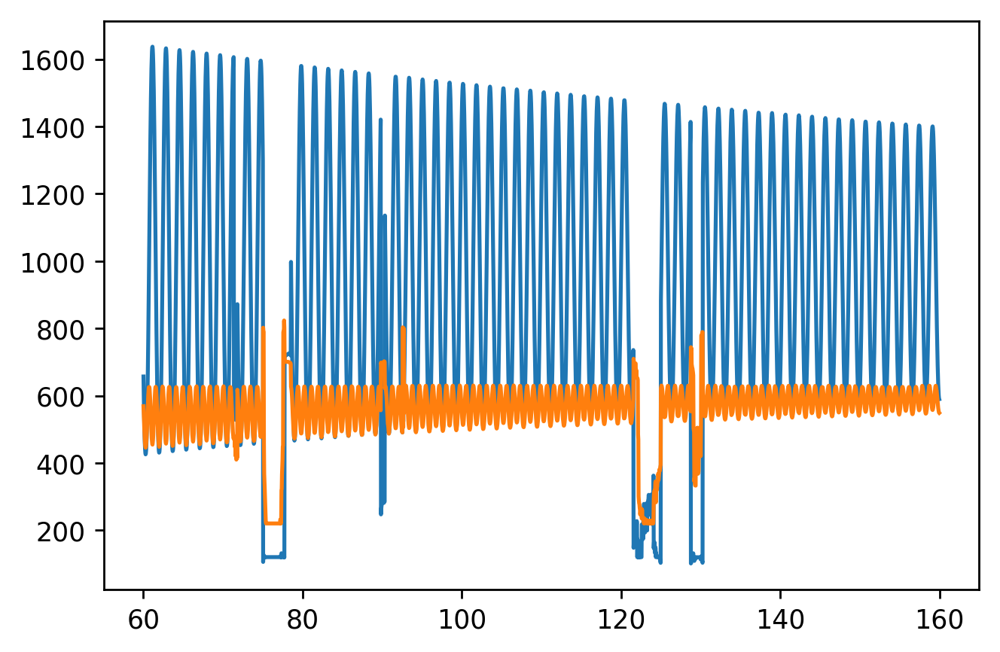

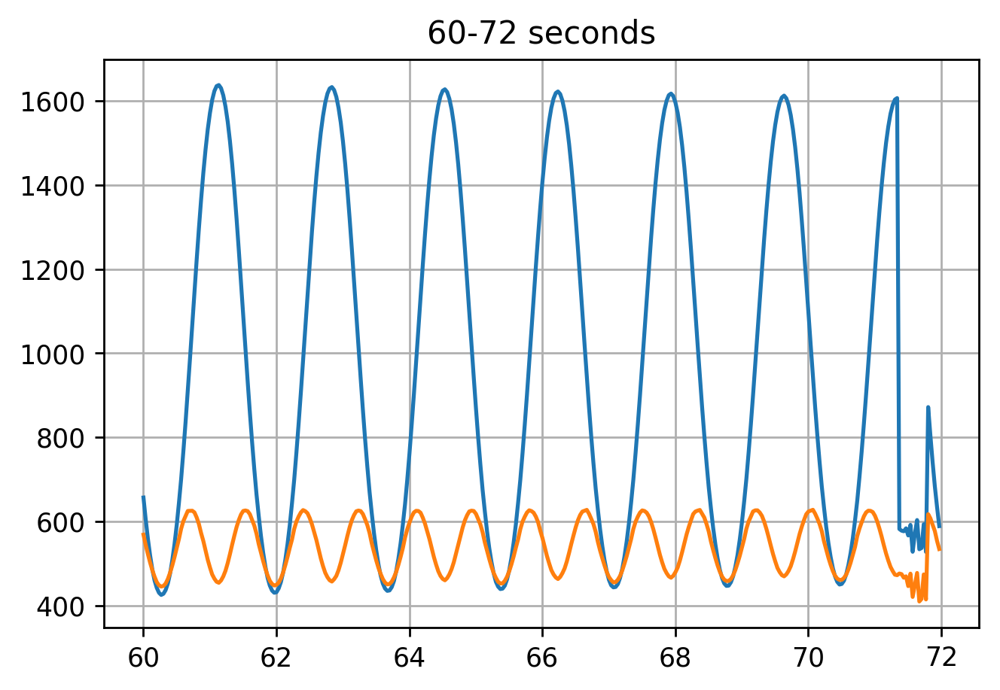

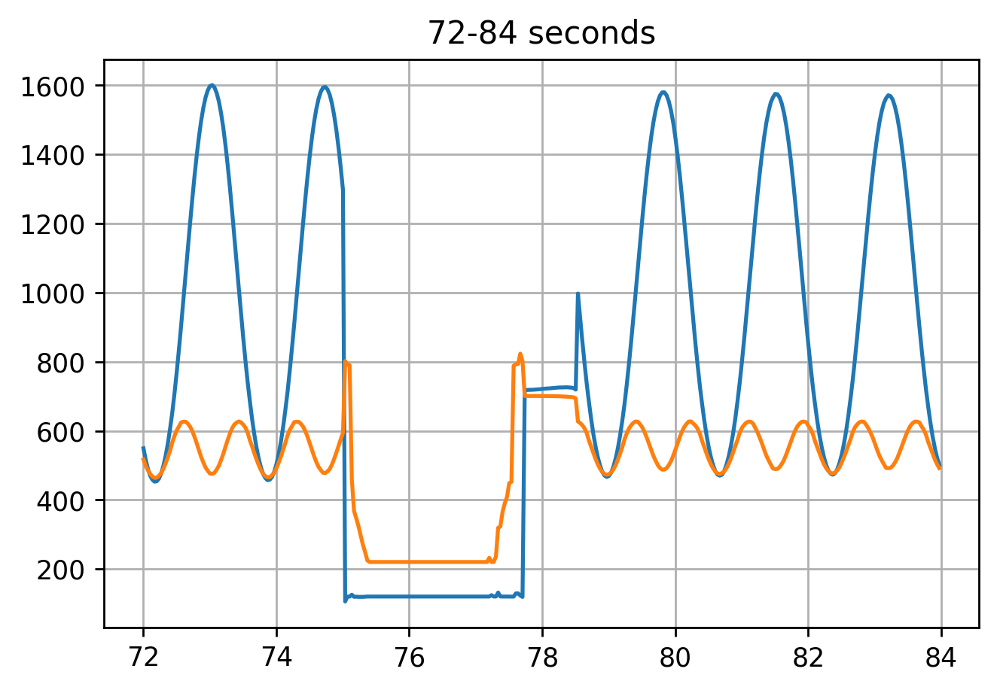

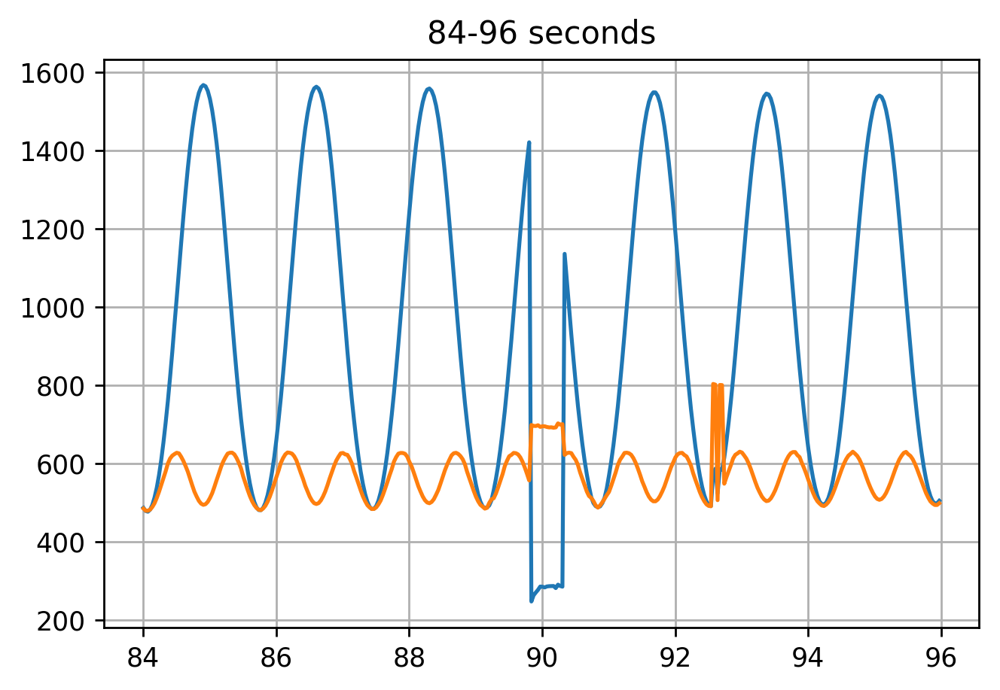

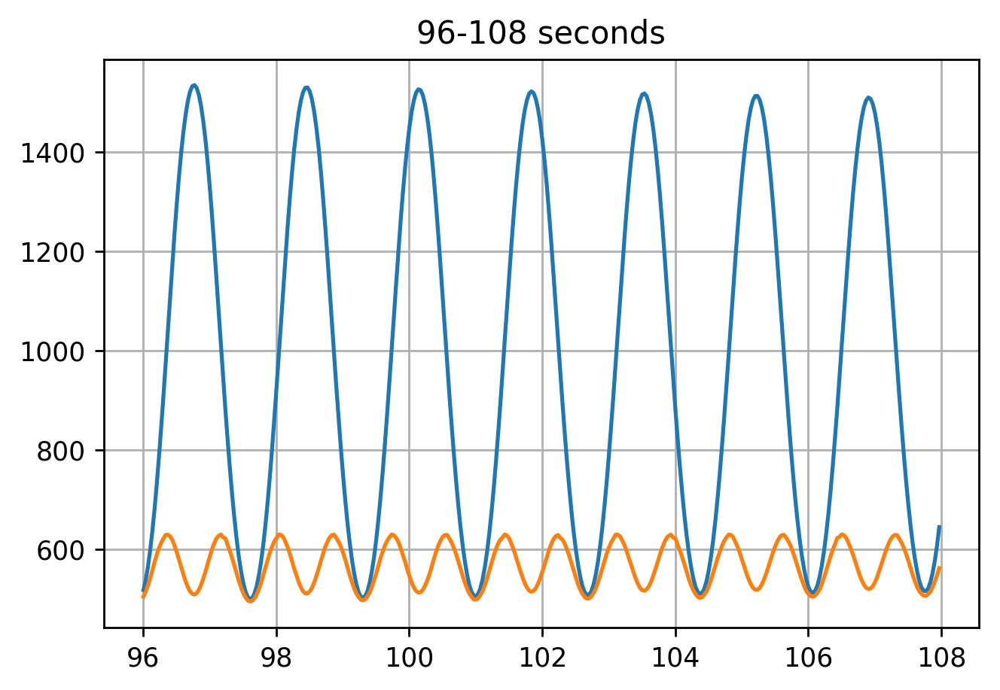

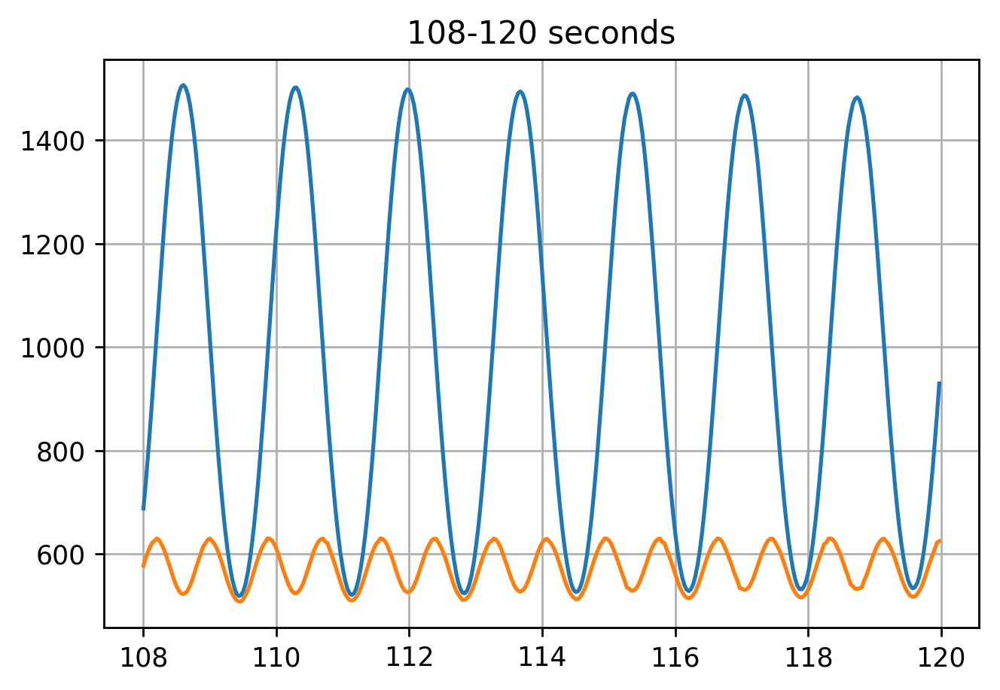

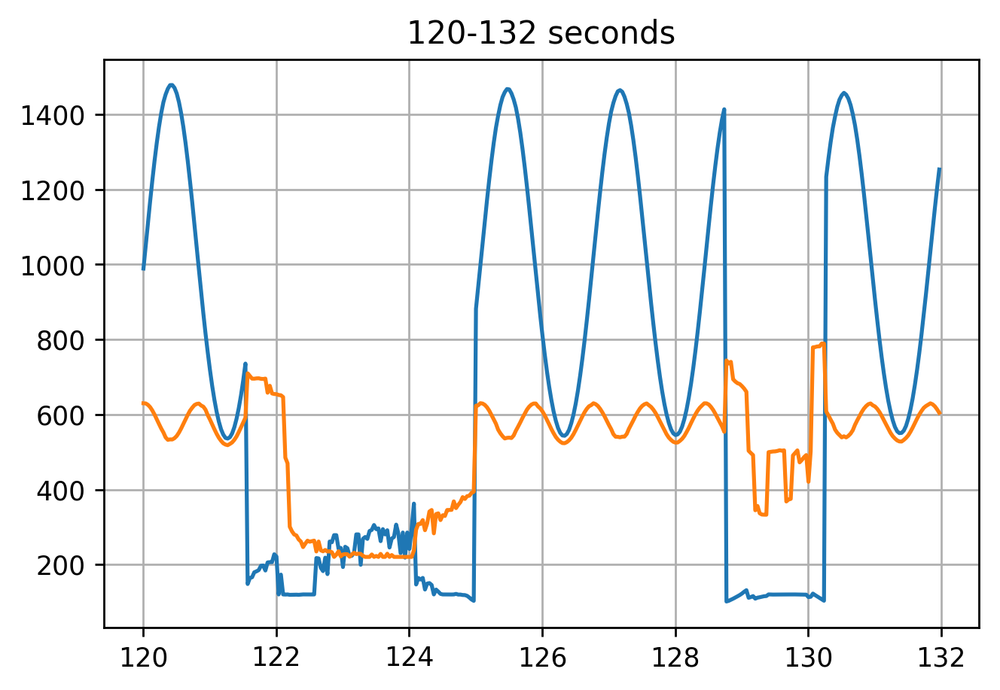

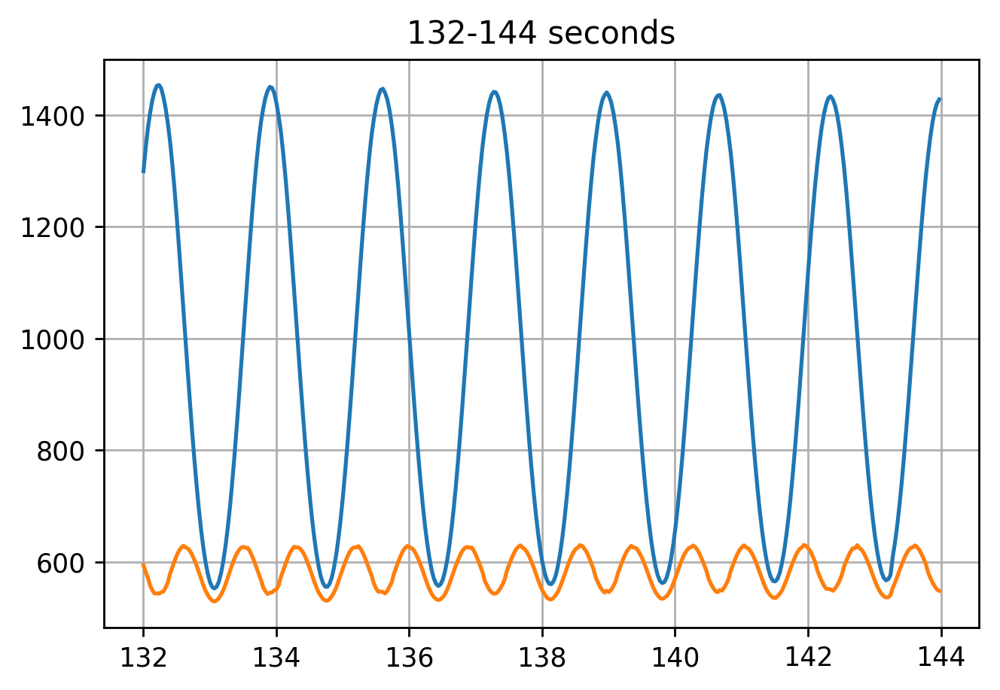

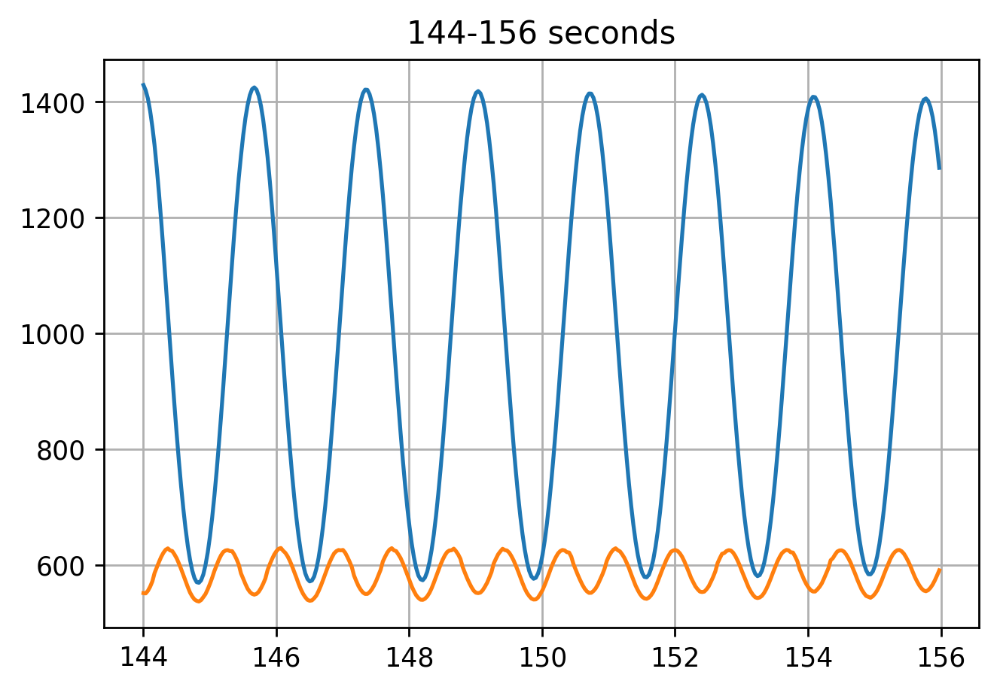

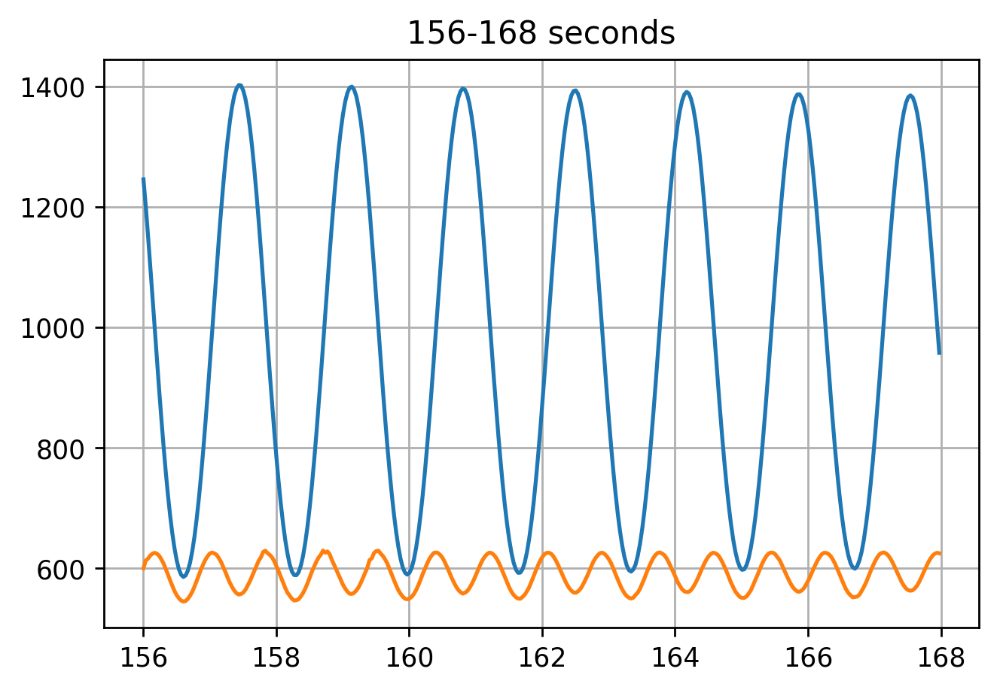

In [28]:
m=60*30
n=m+3000
plt.figure()
plt.plot(t[m:n],x[m:n])
plt.plot(t[m:n],y[m:n])

for m in range(60*30,160*30,360):
    n=m+360
    plt.figure()
    plt.title('%d-%d seconds'%(m//30,n//30))
    plt.plot(t[m:n],x[m:n])
    plt.plot(t[m:n],y[m:n])
    plt.grid()



There are several places where the automatic location doesn't work.  I looked at those in detail; we could probably fix them with various "background subtractor" tweaks.  We won't do it, though, but rather exclude those areas from the sum.  Since we have complete control of our fitting function we will simply ignore data in the bad regions: 71-72 seconds, 74-79, 89-93, 121-131; and fit the region 60-168 seconds.  (We could start at zero, and we may try that later, but there might be some additional uncertainty about initial conditions then).

numpy has a special type- the *masked array* that is designed to ignore invalid data.  We will use it to describe the data.  A masked array has a bit associated with each element that you can "turn on" to ignore the data.



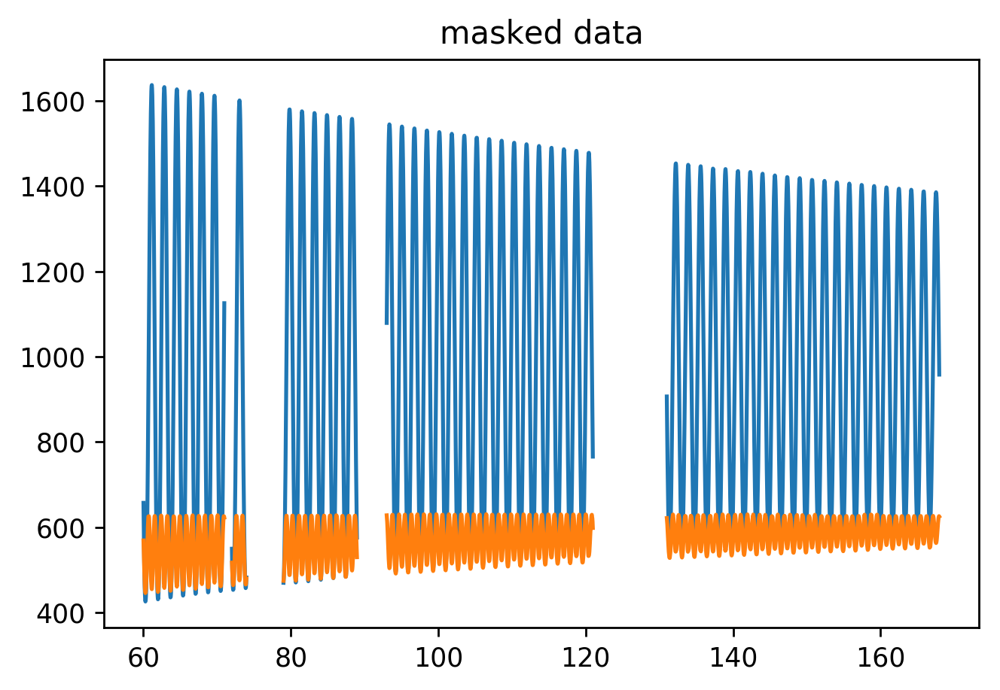

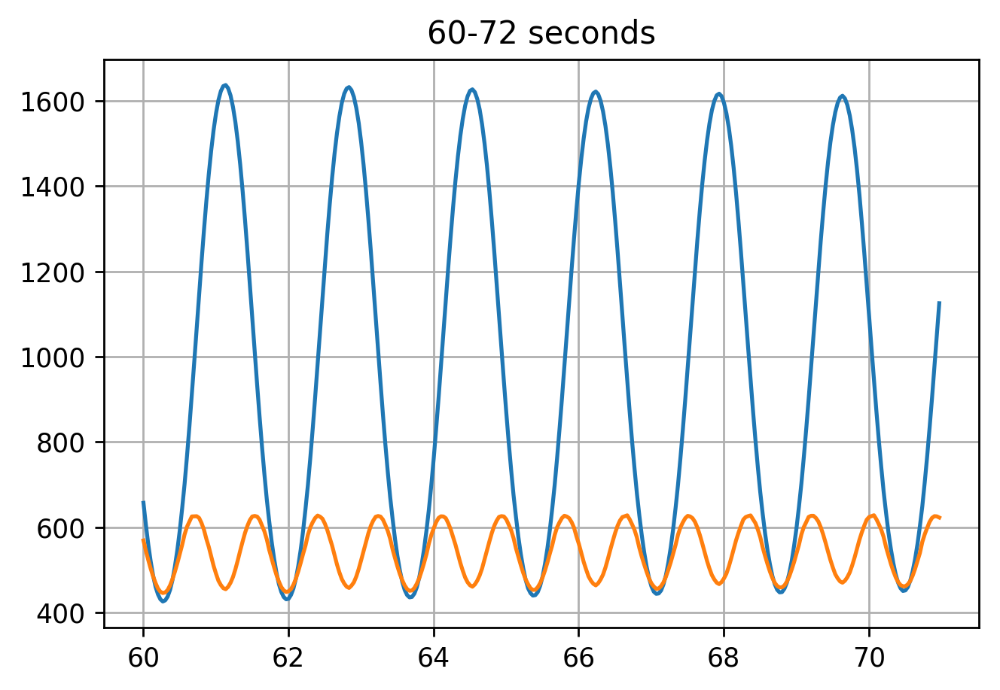

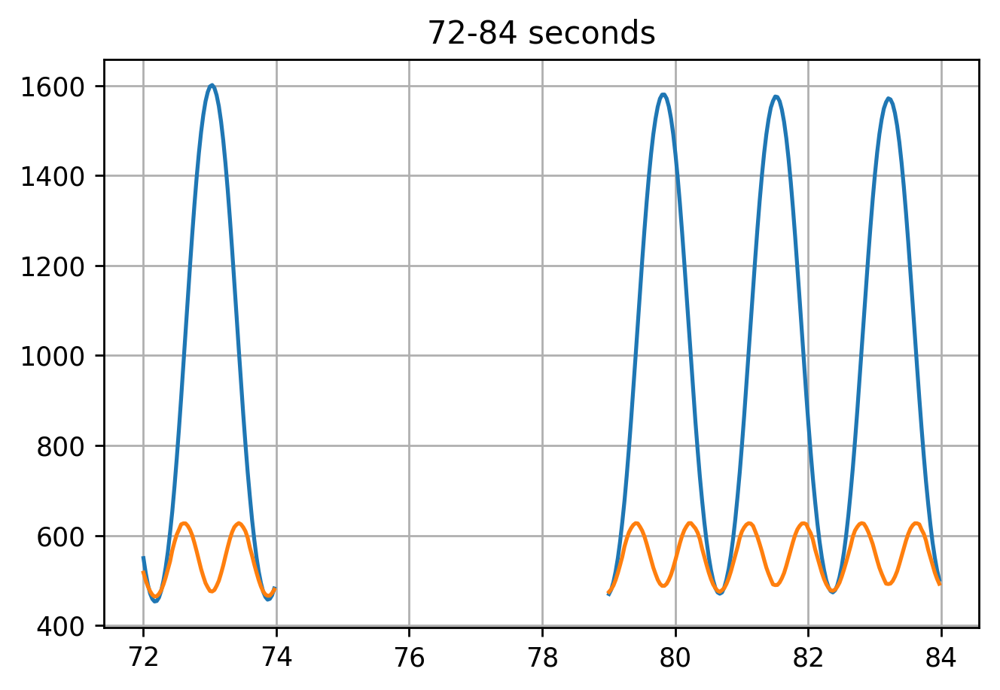

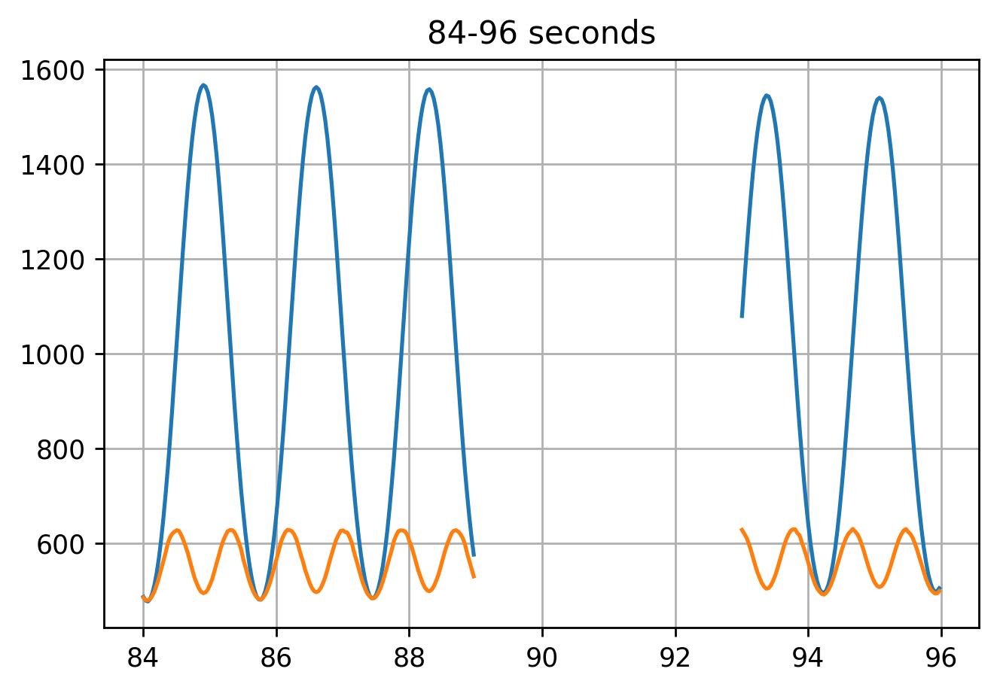

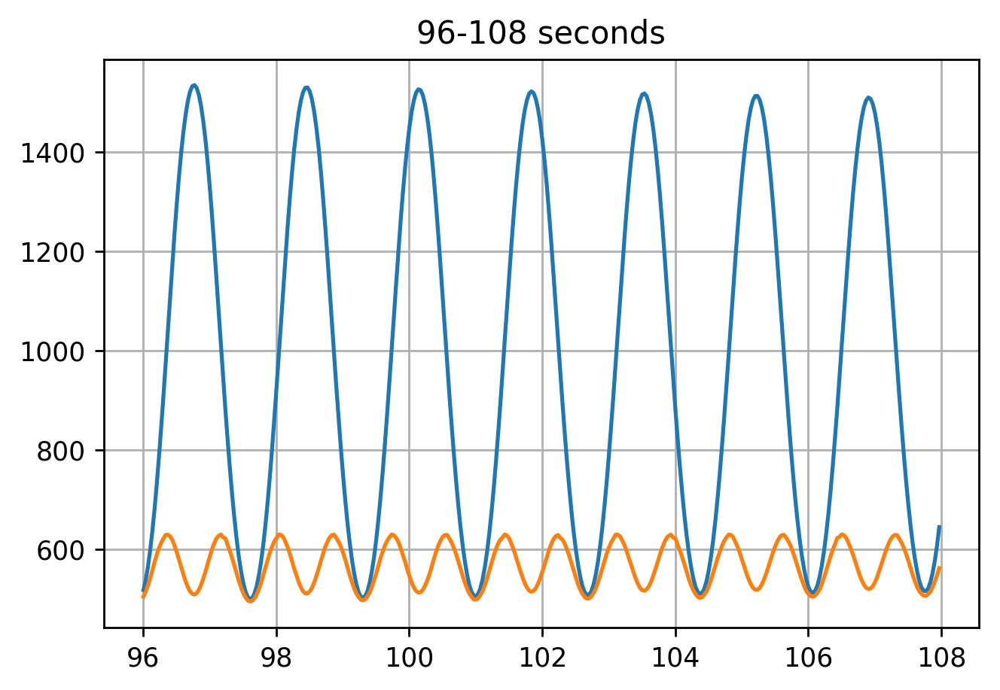

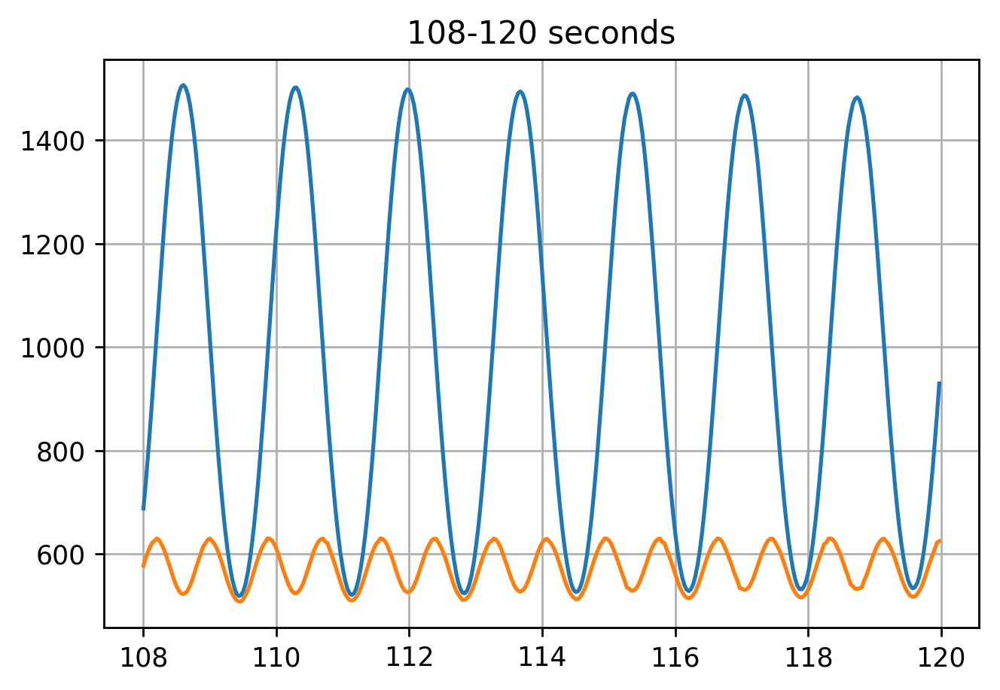

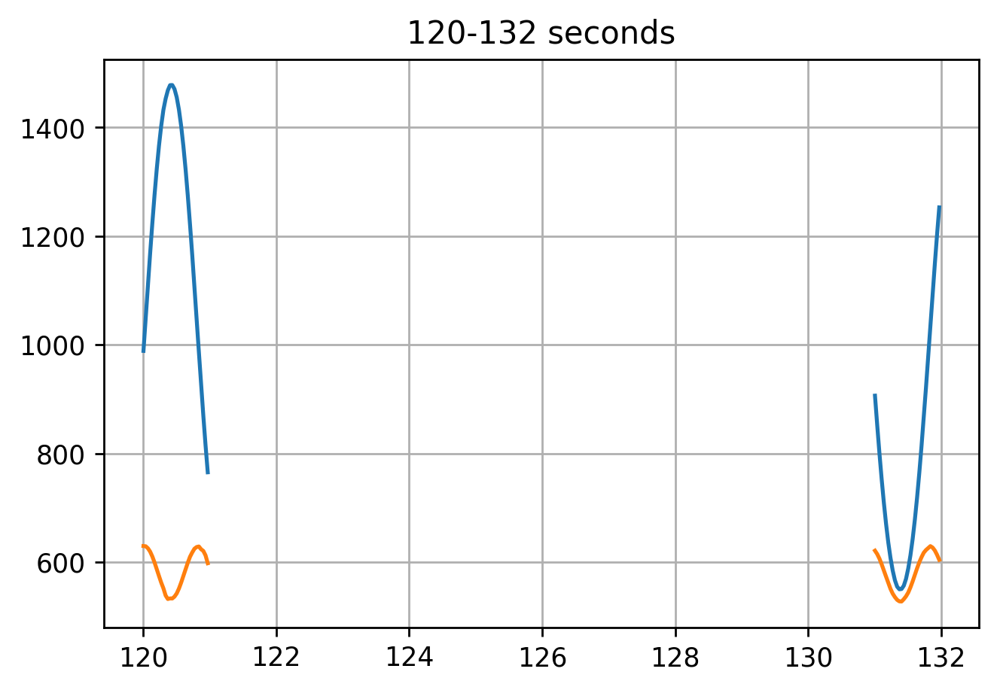

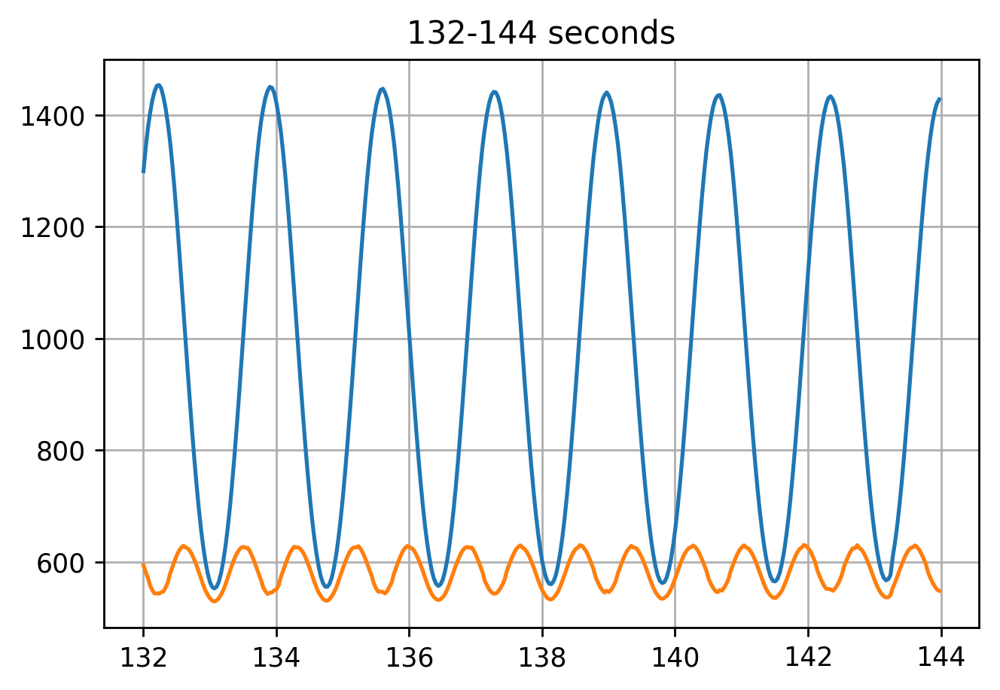

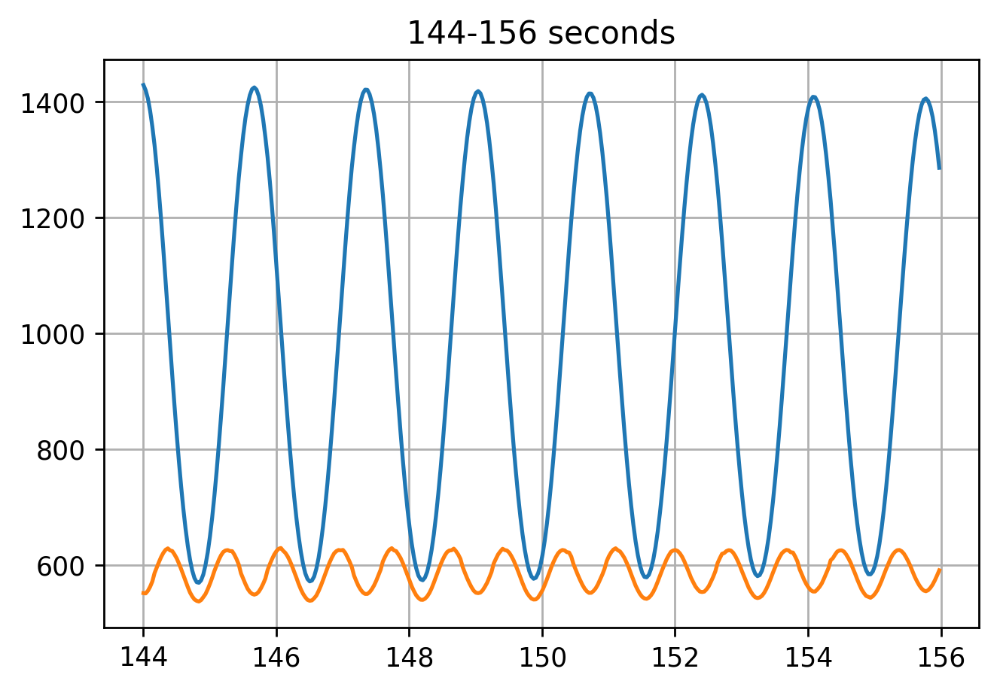

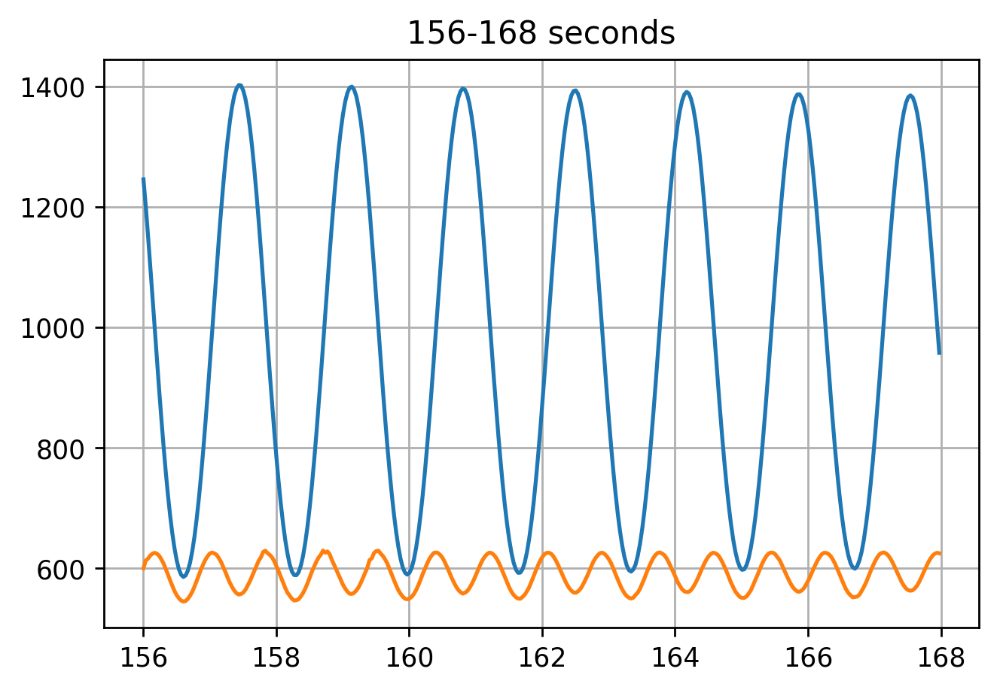

In [29]:
m=60*30
n=m+108*30
mask=np.zeros(n)
mask[71*30:72*30]=1
mask[74*30:79*30]=1
mask[89*30:93*30]=1
mask[121*30:131*30]=1

xmask=np.ma.MaskedArray(x[m:n],mask=mask[m:n])
ymask=np.ma.MaskedArray(y[m:n],mask=mask[m:n])
tm=t[m:n]

plt.figure()
plt.title('masked data')
plt.plot(t[m:n],xmask)
plt.plot(t[m:n],ymask)

for m in range(0,108*30,360):
    n=m+360
    plt.figure()
    plt.title('%d-%d seconds'%(60+m//30,60+n//30))
    plt.plot(tm[m:n],xmask[m:n])
    plt.plot(tm[m:n],ymask[m:n])
    plt.grid()


<class 'numpy.ndarray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'float'>
x0 980.000000 y0 -373.000000 dt 0.1 theta0 0.571429 g 9.8 alpha 1 delta 0.000000
1 0.571428571429 0.0 9.8 0.690705 0.066977 1
2 0.571428571429 -0.00012207018355 9.8 0.690705 0.066977 1
3 0.571428569487 -0.0001220696856 9.8 0.690705 0.066977 1
4 0.571428567545 -0.000244139370462 9.8 0.690705 0.066977 1
5 0.571428565603 -0.000244139369386 9.8 0.690705 0.066977 1
6 0.571428520805 -0.000864360389819 9.8 0.690705 0.066977 1
7 0.571428520805 -0.000864360377712 9.8 0.690705 0.066977 1
8 0.571428425878 -0.00148458132488 9.8 0.690705 0.066977 1
9 0.571428425878 -0.00148458130022 9.8 0.690705 0.066977 1
neval= 14384 chi2= 1035445831.26


1035445831.2602313

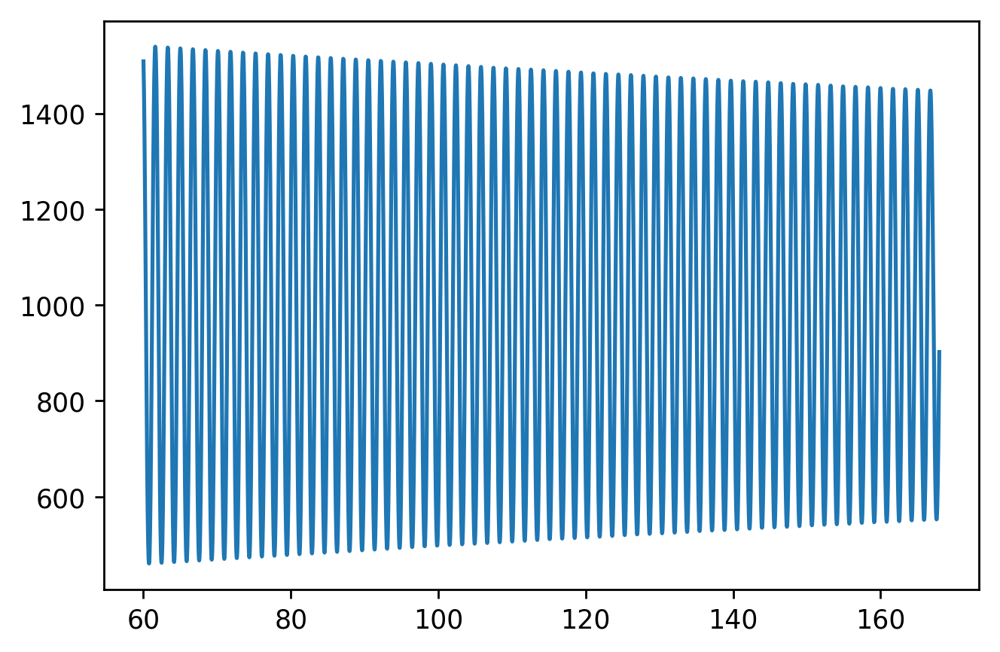

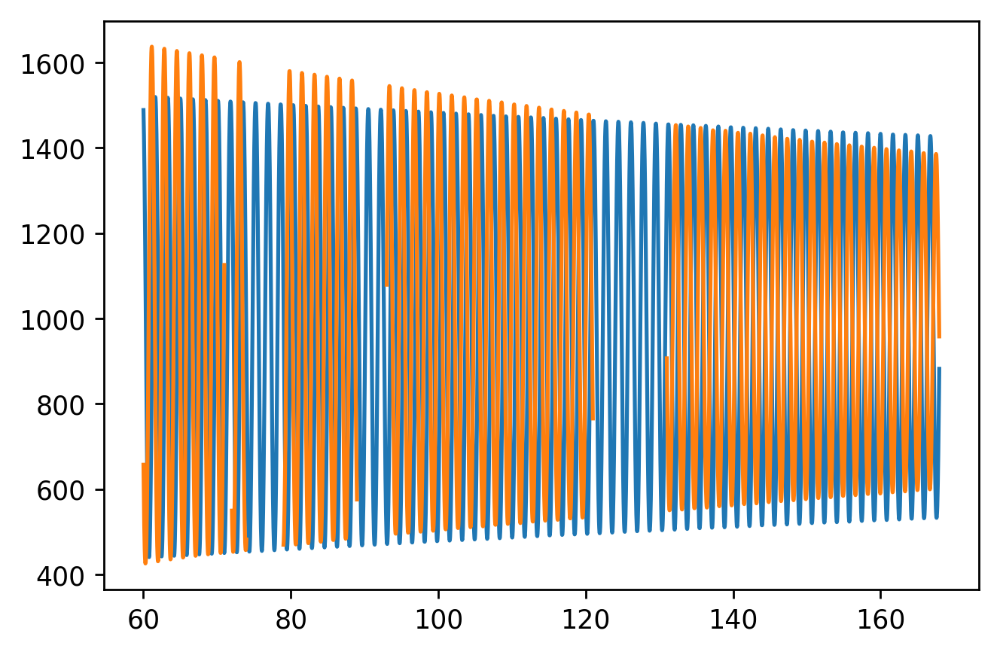

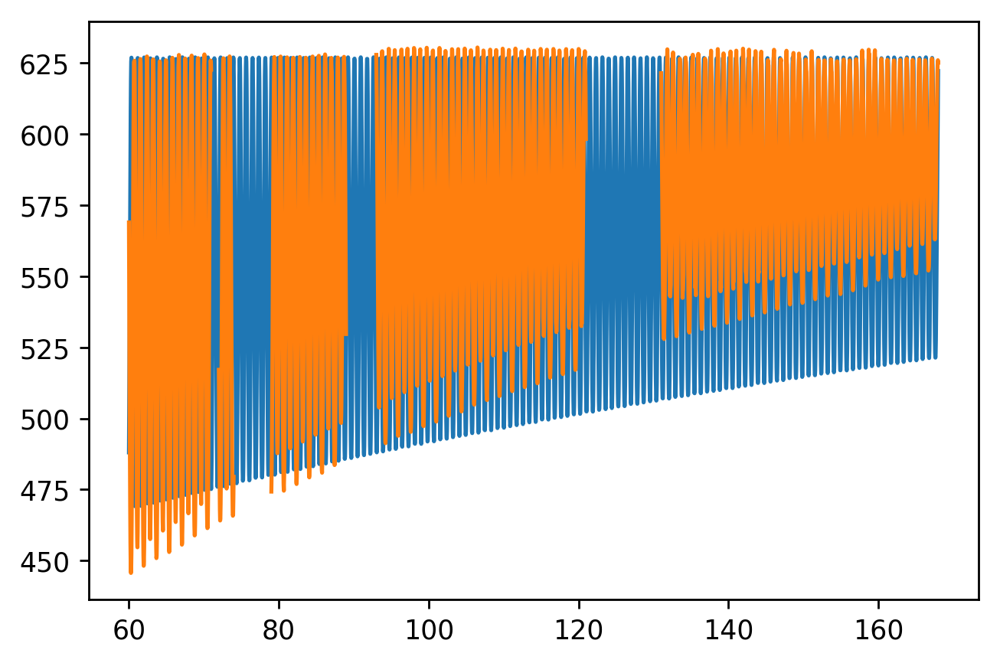

In [72]:
theta0=4/7.
delta=0
Chi2Inputs=(tm,xmask,ymask,1042.25)
for a in Chi2Inputs:
    print(type(a))
parGuess=(0.1,theta0,9.8,1,delta)
Chi2xy(parGuess,tm,xmask,ymask,1000,x0,y0-1000,True)

In [76]:
parGuess=(0.1,theta0,9.8,1,delta)
fitout=scipy.optimize.minimize(Chi2xy,parGuess,args=(tm,xmask,ymask,1042.25,x0,y0-1042.25,False),method='Powell')


<class 'float'>
<class 'float'>
<class 'float'>
<class 'int'>
<class 'int'>
x0 980.000000 y0 -415.250000 dt 0.1 theta0 0.571429 g 9.8 alpha 1 delta 0.000000
1 0.571428571429 0.0 9.8 0.690705 0.066977 1.0
2 0.571428571429 -0.00012207018355 9.8 0.690705 0.066977 1.0
3 0.571428569487 -0.0001220696856 9.8 0.690705 0.066977 1.0
4 0.571428567545 -0.000244139370462 9.8 0.690705 0.066977 1.0
5 0.571428565603 -0.000244139369386 9.8 0.690705 0.066977 1.0
6 0.571428520805 -0.000864360389819 9.8 0.690705 0.066977 1.0
7 0.571428520805 -0.000864360377712 9.8 0.690705 0.066977 1.0
8 0.571428425878 -0.00148458132488 9.8 0.690705 0.066977 1.0
9 0.571428425878 -0.00148458130022 9.8 0.690705 0.066977 1.0
neval= 14384 chi2= 1.08013e+09
x0 980.000000 y0 -415.250000 dt 0.1 theta0 0.571429 g 9.8 alpha 1 delta 0.000000
1 0.571428571429 0.0 9.8 0.690705 0.066977 1.0
2 0.571428571429 -0.00012207018355 9.8 0.690705 0.066977 1.0
3 0.571428569487 -0.0001220696856 9.8 0.690705 0.066977 1.0
4 0.571428567545 -0.00024

neval= 14744 chi2= 2.39728e+09
x0 980.000000 y0 -415.250000 dt 2.4111 theta0 -1.04661 g 9.8 alpha 1 delta 0.000000
1 -1.04660542857 0.0 9.8 0.690705 0.066977 1.0
2 -1.04660542857 0.000122070359091 9.8 0.690705 0.066977 1.0
3 -1.04660542736 0.000122070048014 9.8 0.690705 0.066977 1.0
4 -1.04660542615 0.000244140095856 9.8 0.690705 0.066977 1.0
5 -1.04660542493 0.000244140095328 9.8 0.690705 0.066977 1.0
6 -1.04660538909 0.000969553458962 9.8 0.690705 0.066977 1.0
7 -1.04660538909 0.000969553454433 9.8 0.690705 0.066977 1.0
8 -1.04660531041 0.0016949667829 9.8 0.690705 0.066977 1.0
9 -1.04660531041 0.00169496677345 9.8 0.690705 0.066977 1.0
neval= 14110 chi2= 1.57944e+09
x0 980.000000 y0 -415.250000 dt 2.4111 theta0 0.571429 g 9.8 alpha 1 delta 0.000000
1 0.571428571429 0.0 9.8 0.690705 0.066977 1.0
2 0.571428571429 -0.00012207018355 9.8 0.690705 0.066977 1.0
3 0.571428569487 -0.0001220696856 9.8 0.690705 0.066977 1.0
4 0.571428567545 -0.000244139370462 9.8 0.690705 0.066977 1.0
5 0.5714

9 0.550614078174 -0.00147097276613 9.8 0.690705 0.066977 1.0
neval= 14328 chi2= 6.3002e+07
x0 980.000000 y0 -415.250000 dt 2.4111 theta0 0.550404 g 9.8 alpha 1 delta 0.000000
1 0.550403979994 0.0 9.8 0.690705 0.066977 1.0
2 0.550403979994 -0.000122070163618 9.8 0.690705 0.066977 1.0
3 0.550403977986 -0.000122069648719 9.8 0.690705 0.066977 1.0
4 0.550403975978 -0.000244139296639 9.8 0.690705 0.066977 1.0
5 0.55040397397 -0.000244139295507 9.8 0.690705 0.066977 1.0
6 0.550403928445 -0.000857486128092 9.8 0.690705 0.066977 1.0
7 0.550403928445 -0.000857486115407 9.8 0.690705 0.066977 1.0
8 0.550403832226 -0.00147083287169 9.8 0.690705 0.066977 1.0
9 0.550403832226 -0.00147083284587 9.8 0.690705 0.066977 1.0
neval= 14441 chi2= 6.29991e+07
x0 980.000000 y0 -415.250000 dt 2.4111 theta0 0.550404 g 10.8 alpha 1 delta 0.000000
1 0.550403979994 0.0 10.8 0.690705 0.066977 1.0
2 0.550403979994 -0.000122070217985 10.8 0.690705 0.066977 1.0
3 0.550403978172 -0.000122069750761 10.8 0.690705 0.066977

neval= 14392 chi2= 6.2974e+07
x0 980.000000 y0 -415.250000 dt 2.4111 theta0 0.550404 g 9.80076 alpha 1 delta 0.000000
1 0.550403979994 0.0 9.80076158387 0.690705 0.066977 1.0
2 0.550403979994 -0.000122070163666 9.80076158387 0.690705 0.066977 1.0
3 0.550403977986 -0.000122069648807 9.80076158387 0.690705 0.066977 1.0
4 0.550403975978 -0.000244139296815 9.80076158387 0.690705 0.066977 1.0
5 0.55040397397 -0.000244139295683 9.80076158387 0.690705 0.066977 1.0
6 0.550403928447 -0.00085750201634 9.80076158387 0.690705 0.066977 1.0
7 0.550403928447 -0.000857502003655 9.80076158387 0.690705 0.066977 1.0
8 0.550403832231 -0.00147086464801 9.80076158387 0.690705 0.066977 1.0
9 0.550403832232 -0.00147086462219 9.80076158387 0.690705 0.066977 1.0
neval= 14262 chi2= 6.2974e+07
x0 980.000000 y0 -415.250000 dt 2.4111 theta0 0.550404 g 9.82177 alpha 1 delta 0.000000
1 0.550403979994 0.0 9.82176964737 0.690705 0.066977 1.0
2 0.550403979994 -0.000122070164981 9.82176964737 0.690705 0.066977 1.0
3 0.55

neval= 14684 chi2= 6.26116e+07
x0 980.000000 y0 -415.250000 dt 2.4111 theta0 0.550404 g 9.80077 alpha 1.19483 delta 0.000000
1 0.550403979994 0.0 9.80077435785 0.690705 0.066977 1.19483433512
2 0.550403979994 -0.000122070163667 9.80077435785 0.690705 0.066977 1.19483433512
3 0.550403977986 -0.000122069548496 9.80077435785 0.690705 0.066977 1.19483433512
4 0.550403975978 -0.000244139096193 9.80077435785 0.690705 0.066977 1.19483433512
5 0.55040397397 -0.000244139094919 9.80077435785 0.690705 0.066977 1.19483433512
6 0.550403932448 -0.000822141706938 9.80077435785 0.690705 0.066977 1.19483433512
7 0.550403932449 -0.00082214169632 9.80077435785 0.690705 0.066977 1.19483433512
8 0.550403845911 -0.00140014423937 9.80077435785 0.690705 0.066977 1.19483433512
9 0.550403845911 -0.0014001442177 9.80077435785 0.690705 0.066977 1.19483433512
neval= 14619 chi2= 5.93461e+07
x0 980.000000 y0 -415.250000 dt 2.4111 theta0 0.550404 g 9.80077 alpha 1.19678 delta 0.000000
1 0.550403979994 0.0 9.800774357

9 0.550403845509 -0.00140226907344 9.80077435785 0.690705 0.066977 1.18827414279
neval= 14522 chi2= 5.9343e+07
x0 980.000000 y0 -415.250000 dt 2.4111 theta0 0.550404 g 9.80077 alpha 1.18827 delta -0.618034
1 0.550403979994 0.0 9.80077435785 0.690705 0.066977 1.18827414279
2 0.550403979994 -0.000122070163667 9.80077435785 0.690705 0.066977 1.18827414279
3 0.550403977986 -0.000122069551874 9.80077435785 0.690705 0.066977 1.18827414279
4 0.550403975978 -0.000244139102948 9.80077435785 0.690705 0.066977 1.18827414279
5 0.55040397397 -0.000244139101679 9.80077435785 0.690705 0.066977 1.18827414279
6 0.550403932331 -0.000823204138377 9.80077435785 0.690705 0.066977 1.18827414279
7 0.550403932331 -0.0008232041277 9.80077435785 0.690705 0.066977 1.18827414279
8 0.550403845509 -0.00140226909522 9.80077435785 0.690705 0.066977 1.18827414279
9 0.550403845509 -0.00140226907344 9.80077435785 0.690705 0.066977 1.18827414279
neval= 14522 chi2= 1.14885e+09
x0 980.000000 y0 -415.250000 dt 2.4111 theta0

neval= 14381 chi2= 1.35931e+08
x0 980.000000 y0 -415.250000 dt 2.4111 theta0 0.550404 g 9.80077 alpha 1.18827 delta 0.010408
1 0.550403979994 0.0 9.80077435785 0.690705 0.066977 1.18827414279
2 0.550403979994 -0.000122070163667 9.80077435785 0.690705 0.066977 1.18827414279
3 0.550403977986 -0.000122069551874 9.80077435785 0.690705 0.066977 1.18827414279
4 0.550403975978 -0.000244139102948 9.80077435785 0.690705 0.066977 1.18827414279
5 0.55040397397 -0.000244139101679 9.80077435785 0.690705 0.066977 1.18827414279
6 0.550403932331 -0.000823204138377 9.80077435785 0.690705 0.066977 1.18827414279
7 0.550403932331 -0.0008232041277 9.80077435785 0.690705 0.066977 1.18827414279
8 0.550403845509 -0.00140226909522 9.80077435785 0.690705 0.066977 1.18827414279
9 0.550403845509 -0.00140226907344 9.80077435785 0.690705 0.066977 1.18827414279
neval= 14522 chi2= 5.90321e+07
x0 980.000000 y0 -415.250000 dt 1.79307 theta0 0.550404 g 9.80077 alpha 1.18827 delta 0.010408
1 0.550403979994 0.0 9.80077435

neval= 15426 chi2= 2.09402e+09
x0 980.000000 y0 -415.250000 dt 2.33217 theta0 -1.06763 g 9.80077 alpha 1.18827 delta 0.010408
1 -1.06763002001 0.0 9.80077435785 0.690705 0.066977 1.18827414279
2 -1.06763002001 0.000122070361743 9.80077435785 0.690705 0.066977 1.18827414279
3 -1.06763001881 0.000122069996485 9.80077435785 0.690705 0.066977 1.18827414279
4 -1.06763001761 0.00024413999281 9.80077435785 0.690705 0.066977 1.18827414279
5 -1.06763001641 0.00024413999221 9.80077435785 0.690705 0.066977 1.18827414279
6 -1.06763000209 0.000973476382246 9.80077435785 0.690705 0.066977 1.18827414279
7 -1.06762995929 0.000973476357864 9.80077435785 0.690705 0.066977 1.18827414279
8 -1.06762990218 0.00170281268924 9.80077435785 0.690705 0.066977 1.18827414279
9 -1.06762985939 0.00170281264657 9.80077435785 0.690705 0.066977 1.18827414279
neval= 14780 chi2= 1.51797e+09
x0 980.000000 y0 -415.250000 dt 2.33217 theta0 0.550404 g 9.80077 alpha 1.18827 delta 0.010408
1 0.550403979994 0.0 9.80077435785 0.

neval= 14438 chi2= 2.61539e+07
x0 980.000000 y0 -415.250000 dt 2.33217 theta0 0.539485 g 9.80077 alpha 1.18827 delta 0.010408
1 0.539485232297 0.0 9.80077435785 0.690705 0.066977 1.18827414279
2 0.539485232297 -0.000122070152376 9.80077435785 0.690705 0.066977 1.18827414279
3 0.539485230253 -0.000122069529463 9.80077435785 0.690705 0.066977 1.18827414279
4 0.539485228209 -0.000244139058092 9.80077435785 0.690705 0.066977 1.18827414279
5 0.539485226164 -0.00024413905679 9.80077435785 0.690705 0.066977 1.18827414279
6 0.539485184158 -0.000819740614031 9.80077435785 0.690705 0.066977 1.18827414279
7 0.539485184158 -0.000819740603088 9.80077435785 0.690705 0.066977 1.18827414279
8 0.539485096698 -0.00139534208969 9.80077435785 0.690705 0.066977 1.18827414279
9 0.539485096698 -0.00139534206738 9.80077435785 0.690705 0.066977 1.18827414279
neval= 14438 chi2= 2.61533e+07
x0 980.000000 y0 -415.250000 dt 2.33217 theta0 0.539375 g 9.80077 alpha 1.18827 delta 0.010408
1 0.539374941906 0.0 9.80077

9 0.539374806647 -0.00139744918477 9.85650244293 0.690705 0.066977 1.18827414279
neval= 14325 chi2= 1.48629e+08
x0 980.000000 y0 -415.250000 dt 2.33217 theta0 0.539375 g 9.79276 alpha 1.18827 delta 0.010408
1 0.539374941906 0.0 9.7927613637 0.690705 0.066977 1.18827414279
2 0.539374941906 -0.000122070151736 9.7927613637 0.690705 0.066977 1.18827414279
3 0.53937493986 -0.000122069528198 9.7927613637 0.690705 0.066977 1.18827414279
4 0.539374937814 -0.000244139055562 9.7927613637 0.690705 0.066977 1.18827414279
5 0.539374935767 -0.000244139054258 9.7927613637 0.690705 0.066977 1.18827414279
6 0.539374893741 -0.0008195483919 9.7927613637 0.690705 0.066977 1.18827414279
7 0.539374893741 -0.000819548380954 9.7927613637 0.690705 0.066977 1.18827414279
8 0.539374806245 -0.00139495764793 9.7927613637 0.690705 0.066977 1.18827414279
9 0.539374806245 -0.00139495762562 9.7927613637 0.690705 0.066977 1.18827414279
neval= 14331 chi2= 2.97026e+07
x0 980.000000 y0 -415.250000 dt 2.33217 theta0 0.5393

neval= 12884 chi2= 8.03318e+07
x0 980.000000 y0 -415.250000 dt 2.33217 theta0 0.539375 g 9.80209 alpha 1.57024 delta 0.010408
1 0.539374941906 0.0 9.80208541365 0.690705 0.066977 1.57024014279
2 0.539374941906 -0.000122070152344 9.80208541365 0.690705 0.066977 1.57024014279
3 0.539374939862 -0.000122069329156 9.80208541365 0.690705 0.066977 1.57024014279
4 0.539374937818 -0.000244138657478 9.80208541365 0.690705 0.066977 1.57024014279
5 0.539374935773 -0.000244138655891 9.80208541365 0.690705 0.066977 1.57024014279
6 0.539374899334 -0.000768632980345 9.80208541365 0.690705 0.066977 1.57024014279
7 0.539374899334 -0.000768632972059 9.80208541365 0.690705 0.066977 1.57024014279
8 0.539374825151 -0.00129312723507 9.80208541365 0.690705 0.066977 1.57024014279
9 0.539374825151 -0.00129312721811 9.80208541365 0.690705 0.066977 1.57024014279
neval= 14618 chi2= 2.94362e+07
x0 980.000000 y0 -415.250000 dt 2.33217 theta0 0.539375 g 9.80209 alpha 1.33379 delta 0.010408
1 0.539374941906 0.0 9.8020

9 0.53937481349 -0.00135726555435 9.80208541365 0.690705 0.066977 1.31428178602
neval= 14371 chi2= 2.48019e+07
x0 980.000000 y0 -415.250000 dt 2.33217 theta0 0.539375 g 9.80209 alpha 1.31428 delta -0.607626
1 0.539374941906 0.0 9.80208541365 0.690705 0.066977 1.31428178602
2 0.539374941906 -0.000122070152344 9.80208541365 0.690705 0.066977 1.31428178602
3 0.539374939862 -0.000122069463341 9.80208541365 0.690705 0.066977 1.31428178602
4 0.539374937818 -0.000244138925847 9.80208541365 0.690705 0.066977 1.31428178602
5 0.539374935773 -0.000244138924451 9.80208541365 0.690705 0.066977 1.31428178602
6 0.539374895881 -0.000800702287939 9.80208541365 0.690705 0.066977 1.31428178602
7 0.539374895881 -0.000800702278042 9.80208541365 0.690705 0.066977 1.31428178602
8 0.53937481349 -0.00135726557456 9.80208541365 0.690705 0.066977 1.31428178602
9 0.53937481349 -0.00135726555435 9.80208541365 0.690705 0.066977 1.31428178602
neval= 14371 chi2= 1.08756e+09
x0 980.000000 y0 -415.250000 dt 2.33217 the

neval= 14351 chi2= 8.79059e+06
x0 980.000000 y0 -415.250000 dt 2.12551 theta0 0.510501 g 9.80552 alpha 1.64417 delta 0.011899
1 0.510500545206 0.0 9.80551780232 0.690705 0.066977 1.64417408025
2 0.510500545206 -0.000122070119121 9.80551780232 0.690705 0.066977 1.64417408025
3 0.510500543058 -0.000122069213415 9.80551780232 0.690705 0.066977 1.64417408025
4 0.51050054091 -0.000244138425893 9.80551780232 0.690705 0.066977 1.64417408025
5 0.510500538762 -0.000244138424137 9.80551780232 0.690705 0.066977 1.64417408025
6 0.510500502274 -0.000752195504874 9.80551780232 0.690705 0.066977 1.64417408025
7 0.510500502274 -0.000752195496416 9.80551780232 0.690705 0.066977 1.64417408025
8 0.510500428574 -0.00126025251372 9.80551780232 0.690705 0.066977 1.64417408025
9 0.510500428574 -0.00126025249643 9.80551780232 0.690705 0.066977 1.64417408025
neval= 14032 chi2= 2.13402e+07
x0 980.000000 y0 -415.250000 dt 2.25323 theta0 0.528346 g 9.8034 alpha 1.44029 delta 0.011232
1 0.528345903819 0.0 9.803396

neval= 14259 chi2= 6.03354e+09
x0 980.000000 y0 -415.250000 dt 2.22382 theta0 0.524237 g 9.80388 alpha 1.48723 delta 0.011386
1 0.524236980374 0.0 9.80388490987 0.690705 0.066977 1.48723420861
2 0.524236980374 -0.000122070135615 9.80388490987 0.690705 0.066977 1.48723420861
3 0.524236978276 -0.000122069335767 9.80388490987 0.690705 0.066977 1.48723420861
4 0.524236976179 -0.000244138670648 9.80388490987 0.690705 0.066977 1.48723420861
5 0.524236974082 -0.000244138669068 9.80388490987 0.690705 0.066977 1.48723420861
6 0.52423693615 -0.000773694093207 9.80388490987 0.690705 0.066977 1.48723420861
7 0.52423693615 -0.000773694084151 9.80388490987 0.690705 0.066977 1.48723420861
8 0.524236858747 -0.0013032494435 9.80388490987 0.690705 0.066977 1.48723420861
9 0.524236858747 -0.001303249425 9.80388490987 0.690705 0.066977 1.48723420861
neval= 14259 chi2= 7.53101e+06
x0 980.000000 y0 -415.250000 dt 2.22382 theta0 0.524237 g 9.80388 alpha 1.48723 delta -0.606648
1 0.524236980374 0.0 9.80388490

neval= 15828 chi2= 1.93127e+09
x0 980.000000 y0 -415.250000 dt 2.22382 theta0 -1.0938 g 9.80388 alpha 1.48723 delta 0.011234
1 -1.09379701963 0.0 9.80388490987 0.690705 0.066977 1.48723420861
2 -1.09379701963 0.000122070364832 9.80388490987 0.690705 0.066977 1.48723420861
3 -1.09379701844 0.000122069914159 9.80388490987 0.690705 0.066977 1.48723420861
4 -1.09379701726 0.000244139828169 9.80388490987 0.690705 0.066977 1.48723420861
5 -1.09379701608 0.000244139827454 9.80388490987 0.690705 0.066977 1.48723420861
6 -1.09379700177 0.000983334889203 9.80388490987 0.690705 0.066977 1.48723420861
7 -1.09379695844 0.000983334860107 9.80388490987 0.690705 0.066977 1.48723420861
8 -1.09379690079 0.00172252985973 9.80388490987 0.690705 0.066977 1.48723420861
9 -1.09379685746 0.00172252981267 9.80388490987 0.690705 0.066977 1.48723420861
neval= 15486 chi2= 1.42381e+09
x0 980.000000 y0 -415.250000 dt 2.22382 theta0 0.524237 g 9.80388 alpha 1.48723 delta 0.011234
1 0.524236980374 0.0 9.80388490987 0

neval= 14244 chi2= 7.53092e+06
x0 980.000000 y0 -415.250000 dt 2.22382 theta0 0.52361 g 9.80388 alpha 1.48723 delta 0.011234
1 0.523609766438 0.0 9.80388490987 0.690705 0.066977 1.48723420861
2 0.523609766438 -0.000122070134885 9.80388490987 0.690705 0.066977 1.48723420861
3 0.523609764339 -0.000122069334168 9.80388490987 0.690705 0.066977 1.48723420861
4 0.523609762239 -0.000244138667449 9.80388490987 0.690705 0.066977 1.48723420861
5 0.52360976014 -0.000244138665866 9.80388490987 0.690705 0.066977 1.48723420861
6 0.523609722187 -0.000773502641629 9.80388490987 0.690705 0.066977 1.48723420861
7 0.523609722187 -0.00077350263256 9.80388490987 0.690705 0.066977 1.48723420861
8 0.52360964475 -0.00130286654345 9.80388490987 0.690705 0.066977 1.48723420861
9 0.52360964475 -0.00130286652493 9.80388490987 0.690705 0.066977 1.48723420861
neval= 14237 chi2= 7.564e+06
x0 980.000000 y0 -415.250000 dt 2.22382 theta0 0.523997 g 9.80388 alpha 1.48723 delta 0.011234
1 0.523997142526 0.0 9.80388490987

9 0.524236673865 -0.00130324931221 9.80388490987 0.690705 0.066977 1.48723420861
neval= 14273 chi2= 7.53092e+06
x0 980.000000 y0 -415.250000 dt 2.22382 theta0 0.524237 g 9.80388 alpha 1.48723 delta 0.011234
1 0.524236689161 0.0 9.80388490987 0.690705 0.066977 1.48723420861
2 0.524236689161 -0.000122070135615 9.80388490987 0.690705 0.066977 1.48723420861
3 0.524236687064 -0.000122069335766 9.80388490987 0.690705 0.066977 1.48723420861
4 0.524236684967 -0.000244138670647 9.80388490987 0.690705 0.066977 1.48723420861
5 0.52423668287 -0.000244138669067 9.80388490987 0.690705 0.066977 1.48723420861
6 0.524236644938 -0.000773694004368 9.80388490987 0.690705 0.066977 1.48723420861
7 0.524236644938 -0.000773693995312 9.80388490987 0.690705 0.066977 1.48723420861
8 0.524236567535 -0.00130324926582 9.80388490987 0.690705 0.066977 1.48723420861
9 0.524236567535 -0.00130324924732 9.80388490987 0.690705 0.066977 1.48723420861
neval= 14292 chi2= 7.53093e+06
x0 980.000000 y0 -415.250000 dt 2.22382 th

neval= 14238 chi2= 7.53091e+06
x0 980.000000 y0 -415.250000 dt 2.22382 theta0 0.524237 g 9.18585 alpha 1.48723 delta 0.011234
1 0.524236681228 0.0 9.18585093502 0.690705 0.066977 1.48723420861
2 0.524236681228 -0.000122070088904 9.18585093502 0.690705 0.066977 1.48723420861
3 0.52423667899 -0.000122069235241 9.18585093502 0.690705 0.066977 1.48723420861
4 0.524236676751 -0.000244138469537 9.18585093502 0.690705 0.066977 1.48723420861
5 0.524236674513 -0.000244138467851 9.18585093502 0.690705 0.066977 1.48723420861
6 0.524236635341 -0.000762323457527 9.18585093502 0.690705 0.066977 1.48723420861
7 0.524236635341 -0.000762323448471 9.18585093502 0.690705 0.066977 1.48723420861
8 0.524236555832 -0.00128050837255 9.18585093502 0.690705 0.066977 1.48723420861
9 0.524236555832 -0.00128050835406 9.18585093502 0.690705 0.066977 1.48723420861
neval= 13938 chi2= 5.45651e+08
x0 980.000000 y0 -415.250000 dt 2.22382 theta0 0.524237 g 10.1859 alpha 1.48723 delta 0.011234
1 0.524236681228 0.0 10.1858

neval= 14350 chi2= 7.48489e+06
x0 980.000000 y0 -415.250000 dt 2.22382 theta0 0.524237 g 9.80495 alpha 1.48723 delta 0.011234
1 0.524236681228 0.0 9.80494893026 0.690705 0.066977 1.48723420861
2 0.524236681228 -0.000122070135688 9.80494893026 0.690705 0.066977 1.48723420861
3 0.524236679131 -0.000122069335926 9.80494893026 0.690705 0.066977 1.48723420861
4 0.524236677034 -0.000244138670966 9.80494893026 0.690705 0.066977 1.48723420861
5 0.524236674937 -0.000244138669387 9.80494893026 0.690705 0.066977 1.48723420861
6 0.524236637007 -0.000773713159688 9.80494893026 0.690705 0.066977 1.48723420861
7 0.524236637007 -0.000773713150633 9.80494893026 0.690705 0.066977 1.48723420861
8 0.524236559608 -0.00130328757614 9.80494893026 0.690705 0.066977 1.48723420861
9 0.524236559608 -0.00130328755764 9.80494893026 0.690705 0.066977 1.48723420861
neval= 14256 chi2= 7.48486e+06
x0 980.000000 y0 -415.250000 dt 2.22382 theta0 0.524237 g 9.80495 alpha 2.48723 delta 0.011234
1 0.524236681228 0.0 9.8049

neval= 14361 chi2= 7.46004e+06
x0 980.000000 y0 -415.250000 dt 2.22382 theta0 0.524237 g 9.80495 alpha 1.50756 delta 0.011234
1 0.524236681228 0.0 9.80494893026 0.690705 0.066977 1.50756140434
2 0.524236681228 -0.000122070135688 9.80494893026 0.690705 0.066977 1.50756140434
3 0.524236679131 -0.000122069324995 9.80494893026 0.690705 0.066977 1.50756140434
4 0.524236677034 -0.000244138649104 9.80494893026 0.690705 0.066977 1.50756140434
5 0.524236674937 -0.000244138647509 9.80494893026 0.690705 0.066977 1.50756140434
6 0.524236637267 -0.000771320840577 9.80494893026 0.690705 0.066977 1.50756140434
7 0.524236637267 -0.000771320831643 9.80494893026 0.690705 0.066977 1.50756140434
8 0.524236560484 -0.00129850296034 9.80494893026 0.690705 0.066977 1.50756140434
9 0.524236560484 -0.00129850294208 9.80494893026 0.690705 0.066977 1.50756140434
neval= 14435 chi2= 7.46006e+06
x0 980.000000 y0 -415.250000 dt 2.22382 theta0 0.524237 g 9.80495 alpha 1.50779 delta 0.011234
1 0.524236681228 0.0 9.8049

neval= 14337 chi2= 7.45127e+06
x0 980.000000 y0 -415.250000 dt 2.22138 theta0 0.523895 g 9.80499 alpha 1.51169 delta 0.011246
1 0.523895140531 0.0 9.80498953026 0.690705 0.066977 1.51169067388
2 0.523895140531 -0.000122070135293 9.80498953026 0.690705 0.066977 1.51169067388
3 0.523895138432 -0.000122069321903 9.80498953026 0.690705 0.066977 1.51169067388
4 0.523895136334 -0.000244138642919 9.80498953026 0.690705 0.066977 1.51169067388
5 0.523895134236 -0.00024413864132 9.80498953026 0.690705 0.066977 1.51169067388
6 0.523895096607 -0.00077073718051 9.80498953026 0.690705 0.066977 1.51169067388
7 0.523895096607 -0.000770737171593 9.80498953026 0.690705 0.066977 1.51169067388
8 0.523895019929 -0.00129733564645 9.80498953026 0.690705 0.066977 1.51169067388
9 0.523895019929 -0.00129733562823 9.80498953026 0.690705 0.066977 1.51169067388
neval= 14271 chi2= 7.45122e+06
x0 980.000000 y0 -415.250000 dt 2.11059 theta0 0.508415 g 9.80789 alpha 1.7091 delta 0.011672
1 0.508415339155 0.0 9.8078936

9 0.523895019929 -0.00129733562823 9.80498953026 0.690705 0.066977 1.51169067388
neval= 14271 chi2= 7.45122e+06
x0 980.000000 y0 -415.250000 dt 2.22138 theta0 0.523895 g 9.80499 alpha 1.51169 delta 0.011263
1 0.523895140531 0.0 9.80498953026 0.690705 0.066977 1.51169067388
2 0.523895140531 -0.000122070135293 9.80498953026 0.690705 0.066977 1.51169067388
3 0.523895138432 -0.000122069321903 9.80498953026 0.690705 0.066977 1.51169067388
4 0.523895136334 -0.000244138642919 9.80498953026 0.690705 0.066977 1.51169067388
5 0.523895134236 -0.00024413864132 9.80498953026 0.690705 0.066977 1.51169067388
6 0.523895096607 -0.00077073718051 9.80498953026 0.690705 0.066977 1.51169067388
7 0.523895096607 -0.000770737171593 9.80498953026 0.690705 0.066977 1.51169067388
8 0.523895019929 -0.00129733564645 9.80498953026 0.690705 0.066977 1.51169067388
9 0.523895019929 -0.00129733562823 9.80498953026 0.690705 0.066977 1.51169067388
neval= 14271 chi2= 7.45122e+06
x0 980.000000 y0 -415.250000 dt 2.22138 the

neval= 14122 chi2= 5.01134e+08
x0 980.000000 y0 -415.250000 dt 2.22138 theta0 0.669793 g 9.80499 alpha 1.51169 delta 0.011263
1 0.669793165687 0.0 9.80498953026 0.690705 0.066977 1.51169067388
2 0.669793165687 -0.000122070253181 9.80498953026 0.690705 0.066977 1.51169067388
3 0.669793163996 -0.000122069597755 9.80498953026 0.690705 0.066977 1.51169067388
4 0.669793162305 -0.000244139194989 9.80498953026 0.690705 0.066977 1.51169067388
5 0.669793160614 -0.000244139193796 9.80498953026 0.690705 0.066977 1.51169067388
6 0.669793126771 -0.000810010190027 9.80498953026 0.690705 0.066977 1.51169067388
7 0.669793126771 -0.000810010183518 9.80498953026 0.690705 0.066977 1.51169067388
8 0.669793056594 -0.00137588112926 9.80498953026 0.690705 0.066977 1.51169067388
9 0.669793056594 -0.00137588111582 9.80498953026 0.690705 0.066977 1.51169067388
neval= 15974 chi2= 7.28553e+08
x0 980.000000 y0 -415.250000 dt 2.22138 theta0 0.436627 g 9.80499 alpha 1.51169 delta 0.011263
1 0.436627299497 0.0 9.8049

neval= 14907 chi2= 6.29752e+08
x0 980.000000 y0 -415.250000 dt 2.22138 theta0 0.525917 g 8.18696 alpha 1.51169 delta 0.011263
1 0.525917444346 0.0 8.18695553026 0.690705 0.066977 1.51169067388
2 0.525917444346 -0.000122069992647 8.18695553026 0.690705 0.066977 1.51169067388
3 0.525917441842 -0.000122069021899 8.18695553026 0.690705 0.066977 1.51169067388
4 0.525917439338 -0.000244138042744 8.18695553026 0.690705 0.066977 1.51169067388
5 0.525917436834 -0.000244138040837 8.18695553026 0.690705 0.066977 1.51169067388
6 0.525917395754 -0.000740588413656 8.18695553026 0.690705 0.066977 1.51169067388
7 0.525917395754 -0.000740588404781 8.18695553026 0.690705 0.066977 1.51169067388
8 0.525917313254 -0.00123703871125 8.18695553026 0.690705 0.066977 1.51169067388
9 0.525917313254 -0.00123703869314 8.18695553026 0.690705 0.066977 1.51169067388
neval= 13271 chi2= 6.30221e+08
x0 980.000000 y0 -415.250000 dt 2.22138 theta0 0.525917 g 9.80499 alpha 1.51169 delta 0.011263
1 0.525917444346 0.0 9.8049

neval= 14491 chi2= 7.21545e+06
x0 980.000000 y0 -415.250000 dt 2.22138 theta0 0.525917 g 9.80634 alpha 1.51169 delta 0.011263
1 0.525917444346 0.0 9.80634297516 0.690705 0.066977 1.51169067388
2 0.525917444346 -0.000122070137725 9.80634297516 0.690705 0.066977 1.51169067388
3 0.525917442256 -0.000122069327282 9.80634297516 0.690705 0.066977 1.51169067388
4 0.525917440165 -0.000244138653685 9.80634297516 0.690705 0.066977 1.51169067388
5 0.525917438074 -0.000244138652093 9.80634297516 0.690705 0.066977 1.51169067388
6 0.525917400513 -0.000771374367869 9.80634297516 0.690705 0.066977 1.51169067388
7 0.525917400513 -0.000771374358994 9.80634297516 0.690705 0.066977 1.51169067388
8 0.52591732395 -0.00129861001068 9.80634297516 0.690705 0.066977 1.51169067388
9 0.52591732395 -0.00129860999255 9.80634297516 0.690705 0.066977 1.51169067388
neval= 14333 chi2= 7.21545e+06
x0 980.000000 y0 -415.250000 dt 2.22138 theta0 0.525917 g 9.80633 alpha 1.51169 delta 0.011263
1 0.525917444346 0.0 9.806329

neval= 14391 chi2= 7.19828e+06
x0 980.000000 y0 -415.250000 dt 2.22138 theta0 0.525917 g 9.80634 alpha 1.52901 delta 0.011263
1 0.525917444346 0.0 9.80634297516 0.690705 0.066977 1.5290138473
2 0.525917444346 -0.000122070137725 9.80634297516 0.690705 0.066977 1.5290138473
3 0.525917442256 -0.000122069317995 9.80634297516 0.690705 0.066977 1.5290138473
4 0.525917440165 -0.000244138635111 9.80634297516 0.690705 0.066977 1.5290138473
5 0.525917438074 -0.000244138633505 9.80634297516 0.690705 0.066977 1.5290138473
6 0.525917400729 -0.000769374545794 9.80634297516 0.690705 0.066977 1.5290138473
7 0.525917400729 -0.000769374537019 9.80634297516 0.690705 0.066977 1.5290138473
8 0.525917324677 -0.00129461038557 9.80634297516 0.690705 0.066977 1.5290138473
9 0.525917324677 -0.00129461036763 9.80634297516 0.690705 0.066977 1.5290138473
neval= 14357 chi2= 7.19812e+06
x0 980.000000 y0 -415.250000 dt 2.22138 theta0 0.525917 g 9.80634 alpha 1.52919 delta 0.011263
1 0.525917444346 0.0 9.80634297516 0

neval= 14558 chi2= 1.3565e+07
x0 980.000000 y0 -415.250000 dt 2.17999 theta0 0.520135 g 9.80703 alpha 1.59476 delta 0.011479
1 0.520135257731 0.0 9.80703032153 0.690705 0.066977 1.59475963354
2 0.520135257731 -0.000122070131012 9.80703032153 0.690705 0.066977 1.59475963354
3 0.52013525562 -0.000122069267478 9.80703032153 0.690705 0.066977 1.59475963354
4 0.520135253508 -0.000244138534055 9.80703032153 0.690705 0.066977 1.59475963354
5 0.520135251397 -0.000244138532377 9.80703032153 0.690705 0.066977 1.59475963354
6 0.520135214657 -0.000760335990998 9.80703032153 0.690705 0.066977 1.59475963354
7 0.520135214657 -0.000760335982472 9.80703032153 0.690705 0.066977 1.59475963354
8 0.520135140158 -0.00127653337791 9.80703032153 0.690705 0.066977 1.59475963354
9 0.520135140158 -0.00127653336048 9.80703032153 0.690705 0.066977 1.59475963354
neval= 14127 chi2= 9.77769e+06
x0 980.000000 y0 -415.250000 dt 2.22214 theta0 0.526023 g 9.80633 alpha 1.52749 delta 0.011259
1 0.526023455034 0.0 9.806330

neval= 14366 chi2= 7.1969e+06
x0 980.000000 y0 -415.250000 dt 2.22241 theta0 0.526062 g 9.80633 alpha 1.52704 delta 0.011258
1 0.52606234932 0.0 9.80632574985 0.690705 0.066977 1.52704213756
2 0.52606234932 -0.000122070137891 9.80632574985 0.690705 0.066977 1.52704213756
3 0.52606234723 -0.00012206931942 9.80632574985 0.690705 0.066977 1.52704213756
4 0.52606234514 -0.000244138637962 9.80632574985 0.690705 0.066977 1.52704213756
5 0.52606234305 -0.000244138636359 9.80632574985 0.690705 0.066977 1.52704213756
6 0.526062305685 -0.00076964401953 9.80632574985 0.690705 0.066977 1.52704213756
7 0.526062305685 -0.000769644010747 9.80632574985 0.690705 0.066977 1.52704213756
8 0.526062229583 -0.00129514933016 9.80632574985 0.690705 0.066977 1.52704213756
9 0.526062229583 -0.0012951493122 9.80632574985 0.690705 0.066977 1.52704213756
neval= 14263 chi2= 7.19682e+06
x0 980.000000 y0 -415.250000 dt 2.22237 theta0 0.526057 g 9.80633 alpha 1.52711 delta 0.011258
1 0.52605662819 0.0 9.80632642994 0.

neval= 16622 chi2= 4.93938e+07
x0 980.000000 y0 -415.250000 dt 2.26271 theta0 0.616246 g 9.86225 alpha 2.1738 delta 0.011746
1 0.61624637558 0.0 9.86224524199 0.690705 0.066977 2.1738001497
2 0.61624637558 -0.000122070222535 9.86224524199 0.690705 0.066977 2.1738001497
3 0.616246373775 -0.000122069216043 9.86224524199 0.690705 0.066977 2.1738001497
4 0.616246371969 -0.000244138431464 9.86224524199 0.690705 0.066977 2.1738001497
5 0.616246370163 -0.000244138429721 9.86224524199 0.690705 0.066977 2.1738001497
6 0.61624635462 -0.000769539132179 9.86224524199 0.690705 0.066977 2.1738001497
7 0.616246321171 -0.000769539094095 9.86224524199 0.690705 0.066977 2.1738001497
8 0.616246272178 -0.00129493970915 9.86224524199 0.690705 0.066977 2.1738001497
9 0.616246238728 -0.00129493964521 9.86224524199 0.690705 0.066977 2.1738001497
neval= 15671 chi2= 3.56504e+06
x0 980.000000 y0 -415.250000 dt 2.28609 theta0 0.668499 g 9.89464 alpha 2.54842 delta 0.012029
1 0.668498950835 0.0 9.8946406765 0.6907

8 0.592723789838 -0.0012688935582 9.84766182583 0.690705 0.066977 2.00515639802
9 0.592723756875 -0.00126889349614 9.84766182583 0.690705 0.066977 2.00515639802
neval= 15448 chi2= 6.03194e+09
x0 980.000000 y0 -415.250000 dt 2.25218 theta0 0.592724 g 9.84766 alpha 2.00516 delta 0.011619
1 0.592723892789 0.0 9.84766182583 0.690705 0.066977 2.00515639802
2 0.592723892789 -0.000122070204199 9.84766182583 0.690705 0.066977 2.00515639802
3 0.592723890918 -0.000122069242203 9.84766182583 0.690705 0.066977 2.00515639802
4 0.592723889047 -0.000244138483728 9.84766182583 0.690705 0.066977 2.00515639802
5 0.592723887176 -0.000244138482022 9.84766182583 0.690705 0.066977 2.00515639802
6 0.59272387147 -0.000756516081102 9.84766182583 0.690705 0.066977 2.00515639802
7 0.592723838507 -0.000756516045016 9.84766182583 0.690705 0.066977 2.00515639802
8 0.592723789838 -0.0012688935582 9.84766182583 0.690705 0.066977 2.00515639802
9 0.592723756875 -0.00126889349614 9.84766182583 0.690705 0.066977 2.005156

neval= 15125 chi2= 2.06278e+07
x0 980.000000 y0 -415.250000 dt 2.42748 theta0 0.617218 g 9.84475 alpha 1.72531 delta 0.010235
1 0.61721762924 0.0 9.84475017977 0.690705 0.066977 1.72531349789
2 0.61721762924 -0.000122070222333 9.84475017977 0.690705 0.066977 1.72531349789
3 0.617217627433 -0.000122069423171 9.84475017977 0.690705 0.066977 1.72531349789
4 0.617217625627 -0.00024413884572 9.84475017977 0.690705 0.066977 1.72531349789
5 0.617217623821 -0.000244138844274 9.84475017977 0.690705 0.066977 1.72531349789
6 0.61721759114 -0.000773816970572 9.84475017977 0.690705 0.066977 1.72531349789
7 0.61721759114 -0.000773816964208 9.84475017977 0.690705 0.066977 1.72531349789
8 0.617217524448 -0.00130349503863 9.84475017977 0.690705 0.066977 1.72531349789
9 0.617217524448 -0.00130349502551 9.84475017977 0.690705 0.066977 1.72531349789
neval= 15875 chi2= 4.54737e+07
x0 980.000000 y0 -415.250000 dt 2.25218 theta0 0.592724 g 9.84766 alpha 2.00516 delta 0.011150
1 0.592723892789 0.0 9.847661825

neval= 16181 chi2= 6.69784e+08
x0 980.000000 y0 -415.250000 dt 2.25593 theta0 0.593247 g 8.22957 alpha 1.99917 delta 0.011131
1 0.593247425336 0.0 8.2295655919 0.690705 0.066977 1.99917499675
2 0.593247425336 -0.000122070089368 8.2295655919 0.690705 0.066977 1.99917499675
3 0.593247423099 -0.000122068942551 8.2295655919 0.690705 0.066977 1.99917499675
4 0.593247420862 -0.000244137884293 8.2295655919 0.690705 0.066977 1.99917499675
5 0.593247418625 -0.000244137882257 8.2295655919 0.690705 0.066977 1.99917499675
6 0.59324738486 -0.000713728109454 8.2295655919 0.690705 0.066977 1.99917499675
7 0.59324738486 -0.000713728103671 8.2295655919 0.690705 0.066977 1.99917499675
8 0.59324731799 -0.00118331827781 8.2295655919 0.690705 0.066977 1.99917499675
9 0.59324731799 -0.00118331826592 8.2295655919 0.690705 0.066977 1.99917499675
neval= 14218 chi2= 6.64259e+08
x0 980.000000 y0 -415.250000 dt 2.25593 theta0 0.593247 g 9.8476 alpha 1.99917 delta 0.011131
1 0.593247425336 0.0 9.8475995919 0.69070

neval= 15537 chi2= 1.93216e+06
x0 980.000000 y0 -415.250000 dt 2.25593 theta0 0.593247 g 9.84288 alpha 1.99917 delta 0.011131
1 0.593247425336 0.0 9.84287523795 0.690705 0.066977 1.99917499675
2 0.593247425336 -0.000122070204355 9.84287523795 0.690705 0.066977 1.99917499675
3 0.593247423465 -0.000122069245507 9.84287523795 0.690705 0.066977 1.99917499675
4 0.593247421595 -0.000244138490337 9.84287523795 0.690705 0.066977 1.99917499675
5 0.593247419725 -0.000244138488635 9.84287523795 0.690705 0.066977 1.99917499675
6 0.593247404018 -0.000756674788697 9.84287523795 0.690705 0.066977 1.99917499675
7 0.593247371044 -0.000756674752685 9.84287523795 0.690705 0.066977 1.99917499675
8 0.593247322364 -0.00126921096694 9.84287523795 0.690705 0.066977 1.99917499675
9 0.59324728939 -0.00126921090497 9.84287523795 0.690705 0.066977 1.99917499675
neval= 15454 chi2= 1.93217e+06
x0 980.000000 y0 -415.250000 dt 2.25593 theta0 0.593247 g 9.84292 alpha 1.99917 delta 0.011131
1 0.593247425336 0.0 9.84292

neval= 15535 chi2= 1.93028e+06
x0 980.000000 y0 -415.250000 dt 2.25593 theta0 0.593247 g 9.84292 alpha 2.00393 delta 0.011131
1 0.593247425336 0.0 9.84292201374 0.690705 0.066977 2.00393263985
2 0.593247425336 -0.000122070204357 9.84292201374 0.690705 0.066977 2.00393263985
3 0.593247423465 -0.000122069243232 9.84292201374 0.690705 0.066977 2.00393263985
4 0.593247421595 -0.000244138485787 9.84292201374 0.690705 0.066977 2.00393263985
5 0.593247419725 -0.000244138484082 9.84292201374 0.690705 0.066977 2.00393263985
6 0.593247404018 -0.000756675997199 9.84292201374 0.690705 0.066977 2.00393263985
7 0.593247371044 -0.000756675961129 9.84292201374 0.690705 0.066977 2.00393263985
8 0.593247322364 -0.00126921338839 9.84292201374 0.690705 0.066977 2.00393263985
9 0.593247289391 -0.00126921332635 9.84292201374 0.690705 0.066977 2.00393263985
neval= 15429 chi2= 1.93028e+06
x0 980.000000 y0 -415.250000 dt 2.25593 theta0 0.593247 g 9.84292 alpha 2.00358 delta 0.011131
1 0.593247425336 0.0 9.8429

neval= 15663 chi2= 1.88999e+06
x0 980.000000 y0 -415.250000 dt 2.26198 theta0 0.606772 g 9.85131 alpha 2.10085 delta 0.011204
1 0.606772095559 0.0 9.85130700848 0.690705 0.066977 2.10085026165
2 0.606772095559 -0.000122070215148 9.85130700848 0.690705 0.066977 2.10085026165
3 0.606772093726 -0.000122069228105 9.85130700848 0.690705 0.066977 2.10085026165
4 0.606772091894 -0.000244138455566 9.85130700848 0.690705 0.066977 2.10085026165
5 0.606772090062 -0.00024413845384 9.85130700848 0.690705 0.066977 2.10085026165
6 0.606772074451 -0.000764181030312 9.85130700848 0.690705 0.066977 2.10085026165
7 0.606772041197 -0.000764180993103 9.85130700848 0.690705 0.066977 2.10085026165
8 0.606771992332 -0.00128422348286 9.85130700848 0.690705 0.066977 2.10085026165
9 0.606771959079 -0.00128422341976 9.85130700848 0.690705 0.066977 2.10085026165
neval= 15526 chi2= 1.71571e+06
x0 980.000000 y0 -415.250000 dt 2.26192 theta0 0.606637 g 9.85122 alpha 2.09988 delta 0.011203
1 0.606636848856 0.0 9.85122

neval= 15526 chi2= 4.17173e+08
x0 980.000000 y0 -415.250000 dt 2.26198 theta0 0.606772 g 9.85131 alpha 2.10085 delta 0.008734
1 0.606772095559 0.0 9.85130700848 0.690705 0.066977 2.10085026165
2 0.606772095559 -0.000122070215148 9.85130700848 0.690705 0.066977 2.10085026165
3 0.606772093726 -0.000122069228105 9.85130700848 0.690705 0.066977 2.10085026165
4 0.606772091894 -0.000244138455566 9.85130700848 0.690705 0.066977 2.10085026165
5 0.606772090062 -0.00024413845384 9.85130700848 0.690705 0.066977 2.10085026165
6 0.606772074451 -0.000764181030312 9.85130700848 0.690705 0.066977 2.10085026165
7 0.606772041197 -0.000764180993103 9.85130700848 0.690705 0.066977 2.10085026165
8 0.606771992332 -0.00128422348286 9.85130700848 0.690705 0.066977 2.10085026165
9 0.606771959079 -0.00128422341976 9.85130700848 0.690705 0.066977 2.10085026165
neval= 15526 chi2= 1.73137e+06
x0 980.000000 y0 -415.250000 dt 2.26198 theta0 0.606772 g 9.85131 alpha 2.10085 delta 0.011084
1 0.606772095559 0.0 9.85130

neval= 15750 chi2= 6.50574e+06
x0 980.000000 y0 -415.250000 dt 2.2206 theta0 0.60099 g 9.85199 alpha 2.16691 delta 0.011286
1 0.600989908944 0.0 9.85199435485 0.690705 0.066977 2.16691220669
2 0.600989908944 -0.000122070210852 9.85199435485 0.690705 0.066977 2.16691220669
3 0.600989907096 -0.000122069184273 9.85199435485 0.690705 0.066977 2.16691220669
4 0.600989905249 -0.000244138367888 9.85199435485 0.690705 0.066977 2.16691220669
5 0.600989903401 -0.0002441383661 9.85199435485 0.690705 0.066977 2.16691220669
6 0.600989887753 -0.000761091352685 9.85199435485 0.690705 0.066977 2.16691220669
7 0.600989854619 -0.000761091314666 9.85199435485 0.690705 0.066977 2.16691220669
8 0.600989805837 -0.00127804421359 9.85199435485 0.690705 0.066977 2.16691220669
9 0.600989772704 -0.0012780441496 9.85199435485 0.690705 0.066977 2.16691220669
neval= 15568 chi2= 5.30696e+06
x0 980.000000 y0 -415.250000 dt 2.27098 theta0 0.60803 g 9.85116 alpha 2.08648 delta 0.011023
1 0.608029903617 0.0 9.8511574889

neval= 15113 chi2= 5.81767e+08
x0 980.000000 y0 -415.250000 dt 2.27107 theta0 0.608042 g 10.2331 alpha 2.08634 delta 0.011023
1 0.608042481698 0.0 10.2331219938 0.690705 0.066977 2.08633599829
2 0.608042481698 -0.000122070234784 10.2331219938 0.690705 0.066977 2.08633599829
3 0.608042479937 -0.000122069292857 10.2331219938 0.690705 0.066977 2.08633599829
4 0.608042478177 -0.000244138585097 10.2331219938 0.690705 0.066977 2.08633599829
5 0.608042476416 -0.000244138583449 10.2331219938 0.690705 0.066977 2.08633599829
6 0.608042461107 -0.000774857524716 10.2331219938 0.690705 0.066977 2.08633599829
7 0.608042427827 -0.000774857487686 10.2331219938 0.690705 0.066977 2.08633599829
8 0.608042379238 -0.00130557634148 10.2331219938 0.690705 0.066977 2.08633599829
9 0.608042345958 -0.00130557627805 10.2331219938 0.690705 0.066977 2.08633599829
neval= 15781 chi2= 5.78009e+08
x0 980.000000 y0 -415.250000 dt 2.27107 theta0 0.608042 g 9.73389 alpha 2.08634 delta 0.011023
1 0.608042481698 0.0 9.7338

neval= 16084 chi2= 5.83009e+07
x0 980.000000 y0 -415.250000 dt 2.27107 theta0 0.608042 g 9.84936 alpha 0.468302 delta 0.011023
1 0.608042481698 0.0 9.84935573827 0.690705 0.066977 0.468301998286
2 0.608042481698 -0.000122070215982 9.84935573827 0.690705 0.066977 0.468301998286
3 0.608042479869 -0.000122069996318 9.84935573827 0.690705 0.066977 0.468301998286
4 0.60804247804 -0.000244139991995 9.84935573827 0.690705 0.066977 0.468301998286
5 0.60804247621 -0.000244139991362 9.84935573827 0.690705 0.066977 0.468301998286
6 0.608042411023 -0.00105908200496 9.84935573827 0.690705 0.066977 0.468301998286
7 0.608042411023 -0.00105908198102 9.84935573827 0.690705 0.066977 0.468301998286
8 0.608042264308 -0.00187402388062 9.84935573827 0.690705 0.066977 0.468301998286
9 0.608042264308 -0.00187402383248 9.84935573827 0.690705 0.066977 0.468301998286
neval= 12692 chi2= 3.67698e+08
x0 980.000000 y0 -415.250000 dt 2.27107 theta0 0.608042 g 9.84936 alpha 2.08634 delta 0.011023
1 0.608042481698 0.0 

neval= 15585 chi2= 1.44993e+06
x0 980.000000 y0 -415.250000 dt 2.27107 theta0 0.608042 g 9.84936 alpha 2.09345 delta 0.011023
1 0.608042481698 0.0 9.84935573827 0.690705 0.066977 2.0934490023
2 0.608042481698 -0.000122070215982 9.84935573827 0.690705 0.066977 2.0934490023
3 0.608042479869 -0.000122069234018 9.84935573827 0.690705 0.066977 2.0934490023
4 0.60804247804 -0.000244138467394 9.84935573827 0.690705 0.066977 2.0934490023
5 0.60804247621 -0.000244138465677 9.84935573827 0.690705 0.066977 2.0934490023
6 0.608042460606 -0.000764810671726 9.84935573827 0.690705 0.066977 2.0934490023
7 0.608042427326 -0.00076481063461 9.84935573827 0.690705 0.066977 2.0934490023
8 0.608042378441 -0.00128548275407 9.84935573827 0.690705 0.066977 2.0934490023
9 0.608042345161 -0.00128548269108 9.84935573827 0.690705 0.066977 2.0934490023
neval= 15504 chi2= 1.44991e+06
x0 980.000000 y0 -415.250000 dt 2.27107 theta0 0.608042 g 9.84936 alpha 2.09352 delta 0.011023
1 0.608042481698 0.0 9.84935573827 0.69

neval= 15678 chi2= 1.41056e+06
x0 980.000000 y0 -415.250000 dt 2.27365 theta0 0.613806 g 9.85293 alpha 2.13477 delta 0.011054
1 0.613806326497 0.0 9.85292919385 0.690705 0.066977 2.13477271883
2 0.613806326497 -0.000122070220336 9.85292919385 0.690705 0.066977 2.13477271883
3 0.613806324683 -0.000122069227556 9.85292919385 0.690705 0.066977 2.13477271883
4 0.61380632287 -0.000244138454483 9.85292919385 0.690705 0.066977 2.13477271883
5 0.613806321056 -0.000244138452757 9.85292919385 0.690705 0.066977 2.13477271883
6 0.61380630549 -0.000767988929881 9.85292919385 0.690705 0.066977 2.13477271883
7 0.613806272091 -0.00076798889227 9.85292919385 0.690705 0.066977 2.13477271883
8 0.613806223127 -0.00129183928243 9.85292919385 0.690705 0.066977 2.13477271883
9 0.613806189727 -0.00129183921898 9.85292919385 0.690705 0.066977 2.13477271883
neval= 15581 chi2= 1.41046e+06
x0 980.000000 y0 -415.250000 dt 2.27368 theta0 0.613868 g 9.85297 alpha 2.13521 delta 0.011054
1 0.613867879965 0.0 9.8529673

neval= 15691 chi2= 1.32695e+06
x0 980.000000 y0 -415.250000 dt 2.28483 theta0 0.620542 g 9.85448 alpha 2.16726 delta 0.010910
1 0.620542060215 0.0 9.85448254187 0.690705 0.066977 2.16725567832
2 0.620542060215 -0.000122070225135 9.85448254187 0.690705 0.066977 2.16725567832
3 0.620542058419 -0.000122069226928 9.85448254187 0.690705 0.066977 2.16725567832
4 0.620542056623 -0.000244138453242 9.85448254187 0.690705 0.066977 2.16725567832
5 0.620542054826 -0.000244138451516 9.85448254187 0.690705 0.066977 2.16725567832
6 0.620542039304 -0.000771619786166 9.85448254187 0.690705 0.066977 2.16725567832
7 0.620542005765 -0.000771619748165 9.85448254187 0.690705 0.066977 2.16725567832
8 0.620541956703 -0.00129910099562 9.85448254187 0.690705 0.066977 2.16725567832
9 0.620541923165 -0.00129910093181 9.85448254187 0.690705 0.066977 2.16725567832
neval= 15705 chi2= 1.31498e+06
x0 980.000000 y0 -415.250000 dt 2.28472 theta0 0.620475 g 9.85447 alpha 2.16693 delta 0.010912
1 0.620474702878 0.0 9.8544

neval= 15705 chi2= 1.33072e+06
x0 980.000000 y0 -415.250000 dt 2.28483 theta0 0.620542 g 9.85448 alpha 2.16726 delta 0.010954
1 0.620542060215 0.0 9.85448254187 0.690705 0.066977 2.16725567832
2 0.620542060215 -0.000122070225135 9.85448254187 0.690705 0.066977 2.16725567832
3 0.620542058419 -0.000122069226928 9.85448254187 0.690705 0.066977 2.16725567832
4 0.620542056623 -0.000244138453242 9.85448254187 0.690705 0.066977 2.16725567832
5 0.620542054826 -0.000244138451516 9.85448254187 0.690705 0.066977 2.16725567832
6 0.620542039304 -0.000771619786166 9.85448254187 0.690705 0.066977 2.16725567832
7 0.620542005765 -0.000771619748165 9.85448254187 0.690705 0.066977 2.16725567832
8 0.620541956703 -0.00129910099562 9.85448254187 0.690705 0.066977 2.16725567832
9 0.620541923165 -0.00129910093181 9.85448254187 0.690705 0.066977 2.16725567832
neval= 15705 chi2= 1.31497e+06
x0 980.000000 y0 -415.250000 dt 2.28483 theta0 0.620542 g 9.85448 alpha 2.16726 delta 0.010939
1 0.620542060215 0.0 9.8544

neval= 15591 chi2= 3.56628e+06
x0 980.000000 y0 -415.250000 dt 2.28258 theta0 0.620228 g 9.85452 alpha 2.17085 delta 0.010951
1 0.620227666043 0.0 9.85451991487 0.690705 0.066977 2.17084765692
2 0.620227666043 -0.00012207022492 9.85451991487 0.690705 0.066977 2.17084765692
3 0.620227664246 -0.000122069224622 9.85451991487 0.690705 0.066977 2.17084765692
4 0.620227662449 -0.00024413844863 9.85451991487 0.690705 0.066977 2.17084765692
5 0.620227660652 -0.000244138446901 9.85451991487 0.690705 0.066977 2.17084765692
6 0.620227645127 -0.000771453579464 9.85451991487 0.690705 0.066977 2.17084765692
7 0.620227611595 -0.000771453541419 9.85451991487 0.690705 0.066977 2.17084765692
8 0.620227562538 -0.00129876858673 9.85451991487 0.690705 0.066977 2.17084765692
9 0.620227529006 -0.00129876852288 9.85451991487 0.690705 0.066977 2.17084765692
neval= 15718 chi2= 1.30824e+06
x0 980.000000 y0 -415.250000 dt 2.28268 theta0 0.620242 g 9.85452 alpha 2.17068 delta 0.010950
1 0.620242341112 0.0 9.854518

neval= 14081 chi2= 1.11971e+07
x0 980.000000 y0 -415.250000 dt 2.28273 theta0 0.620248 g 9.85452 alpha 2.17061 delta 0.010950
1 0.620248305523 0.0 9.8545174614 0.690705 0.066977 2.1706118492
2 0.620248305523 -0.000122070224934 9.8545174614 0.690705 0.066977 2.1706118492
3 0.620248303726 -0.000122069224773 9.8545174614 0.690705 0.066977 2.1706118492
4 0.620248301929 -0.000244138448933 9.8545174614 0.690705 0.066977 2.1706118492
5 0.620248300132 -0.000244138447204 9.8545174614 0.690705 0.066977 2.1706118492
6 0.620248284607 -0.000771464491735 9.8545174614 0.690705 0.066977 2.1706118492
7 0.620248251075 -0.000771464453693 9.8545174614 0.690705 0.066977 2.1706118492
8 0.620248202018 -0.00129879041098 9.8545174614 0.690705 0.066977 2.1706118492
9 0.620248168485 -0.00129879034713 9.8545174614 0.690705 0.066977 2.1706118492
neval= 15829 chi2= 1.30822e+06
x0 980.000000 y0 -415.250000 dt 2.26429 theta0 0.579043 g 9.82897 alpha 1.87519 delta 0.010727
1 0.57904301551 0.0 9.82897109804 0.690705 0.

neval= 15785 chi2= 1.3081e+06
x0 980.000000 y0 -415.250000 dt 2.28259 theta0 0.61994 g 9.85433 alpha 2.1684 delta 0.010948
1 0.61994005699 0.0 9.85432635416 0.690705 0.066977 2.16840187037
2 0.61994005699 -0.000122070224712 9.85432635416 0.690705 0.066977 2.16840187037
3 0.619940055192 -0.000122069225119 9.85432635416 0.690705 0.066977 2.16840187037
4 0.619940053394 -0.000244138449622 9.85432635416 0.690705 0.066977 2.16840187037
5 0.619940051597 -0.000244138447894 9.85432635416 0.690705 0.066977 2.16840187037
6 0.61994003607 -0.00077129542174 9.85432635416 0.690705 0.066977 2.16840187037
7 0.619940002544 -0.000771295383724 9.85432635416 0.690705 0.066977 2.16840187037
8 0.619939953491 -0.00129845227034 9.85432635416 0.690705 0.066977 2.16840187037
9 0.619939919965 -0.00129845220652 9.85432635416 0.690705 0.066977 2.16840187037
neval= 15692 chi2= 1.30809e+06
x0 980.000000 y0 -415.250000 dt 2.28259 theta0 0.619936 g 9.85432 alpha 2.16837 delta 0.010948
1 0.61993581706 0.0 9.8543237255 0

neval= 15652 chi2= 1.30744e+06
x0 980.000000 y0 -415.250000 dt 2.28259 theta0 0.619936 g 9.85432 alpha 2.17099 delta 0.010948
1 0.61993581706 0.0 9.8543237255 0.690705 0.066977 2.17098617234
2 0.61993581706 -0.000122070224709 9.8543237255 0.690705 0.066977 2.17098617234
3 0.619935815262 -0.000122069223918 9.8543237255 0.690705 0.066977 2.17098617234
4 0.619935813465 -0.000244138447221 9.8543237255 0.690705 0.066977 2.17098617234
5 0.619935811667 -0.000244138445491 9.8543237255 0.690705 0.066977 2.17098617234
6 0.61993579614 -0.000771293090973 9.8543237255 0.690705 0.066977 2.17098617234
7 0.619935762614 -0.000771293052926 9.8543237255 0.690705 0.066977 2.17098617234
8 0.619935713561 -0.00129844761115 9.8543237255 0.690705 0.066977 2.17098617234
9 0.619935680035 -0.00129844754729 9.8543237255 0.690705 0.066977 2.17098617234
neval= 15650 chi2= 1.30744e+06
x0 980.000000 y0 -415.250000 dt 2.28259 theta0 0.619936 g 9.85432 alpha 2.1709 delta 0.010948
1 0.61993581706 0.0 9.8543237255 0.69070

neval= 15692 chi2= 1.30315e+06
x0 980.000000 y0 -415.250000 dt 2.28499 theta0 0.621382 g 9.85466 alpha 2.17796 delta 0.010918
1 0.621382218018 0.0 9.85465728442 0.690705 0.066977 2.17796141597
2 0.621382218018 -0.000122070225722 9.85465728442 0.690705 0.066977 2.17796141597
3 0.621382216224 -0.000122069223779 9.85465728442 0.690705 0.066977 2.17796141597
4 0.62138221443 -0.000244138446946 9.85465728442 0.690705 0.066977 2.17796141597
5 0.621382212636 -0.000244138445215 9.85465728442 0.690705 0.066977 2.17796141597
6 0.621382197118 -0.00077207108841 9.85465728442 0.690705 0.066977 2.17796141597
7 0.621382163562 -0.000772071050278 9.85465728442 0.690705 0.066977 2.17796141597
8 0.621382114489 -0.00130000360616 9.85465728442 0.690705 0.066977 2.17796141597
9 0.621382080933 -0.00130000354223 9.85465728442 0.690705 0.066977 2.17796141597
neval= 15790 chi2= 1.30315e+06
x0 980.000000 y0 -415.250000 dt 2.2849 theta0 0.62133 g 9.85465 alpha 2.17771 delta 0.010919
1 0.621330080114 0.0 9.85464526

neval= 15686 chi2= 6.03484e+09
x0 980.000000 y0 -415.250000 dt 2.2849 theta0 0.62133 g 9.85465 alpha 2.17771 delta 0.010919
1 0.621330080114 0.0 9.85464526074 0.690705 0.066977 2.17770998183
2 0.621330080114 -0.000122070225685 9.85464526074 0.690705 0.066977 2.17770998183
3 0.621330078319 -0.000122069223784 9.85464526074 0.690705 0.066977 2.17770998183
4 0.621330076525 -0.000244138446956 9.85464526074 0.690705 0.066977 2.17770998183
5 0.621330074731 -0.000244138445225 9.85464526074 0.690705 0.066977 2.17770998183
6 0.621330059213 -0.000772043056277 9.85464526074 0.690705 0.066977 2.17770998183
7 0.621330025658 -0.000772043018148 9.85464526074 0.690705 0.066977 2.17770998183
8 0.621329976585 -0.00129994754189 9.85464526074 0.690705 0.066977 2.17770998183
9 0.62132994303 -0.00129994747796 9.85464526074 0.690705 0.066977 2.17770998183
neval= 15686 chi2= 1.30314e+06
x0 980.000000 y0 -415.250000 dt 2.2849 theta0 0.62133 g 9.85465 alpha 2.17771 delta -0.607115
1 0.621330080114 0.0 9.85464526

neval= 15566 chi2= 1.78714e+07
x0 980.000000 y0 -415.250000 dt 2.4602 theta0 0.645824 g 9.85173 alpha 1.89787 delta 0.010027
1 0.645823816565 0.0 9.85173361468 0.690705 0.066977 1.8978670817
2 0.645823816565 -0.000122070241406 9.85173361468 0.690705 0.066977 1.8978670817
3 0.645823814829 -0.00012206939664 9.85173361468 0.690705 0.066977 1.8978670817
4 0.645823813093 -0.000244138792717 9.85173361468 0.690705 0.066977 1.8978670817
5 0.645823811357 -0.000244138791235 9.85173361468 0.690705 0.066977 1.8978670817
6 0.645823795979 -0.000784879111579 9.85173361468 0.690705 0.066977 1.8978670817
7 0.645823761917 -0.000784879076936 9.85173361468 0.690705 0.066977 1.8978670817
8 0.645823712476 -0.00132561931404 9.85173361468 0.690705 0.066977 1.8978670817
9 0.645823678415 -0.00132561925397 9.85173361468 0.690705 0.066977 1.8978670817
neval= 16091 chi2= 4.71502e+07
x0 980.000000 y0 -415.250000 dt 2.2849 theta0 0.62133 g 9.85465 alpha 2.17771 delta 0.010941
1 0.621330080114 0.0 9.85464526074 0.690

neval= 15681 chi2= 1.30061e+06
x0 980.000000 y0 -415.250000 dt 2.31342 theta0 0.687818 g 9.896 alpha 2.65781 delta 0.011309
1 0.687818230969 0.0 9.89600194843 0.690705 0.066977 2.65780526678
2 0.687818230969 -0.000122070266543 9.89600194843 0.690705 0.066977 2.65780526678
3 0.68781822933 -0.000122069150022 9.89600194843 0.690705 0.066977 2.65780526678
4 0.687818227692 -0.000244138299558 9.89600194843 0.690705 0.066977 2.65780526678
5 0.687818226054 -0.000244138297727 9.89600194843 0.690705 0.066977 2.65780526678
6 0.687818210924 -0.000807805782713 9.89600194843 0.690705 0.066977 2.65780526678
7 0.687818175994 -0.000807805738426 9.89600194843 0.690705 0.066977 2.65780526678
8 0.687818125933 -0.00137147313144 9.89600194843 0.690705 0.066977 2.65780526678
9 0.687818091002 -0.00137147306167 9.89600194843 0.690705 0.066977 2.65780526678
neval= 16386 chi2= 8.32845e+06
x0 980.000000 y0 -415.250000 dt 2.23531 theta0 0.51327 g 9.78779 alpha 1.40639 delta 0.010364
1 0.513269816763 0.0 9.78778581

neval= 15534 chi2= 1.30018e+06
x0 980.000000 y0 -415.250000 dt 2.28332 theta0 0.62055 g 9.8543 alpha 2.17553 delta 0.010945
1 0.620549684386 0.0 9.85429694568 0.690705 0.066977 2.17552539156
2 0.620549684386 -0.000122070225131 9.85429694568 0.690705 0.066977 2.17552539156
3 0.62054968259 -0.000122069223107 9.85429694568 0.690705 0.066977 2.17552539156
4 0.620549680794 -0.0002441384456 9.85429694568 0.690705 0.066977 2.17552539156
5 0.620549678998 -0.000244138443868 9.85429694568 0.690705 0.066977 2.17552539156
6 0.620549663475 -0.000771618857192 9.85429694568 0.690705 0.066977 2.17552539156
7 0.620549629936 -0.000771618819089 9.85429694568 0.690705 0.066977 2.17552539156
8 0.620549580874 -0.00129909914511 9.85429694568 0.690705 0.066977 2.17552539156
9 0.620549547336 -0.0012990990812 9.85429694568 0.690705 0.066977 2.17552539156
neval= 15630 chi2= 1.30018e+06
x0 980.000000 y0 -415.250000 dt 2.28332 theta0 0.62055 g 9.8543 alpha 2.17553 delta 0.010945
1 0.620549684386 0.0 9.85429694568 

neval= 15693 chi2= 1.29819e+06
x0 980.000000 y0 -415.250000 dt 2.28332 theta0 0.62055 g 9.8543 alpha 2.1799 delta 0.010945
1 0.620549684386 0.0 9.85429694568 0.690705 0.066977 2.17989667619
2 0.620549684386 -0.000122070225131 9.85429694568 0.690705 0.066977 2.17989667619
3 0.62054968259 -0.000122069221093 9.85429694568 0.690705 0.066977 2.17989667619
4 0.620549680794 -0.000244138441573 9.85429694568 0.690705 0.066977 2.17989667619
5 0.620549678998 -0.000244138439839 9.85429694568 0.690705 0.066977 2.17989667619
6 0.620549663475 -0.000771618848806 9.85429694568 0.690705 0.066977 2.17989667619
7 0.620549629936 -0.00077161881065 9.85429694568 0.690705 0.066977 2.17989667619
8 0.620549580874 -0.00129909913226 9.85429694568 0.690705 0.066977 2.17989667619
9 0.620549547336 -0.0012990990683 9.85429694568 0.690705 0.066977 2.17989667619
neval= 15730 chi2= 1.29819e+06
x0 980.000000 y0 -415.250000 dt 2.28332 theta0 0.62055 g 9.8543 alpha 2.18007 delta 0.010945
1 0.620549684386 0.0 9.85429694568 

neval= 15676 chi2= 1.29528e+06
x0 980.000000 y0 -415.250000 dt 2.28526 theta0 0.62172 g 9.85457 alpha 2.18582 delta 0.010920
1 0.621719808968 0.0 9.85456679166 0.690705 0.066977 2.18581549832
2 0.621719808968 -0.000122070225949 9.85456679166 0.690705 0.066977 2.18581549832
3 0.621719807174 -0.000122069220857 9.85456679166 0.690705 0.066977 2.18581549832
4 0.621719805381 -0.000244138441103 9.85456679166 0.690705 0.066977 2.18581549832
5 0.621719803588 -0.000244138439369 9.85456679166 0.690705 0.066977 2.18581549832
6 0.621719788072 -0.000772248050744 9.85456679166 0.690705 0.066977 2.18581549832
7 0.621719754509 -0.000772248012516 9.85456679166 0.690705 0.066977 2.18581549832
8 0.621719705431 -0.00130035753649 9.85456679166 0.690705 0.066977 2.18581549832
9 0.621719671868 -0.00130035747246 9.85456679166 0.690705 0.066977 2.18581549832
neval= 15656 chi2= 1.29527e+06
x0 980.000000 y0 -415.250000 dt 2.28509 theta0 0.621619 g 9.85454 alpha 2.18533 delta 0.010922
1 0.62161936044 0.0 9.854543

neval= 15857 chi2= 1.32374e+06
x0 980.000000 y0 -415.250000 dt 2.29011 theta0 0.626948 g 9.85351 alpha 2.29454 delta 0.010937
1 0.626947613358 0.0 9.85351421117 0.690705 0.066977 2.29454251266
2 0.626947613358 -0.000122070229434 9.85351421117 0.690705 0.066977 2.29454251266
3 0.626947611577 -0.000122069181863 9.85351421117 0.690705 0.066977 2.29454251266
4 0.626947609797 -0.000244138363127 9.85351421117 0.690705 0.066977 2.29454251266
5 0.626947608017 -0.000244138361337 9.85351421117 0.690705 0.066977 2.29454251266
6 0.626947592531 -0.000774992627885 9.85351421117 0.690705 0.066977 2.29454251266
7 0.62694755886 -0.000774992588323 9.85351421117 0.690705 0.066977 2.29454251266
8 0.626947509704 -0.00130584676626 9.85351421117 0.690705 0.066977 2.29454251266
9 0.626947476033 -0.00130584670089 9.85351421117 0.690705 0.066977 2.29454251266
neval= 15647 chi2= 1.24414e+06
x0 980.000000 y0 -415.250000 dt 2.29253 theta0 0.629548 g 9.85299 alpha 2.34862 delta 0.010945
1 0.629547979564 0.0 9.85299

neval= 15822 chi2= 1.24413e+06
x0 980.000000 y0 -415.250000 dt 2.29024 theta0 0.62708 g 9.85349 alpha 2.2973 delta -0.607097
1 0.627080307067 0.0 9.85348749426 0.690705 0.066977 2.29730225456
2 0.627080307067 -0.000122070229522 9.85348749426 0.690705 0.066977 2.29730225456
3 0.627080305287 -0.00012206918088 9.85348749426 0.690705 0.066977 2.29730225456
4 0.627080303507 -0.00024413836116 9.85348749426 0.690705 0.066977 2.29730225456
5 0.627080301727 -0.000244138359369 9.85348749426 0.690705 0.066977 2.29730225456
6 0.627080286242 -0.000775062165533 9.85348749426 0.690705 0.066977 2.29730225456
7 0.627080252568 -0.000775062125937 9.85348749426 0.690705 0.066977 2.29730225456
8 0.62708020341 -0.00130598584346 9.85348749426 0.690705 0.066977 2.29730225456
9 0.627080169736 -0.00130598577806 9.85348749426 0.690705 0.066977 2.29730225456
neval= 15822 chi2= 1.0671e+09
x0 980.000000 y0 -415.250000 dt 2.29024 theta0 0.62708 g 9.85349 alpha 2.2973 delta 0.392903
1 0.627080307067 0.0 9.85348749426

neval= 16051 chi2= 4.60085e+07
x0 980.000000 y0 -415.250000 dt 2.29024 theta0 0.62708 g 9.85349 alpha 2.2973 delta 0.010969
1 0.627080307067 0.0 9.85348749426 0.690705 0.066977 2.29730225456
2 0.627080307067 -0.000122070229522 9.85348749426 0.690705 0.066977 2.29730225456
3 0.627080305287 -0.00012206918088 9.85348749426 0.690705 0.066977 2.29730225456
4 0.627080303507 -0.00024413836116 9.85348749426 0.690705 0.066977 2.29730225456
5 0.627080301727 -0.000244138359369 9.85348749426 0.690705 0.066977 2.29730225456
6 0.627080286242 -0.000775062165533 9.85348749426 0.690705 0.066977 2.29730225456
7 0.627080252568 -0.000775062125937 9.85348749426 0.690705 0.066977 2.29730225456
8 0.62708020341 -0.00130598584346 9.85348749426 0.690705 0.066977 2.29730225456
9 0.627080169736 -0.00130598577806 9.85348749426 0.690705 0.066977 2.29730225456
neval= 15822 chi2= 1.24412e+06
x0 980.000000 y0 -415.250000 dt 2.3572 theta0 0.636436 g 9.85238 alpha 2.19041 delta 0.010620
1 0.636436081604 0.0 9.8523753444

neval= 15722 chi2= 1.24674e+06
x0 980.000000 y0 -415.250000 dt 2.29125 theta0 0.627222 g 9.85347 alpha 2.29569 delta 0.010964
1 0.627221663838 0.0 9.85347069074 0.690705 0.066977 2.29568724213
2 0.627221663838 -0.000122070229615 9.85347069074 0.690705 0.066977 2.29568724213
3 0.627221662059 -0.000122069181913 9.85347069074 0.690705 0.066977 2.29568724213
4 0.627221660279 -0.000244138363227 9.85347069074 0.690705 0.066977 2.29568724213
5 0.627221658499 -0.000244138361438 9.85347069074 0.690705 0.066977 2.29568724213
6 0.627221643015 -0.000775136558974 9.85347069074 0.690705 0.066977 2.29568724213
7 0.627221609339 -0.000775136519398 9.85347069074 0.690705 0.066977 2.29568724213
8 0.627221560178 -0.00130613462832 9.85347069074 0.690705 0.066977 2.29568724213
9 0.627221526501 -0.00130613456294 9.85347069074 0.690705 0.066977 2.29568724213
neval= 15906 chi2= 1.24423e+06
x0 980.000000 y0 -415.250000 dt 2.29091 theta0 0.627175 g 9.85348 alpha 2.29622 delta 0.010966
1 0.627174981853 0.0 9.8534

neval= 14316 chi2= 1.08537e+07
x0 980.000000 y0 -415.250000 dt 2.29074 theta0 0.627151 g 9.85348 alpha 2.29649 delta 0.010966
1 0.627151172208 0.0 9.8534790703 0.690705 0.066977 2.29649261465
2 0.627151172208 -0.000122070229568 9.8534790703 0.690705 0.066977 2.29649261465
3 0.627151170428 -0.000122069181398 9.8534790703 0.690705 0.066977 2.29649261465
4 0.627151168648 -0.000244138362196 9.8534790703 0.690705 0.066977 2.29649261465
5 0.627151166868 -0.000244138360406 9.8534790703 0.690705 0.066977 2.29649261465
6 0.627151151384 -0.000775099461413 9.8534790703 0.690705 0.066977 2.29649261465
7 0.627151117709 -0.000775099421826 9.8534790703 0.690705 0.066977 2.29649261465
8 0.627151068549 -0.0013060604342 9.8534790703 0.690705 0.066977 2.29649261465
9 0.627151034874 -0.00130606036881 9.8534790703 0.690705 0.066977 2.29649261465
neval= 15705 chi2= 1.2438e+06
x0 980.000000 y0 -415.250000 dt 2.2723 theta0 0.585946 g 9.82793 alpha 2.00107 delta 0.010743
1 0.585945882195 0.0 9.82793270694 0.69

neval= 14022 chi2= 3.68395e+08
x0 980.000000 y0 -415.250000 dt 2.28857 theta0 0.622301 g 9.85047 alpha 2.26172 delta 0.010940
1 0.622300751099 0.0 9.85047191709 0.690705 0.066977 2.26171766252
2 0.622300751099 -0.000122070226143 9.85047191709 0.690705 0.066977 2.26171766252
3 0.622300749306 -0.00012206918656 9.85047191709 0.690705 0.066977 2.26171766252
4 0.622300747514 -0.000244138372509 9.85047191709 0.690705 0.066977 2.26171766252
5 0.622300745721 -0.000244138370726 9.85047191709 0.690705 0.066977 2.26171766252
6 0.622300730206 -0.000772446735679 9.85047191709 0.690705 0.066977 2.26171766252
7 0.622300696631 -0.00077244669652 9.85047191709 0.690705 0.066977 2.26171766252
8 0.622300647541 -0.00130075497317 9.85047191709 0.690705 0.066977 2.26171766252
9 0.622300613966 -0.00130075490818 9.85047191709 0.690705 0.066977 2.26171766252
neval= 15605 chi2= 1.21245e+06
x0 980.000000 y0 -415.250000 dt 2.28857 theta0 0.622301 g 9.85047 alpha 1.64368 delta 0.010940
1 0.622300751099 0.0 9.850471

neval= 15764 chi2= 1.20872e+06
x0 980.000000 y0 -415.250000 dt 2.29355 theta0 0.627661 g 9.84939 alpha 2.37968 delta 0.010957
1 0.627661249198 0.0 9.84939261968 0.690705 0.066977 2.37968212057
2 0.627661249198 -0.000122070229708 9.84939261968 0.690705 0.066977 2.37968212057
3 0.627661247419 -0.000122069143881 9.84939261968 0.690705 0.066977 2.37968212057
4 0.627661245639 -0.000244138287164 9.84939261968 0.690705 0.066977 2.37968212057
5 0.62766124386 -0.000244138285321 9.84939261968 0.690705 0.066977 2.37968212057
6 0.627661228376 -0.000775259155097 9.84939261968 0.690705 0.066977 2.37968212057
7 0.62766119469 -0.000775259114486 9.84939261968 0.690705 0.066977 2.37968212057
8 0.62766114552 -0.00130637989463 9.84939261968 0.690705 0.066977 2.37968212057
9 0.627661111834 -0.00130637982819 9.84939261968 0.690705 0.066977 2.37968212057
neval= 15909 chi2= 1.21173e+06
x0 980.000000 y0 -415.250000 dt 2.28052 theta0 0.613627 g 9.85222 alpha 2.08781 delta 0.010912
1 0.613627282917 0.0 9.8522182

neval= 15716 chi2= 1.1981e+06
x0 980.000000 y0 -415.250000 dt 2.29107 theta0 0.624988 g 9.84993 alpha 2.32408 delta 0.010949
1 0.624987791063 0.0 9.84993090108 0.690705 0.066977 2.32407997878
2 0.624987791063 -0.000122070227941 9.84993090108 0.690705 0.066977 2.32407997878
3 0.624987789277 -0.000122069163618 9.84993090108 0.690705 0.066977 2.32407997878
4 0.624987787491 -0.000244138326632 9.84993090108 0.690705 0.066977 2.32407997878
5 0.624987785705 -0.000244138324816 9.84993090108 0.690705 0.066977 2.32407997878
6 0.624987770206 -0.000773857774923 9.84993090108 0.690705 0.066977 2.32407997878
7 0.624987736575 -0.000773857734999 9.84993090108 0.690705 0.066977 2.32407997878
8 0.624987687445 -0.0013035770961 9.84993090108 0.690705 0.066977 2.32407997878
9 0.624987653814 -0.00130357703034 9.84993090108 0.690705 0.066977 2.32407997878
neval= 15702 chi2= 1.19782e+06
x0 980.000000 y0 -415.250000 dt 2.29098 theta0 0.62489 g 9.84995 alpha 2.32205 delta 0.010949
1 0.624890277999 0.0 9.8499505

neval= 15634 chi2= 4.16328e+08
x0 980.000000 y0 -415.250000 dt 2.29094 theta0 0.624855 g 9.84996 alpha 2.32132 delta 0.008646
1 0.624855304219 0.0 9.84995757635 0.690705 0.066977 2.32132453923
2 0.624855304219 -0.000122070227853 9.84995757635 0.690705 0.066977 2.32132453923
3 0.624855302433 -0.000122069164599 9.84995757635 0.690705 0.066977 2.32132453923
4 0.624855300647 -0.000244138328594 9.84995757635 0.690705 0.066977 2.32132453923
5 0.624855298861 -0.00024413832678 9.84995757635 0.690705 0.066977 2.32132453923
6 0.62485528336 -0.00077378826179 9.84995757635 0.690705 0.066977 2.32132453923
7 0.624855249732 -0.000773788221899 9.84995757635 0.690705 0.066977 2.32132453923
8 0.624855200604 -0.00130343806793 9.84995757635 0.690705 0.066977 2.32132453923
9 0.624855166976 -0.00130343800221 9.84995757635 0.690705 0.066977 2.32132453923
neval= 15634 chi2= 1.21351e+06
x0 980.000000 y0 -415.250000 dt 2.29094 theta0 0.624855 g 9.84996 alpha 2.32132 delta 0.010999
1 0.624855304219 0.0 9.8499575

9 0.634210941108 -0.00131326792938 9.84884542655 0.690705 0.066977 2.21443406604
neval= 15797 chi2= 7.81895e+06
x0 980.000000 y0 -415.250000 dt 2.24956 theta0 0.619073 g 9.85064 alpha 2.38739 delta 0.011201
1 0.619073117604 0.0 9.85064492272 0.690705 0.066977 2.38738648428
2 0.619073117604 -0.000122070223926 9.85064492272 0.690705 0.066977 2.38738648428
3 0.619073115804 -0.000122069121635 9.85064492272 0.690705 0.066977 2.38738648428
4 0.619073114003 -0.000244138242652 9.85064492272 0.690705 0.066977 2.38738648428
5 0.619073112203 -0.000244138240777 9.85064492272 0.690705 0.066977 2.38738648428
6 0.619073096668 -0.000770735296888 9.85064492272 0.690705 0.066977 2.38738648428
7 0.61907306316 -0.000770735256192 9.85064492272 0.690705 0.066977 2.38738648428
8 0.619073014117 -0.00129733222239 9.85064492272 0.690705 0.066977 2.38738648428
9 0.619072980608 -0.00129733215577 9.85064492272 0.690705 0.066977 2.38738648428
neval= 15606 chi2= 3.72077e+06
x0 980.000000 y0 -415.250000 dt 2.29091 th

neval= 15841 chi2= 1.19776e+06
x0 980.000000 y0 -415.250000 dt 2.29102 theta0 0.624866 g 9.84996 alpha 2.3212 delta 0.010984
1 0.62486645592 0.0 9.84995625071 0.690705 0.066977 2.32119713016
2 0.62486645592 -0.000122070227861 9.84995625071 0.690705 0.066977 2.32119713016
3 0.624866454133 -0.000122069164681 9.84995625071 0.690705 0.066977 2.32119713016
4 0.624866452347 -0.000244138328758 9.84995625071 0.690705 0.066977 2.32119713016
5 0.624866450561 -0.000244138326944 9.84995625071 0.690705 0.066977 2.32119713016
6 0.624866435061 -0.000773794138512 9.84995625071 0.690705 0.066977 2.32119713016
7 0.624866401432 -0.000773794098623 9.84995625071 0.690705 0.066977 2.32119713016
8 0.624866352304 -0.00130344982122 9.84995625071 0.690705 0.066977 2.32119713016
9 0.624866318676 -0.00130344975549 9.84995625071 0.690705 0.066977 2.32119713016
neval= 15857 chi2= 1.19777e+06
x0 980.000000 y0 -415.250000 dt 2.29101 theta0 0.624865 g 9.84996 alpha 2.32121 delta 0.010984
1 0.624864901977 0.0 9.8499564

9 0.62486452399 -0.001303447864 9.84995646405 0.690705 0.066977 2.32121763459
neval= 15645 chi2= 1.19775e+06
x0 980.000000 y0 -415.250000 dt 2.27257 theta0 0.583659 g 9.82441 alpha 2.0258 delta 0.010761
1 0.583659371221 0.0 9.8244101007 0.690705 0.066977 2.02579751426
2 0.583659371221 -0.000122070195533 9.8244101007 0.690705 0.066977 2.02579751426
3 0.58365936932 -0.000122069208003 9.8244101007 0.690705 0.066977 2.02579751426
4 0.583659367419 -0.000244138415304 9.8244101007 0.690705 0.066977 2.02579751426
5 0.583659365518 -0.000244138413549 9.8244101007 0.690705 0.066977 2.02579751426
6 0.583659349731 -0.00075099613876 9.8244101007 0.690705 0.066977 2.02579751426
7 0.583659316955 -0.000750996102398 9.8244101007 0.690705 0.066977 2.02579751426
8 0.583659268393 -0.00125785374129 9.8244101007 0.690705 0.066977 2.02579751426
9 0.583659235618 -0.00125785367889 9.8244101007 0.690705 0.066977 2.02579751426
neval= 15370 chi2= 2.87716e+06
x0 980.000000 y0 -415.250000 dt 2.30241 theta0 0.650331 

9 0.621992778734 -0.00169085145414 9.84817606857 0.690705 0.066977 0.682595003611
neval= 14146 chi2= 3.58493e+08
x0 980.000000 y0 -415.250000 dt 2.28973 theta0 0.621993 g 9.84818 alpha 2.30063 delta 0.010969
1 0.621992952599 0.0 9.84817606857 0.690705 0.066977 2.30062900361
2 0.621992952599 -0.000122070225817 9.84817606857 0.690705 0.066977 2.30062900361
3 0.621992950805 -0.000122069167648 9.84817606857 0.690705 0.066977 2.30062900361
4 0.621992949011 -0.000244138334686 9.84817606857 0.690705 0.066977 2.30062900361
5 0.621992947218 -0.000244138332876 9.84817606857 0.690705 0.066977 2.30062900361
6 0.621992931698 -0.000772221637132 9.84817606857 0.690705 0.066977 2.30062900361
7 0.62199289813 -0.000772221597497 9.84817606857 0.690705 0.066977 2.30062900361
8 0.621992849042 -0.00130030481297 9.84817606857 0.690705 0.066977 2.30062900361
9 0.621992815474 -0.00130030474749 9.84817606857 0.690705 0.066977 2.30062900361
neval= 15739 chi2= 1.18628e+06
x0 980.000000 y0 -415.250000 dt 2.28973 t

neval= 15667 chi2= 1.18484e+06
x0 980.000000 y0 -415.250000 dt 2.2947 theta0 0.627353 g 9.8471 alpha 2.41626 delta 0.010986
1 0.627353450698 0.0 9.84709677116 0.690705 0.066977 2.41626332871
2 0.627353450698 -0.00012207022939 9.84709677116 0.690705 0.066977 2.41626332871
3 0.627353448917 -0.000122069126146 9.84709677116 0.690705 0.066977 2.41626332871
4 0.627353447137 -0.000244138251693 9.84709677116 0.690705 0.066977 2.41626332871
5 0.627353445356 -0.000244138249825 9.84709677116 0.690705 0.066977 2.41626332871
6 0.627353429868 -0.000775034302429 9.84709677116 0.690705 0.066977 2.41626332871
7 0.627353396189 -0.000775034261369 9.84709677116 0.690705 0.066977 2.41626332871
8 0.627353347021 -0.00130593022389 9.84709677116 0.690705 0.066977 2.41626332871
9 0.627353313342 -0.00130593015698 9.84709677116 0.690705 0.066977 2.41626332871
neval= 15766 chi2= 1.20809e+06
x0 980.000000 y0 -415.250000 dt 2.28168 theta0 0.613319 g 9.84992 alpha 2.12439 delta 0.010941
1 0.613319484417 0.0 9.8499224

neval= 15861 chi2= 1.17371e+06
x0 980.000000 y0 -415.250000 dt 2.29102 theta0 0.623385 g 9.8479 alpha 2.33373 delta 0.010973
1 0.623385273245 0.0 9.84789573491 0.690705 0.066977 2.33373382786
2 0.623385273245 -0.000122070226754 9.84789573491 0.690705 0.066977 2.33373382786
3 0.623385271454 -0.000122069155408 9.84789573491 0.690705 0.066977 2.33373382786
4 0.623385269664 -0.000244138310208 9.84789573491 0.690705 0.066977 2.33373382786
5 0.623385267874 -0.000244138308381 9.84789573491 0.690705 0.066977 2.33373382786
6 0.623385252363 -0.000772953164196 9.84789573491 0.690705 0.066977 2.33373382786
7 0.623385218766 -0.000772953124154 9.84789573491 0.690705 0.066977 2.33373382786
8 0.623385169657 -0.00130176789081 9.84789573491 0.690705 0.066977 2.33373382786
9 0.62338513606 -0.00130176782492 9.84789573491 0.690705 0.066977 2.33373382786
neval= 15806 chi2= 1.18159e+06
x0 980.000000 y0 -415.250000 dt 2.29109 theta0 0.621915 g 9.84583 alpha 2.34614 delta 0.010998
1 0.62191524227 0.0 9.8458338

9 0.621271893123 -0.00129936480997 9.84493173475 0.690705 0.066977 2.35157280067
neval= 15661 chi2= 1.17293e+06
x0 980.000000 y0 -415.250000 dt 2.29112 theta0 0.621272 g 9.84493 alpha 2.35157 delta 1.011009
1 0.621272030225 0.0 9.84493173475 0.690705 0.066977 2.35157280067
2 0.621272030225 -0.00012207022516 9.84493173475 0.690705 0.066977 2.35157280067
3 0.621272028428 -0.000122069142114 9.84493173475 0.690705 0.066977 2.35157280067
4 0.621272026632 -0.000244138283616 9.84493173475 0.690705 0.066977 2.35157280067
5 0.621272024836 -0.000244138281769 9.84493173475 0.690705 0.066977 2.35157280067
6 0.62127200931 -0.000771751643771 9.84493173475 0.690705 0.066977 2.35157280067
7 0.621271975757 -0.000771751603512 9.84493173475 0.690705 0.066977 2.35157280067
8 0.621271926677 -0.0012993648761 9.84493173475 0.690705 0.066977 2.35157280067
9 0.621271893123 -0.00129936480997 9.84493173475 0.690705 0.066977 2.35157280067
neval= 15661 chi2= 2.64971e+09
x0 980.000000 y0 -415.250000 dt 2.29112 thet

neval= 15661 chi2= 1.17293e+06
x0 980.000000 y0 -415.250000 dt 2.29112 theta0 0.621272 g 9.84493 alpha 2.35157 delta 0.011009
1 0.621272030225 0.0 9.84493173475 0.690705 0.066977 2.35157280067
2 0.621272030225 -0.00012207022516 9.84493173475 0.690705 0.066977 2.35157280067
3 0.621272028428 -0.000122069142114 9.84493173475 0.690705 0.066977 2.35157280067
4 0.621272026632 -0.000244138283616 9.84493173475 0.690705 0.066977 2.35157280067
5 0.621272024836 -0.000244138281769 9.84493173475 0.690705 0.066977 2.35157280067
6 0.62127200931 -0.000771751643771 9.84493173475 0.690705 0.066977 2.35157280067
7 0.621271975757 -0.000771751603512 9.84493173475 0.690705 0.066977 2.35157280067
8 0.621271926677 -0.0012993648761 9.84493173475 0.690705 0.066977 2.35157280067
9 0.621271893123 -0.00129936480997 9.84493173475 0.690705 0.066977 2.35157280067
neval= 15661 chi2= 1.17293e+06
x0 980.000000 y0 -415.250000 dt 2.18278 theta0 0.606134 g 9.84673 alpha 2.52453 delta 0.011575
1 0.606134068692 0.0 9.8467312

neval= 15752 chi2= 1.31429e+06
x0 980.000000 y0 -415.250000 dt 2.29486 theta0 0.621794 g 9.84487 alpha 2.34561 delta 0.010990
1 0.621794166057 0.0 9.84486966685 0.690705 0.066977 2.34560735697
2 0.621794166057 -0.000122070225516 9.84486966685 0.690705 0.066977 2.34560735697
3 0.621794164263 -0.000122069145998 9.84486966685 0.690705 0.066977 2.34560735697
4 0.621794162468 -0.000244138291384 9.84486966685 0.690705 0.066977 2.34560735697
5 0.621794160673 -0.000244138289543 9.84486966685 0.690705 0.066977 2.34560735697
6 0.62179414515 -0.000772027330356 9.84486966685 0.690705 0.066977 2.34560735697
7 0.621794111586 -0.00077202729017 9.84486966685 0.690705 0.066977 2.34560735697
8 0.621794062498 -0.00129991624165 9.84486966685 0.690705 0.066977 2.34560735697
9 0.621794028934 -0.0012999161756 9.84486966685 0.690705 0.066977 2.34560735697
neval= 15691 chi2= 1.19358e+06
x0 980.000000 y0 -415.250000 dt 2.29255 theta0 0.621472 g 9.84491 alpha 2.34929 delta 0.011002
1 0.621471963452 0.0 9.8449079

neval= 15769 chi2= 1.17294e+06
x0 980.000000 y0 -415.250000 dt 2.29113 theta0 0.621273 g 9.84493 alpha 2.35156 delta 0.011009
1 0.621272892302 0.0 9.84493163227 0.690705 0.066977 2.35156295137
2 0.621272892302 -0.000122070225161 9.84493163227 0.690705 0.066977 2.35156295137
3 0.621272890506 -0.00012206914212 9.84493163227 0.690705 0.066977 2.35156295137
4 0.62127288871 -0.000244138283628 9.84493163227 0.690705 0.066977 2.35156295137
5 0.621272886914 -0.000244138281782 9.84493163227 0.690705 0.066977 2.35156295137
6 0.621272871388 -0.000771752099025 9.84493163227 0.690705 0.066977 2.35156295137
7 0.621272837834 -0.000771752058766 9.84493163227 0.690705 0.066977 2.35156295137
8 0.621272788754 -0.00129936578659 9.84493163227 0.690705 0.066977 2.35156295137
9 0.621272755201 -0.00129936572046 9.84493163227 0.690705 0.066977 2.35156295137
neval= 15550 chi2= 1.17294e+06
x0 980.000000 y0 -415.250000 dt 2.29113 theta0 0.621273 g 9.84493 alpha 2.35156 delta 0.011009
1 0.621272785395 0.0 9.844931

9 0.621272694199 -0.00129936565603 9.84493163952 0.690705 0.066977 2.35156364831
neval= 15599 chi2= 1.17293e+06
x0 980.000000 y0 -415.250000 dt 2.28805 theta0 0.61796 g 9.8456 alpha 2.28266 delta 0.010999
1 0.617959861353 0.0 9.84559868199 0.690705 0.066977 2.28266104521
2 0.617959861353 -0.000122070222896 9.84559868199 0.690705 0.066977 2.28266104521
3 0.617959859549 -0.000122069166767 9.84559868199 0.690705 0.066977 2.28266104521
4 0.617959857744 -0.000244138332914 9.84559868199 0.690705 0.066977 2.28266104521
5 0.61795985594 -0.000244138331103 9.84559868199 0.690705 0.066977 2.28266104521
6 0.617959840394 -0.000770008100563 9.84559868199 0.690705 0.066977 2.28266104521
7 0.617959806909 -0.000770008061149 9.84559868199 0.690705 0.066977 2.28266104521
8 0.617959757878 -0.00129587774196 9.84559868199 0.690705 0.066977 2.28266104521
9 0.617959724393 -0.00129587767668 9.84559868199 0.690705 0.066977 2.28266104521
neval= 15629 chi2= 1.19143e+06
x0 980.000000 y0 -415.250000 dt 2.29303 thet

neval= 15563 chi2= 1.17294e+06
x0 980.000000 y0 -415.250000 dt 2.29113 theta0 0.62127 g 9.84493 alpha 2.35151 delta 0.011009
1 0.621270468838 0.0 9.84493211519 0.690705 0.066977 2.3515145142
2 0.621270468838 -0.000122070225159 9.84493211519 0.690705 0.066977 2.3515145142
3 0.621270467042 -0.000122069142138 9.84493211519 0.690705 0.066977 2.3515145142
4 0.621270465246 -0.000244138283662 9.84493211519 0.690705 0.066977 2.3515145142
5 0.621270463449 -0.000244138281816 9.84493211519 0.690705 0.066977 2.3515145142
6 0.621270447923 -0.000771750824586 9.84493211519 0.690705 0.066977 2.3515145142
7 0.62127041437 -0.000771750784327 9.84493211519 0.690705 0.066977 2.3515145142
8 0.62127036529 -0.00129936323768 9.84493211519 0.690705 0.066977 2.3515145142
9 0.621270331736 -0.00129936317155 9.84493211519 0.690705 0.066977 2.3515145142
neval= 15777 chi2= 1.17293e+06
x0 980.000000 y0 -415.250000 dt 2.29113 theta0 0.62127 g 9.84493 alpha 2.3515 delta 0.011009
1 0.621269815869 0.0 9.84493224666 0.6907

neval= 13826 chi2= 3.45048e+08
x0 980.000000 y0 -415.250000 dt 2.29113 theta0 0.62127 g 9.84493 alpha 2.35151 delta 0.011009
1 0.621270065281 0.0 9.84493219644 0.690705 0.066977 2.3515061211
2 0.621270065281 -0.000122070225159 9.84493219644 0.690705 0.066977 2.3515061211
3 0.621270063485 -0.00012206914214 9.84493219644 0.690705 0.066977 2.3515061211
4 0.621270061689 -0.000244138283668 9.84493219644 0.690705 0.066977 2.3515061211
5 0.621270059893 -0.000244138281822 9.84493219644 0.690705 0.066977 2.3515061211
6 0.621270044367 -0.000771750612388 9.84493219644 0.690705 0.066977 2.3515061211
7 0.621270010813 -0.00077175057213 9.84493219644 0.690705 0.066977 2.3515061211
8 0.621269961733 -0.00129936281328 9.84493219644 0.690705 0.066977 2.3515061211
9 0.62126992818 -0.00129936274715 9.84493219644 0.690705 0.066977 2.3515061211
neval= 15758 chi2= 1.17293e+06
x0 980.000000 y0 -415.250000 dt 2.29113 theta0 0.62127 g 9.84493 alpha 1.73347 delta 0.011009
1 0.621270065281 0.0 9.84493219644 0.6907

neval= 15793 chi2= 1.17287e+06
x0 980.000000 y0 -415.250000 dt 2.29113 theta0 0.62127 g 9.84493 alpha 2.35243 delta 0.011009
1 0.621270065281 0.0 9.84493219644 0.690705 0.066977 2.35243404672
2 0.621270065281 -0.000122070225159 9.84493219644 0.690705 0.066977 2.35243404672
3 0.621270063485 -0.000122069141713 9.84493219644 0.690705 0.066977 2.35243404672
4 0.621270061689 -0.000244138282814 9.84493219644 0.690705 0.066977 2.35243404672
5 0.621270059893 -0.000244138280967 9.84493219644 0.690705 0.066977 2.35243404672
6 0.621270044367 -0.000771750610608 9.84493219644 0.690705 0.066977 2.35243404672
7 0.621270010813 -0.000771750570338 9.84493219644 0.690705 0.066977 2.35243404672
8 0.621269961733 -0.00129936281055 9.84493219644 0.690705 0.066977 2.35243404672
9 0.62126992818 -0.00129936274441 9.84493219644 0.690705 0.066977 2.35243404672
neval= 15527 chi2= 1.17287e+06
x0 980.000000 y0 -415.250000 dt 2.29113 theta0 0.62127 g 9.84493 alpha 2.35242 delta 0.011009
1 0.621270065281 0.0 9.8449321

neval= 15721 chi2= 1.17408e+06
x0 980.000000 y0 -415.250000 dt 2.29113 theta0 0.621245 g 9.8449 alpha 2.35261 delta 0.011010
1 0.62124498097 0.0 9.8448970136 0.690705 0.066977 2.35261074179
2 0.62124498097 -0.00012207022514 9.8448970136 0.690705 0.066977 2.35261074179
3 0.621244979174 -0.000122069141571 9.8448970136 0.690705 0.066977 2.35261074179
4 0.621244977378 -0.000244138282529 9.8448970136 0.690705 0.066977 2.35261074179
5 0.621244975582 -0.000244138280682 9.8448970136 0.690705 0.066977 2.35261074179
6 0.621244960056 -0.000771736341277 9.8448970136 0.690705 0.066977 2.35261074179
7 0.621244926503 -0.000771736301005 9.8448970136 0.690705 0.066977 2.35261074179
8 0.621244877423 -0.00129933427217 9.8448970136 0.690705 0.066977 2.35261074179
9 0.62124484387 -0.00129933420602 9.8448970136 0.690705 0.066977 2.35261074179
neval= 15781 chi2= 1.17287e+06
x0 980.000000 y0 -415.250000 dt 2.29113 theta0 0.621295 g 9.84497 alpha 2.35219 delta 0.011009
1 0.621294981933 0.0 9.84496714413 0.6907

neval= 15577 chi2= 1.17287e+06
x0 980.000000 y0 -415.250000 dt 2.29113 theta0 0.621269 g 9.84493 alpha 2.35241 delta 0.011009
1 0.621269220808 0.0 9.844931012 0.690705 0.066977 2.35240612084
2 0.621269220808 -0.000122070225158 9.844931012 0.690705 0.066977 2.35240612084
3 0.621269219011 -0.000122069141724 9.844931012 0.690705 0.066977 2.35240612084
4 0.621269217215 -0.000244138282835 9.844931012 0.690705 0.066977 2.35240612084
5 0.621269215419 -0.000244138280989 9.844931012 0.690705 0.066977 2.35240612084
6 0.621269199893 -0.000771750130293 9.844931012 0.690705 0.066977 2.35240612084
7 0.62126916634 -0.000771750090024 9.844931012 0.690705 0.066977 2.35240612084
8 0.62126911726 -0.0012993618499 9.844931012 0.690705 0.066977 2.35240612084
9 0.621269083706 -0.00129936178376 9.844931012 0.690705 0.066977 2.35240612084
neval= 15794 chi2= 1.17287e+06
x0 980.000000 y0 -415.250000 dt 2.29113 theta0 0.621269 g 9.84493 alpha 2.3524 delta 0.011009
1 0.62126944068 0.0 9.84493132039 0.690705 0.0669

   direc: array([[  0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          0.00000000e+00,   1.00000000e+00],
       [ -1.08344181e-01,  -1.51379615e-02,   1.79949622e-03,
          1.72952423e-01,   5.65341121e-04],
       [  4.97513201e-03,   5.36049810e-03,  -1.07929741e-03,
          1.11486756e-01,   1.72482855e-05],
       [  0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          1.00000000e+00,   0.00000000e+00],
       [  1.06415737e-04,  -2.11324302e-03,  -2.96400016e-03,
          1.78389728e-02,   3.55713851e-05]])
     fun: 1172866.3653310717
 message: 'Optimization terminated successfully.'
    nfev: 803
     nit: 11
  status: 0
 success: True
       x: array([ 2.29112705,  0.62126933,  9.84493117,  2.35240517,  0.01100926])
x0 980.000000 y0 -415.250000 dt 2.29113 theta0 0.621269 g 9.84493 alpha 2.35241 delta 0.011009 lpixel 1042.250000
neval= 15861 chi2= 1.17287e+06


1172872.2009164249

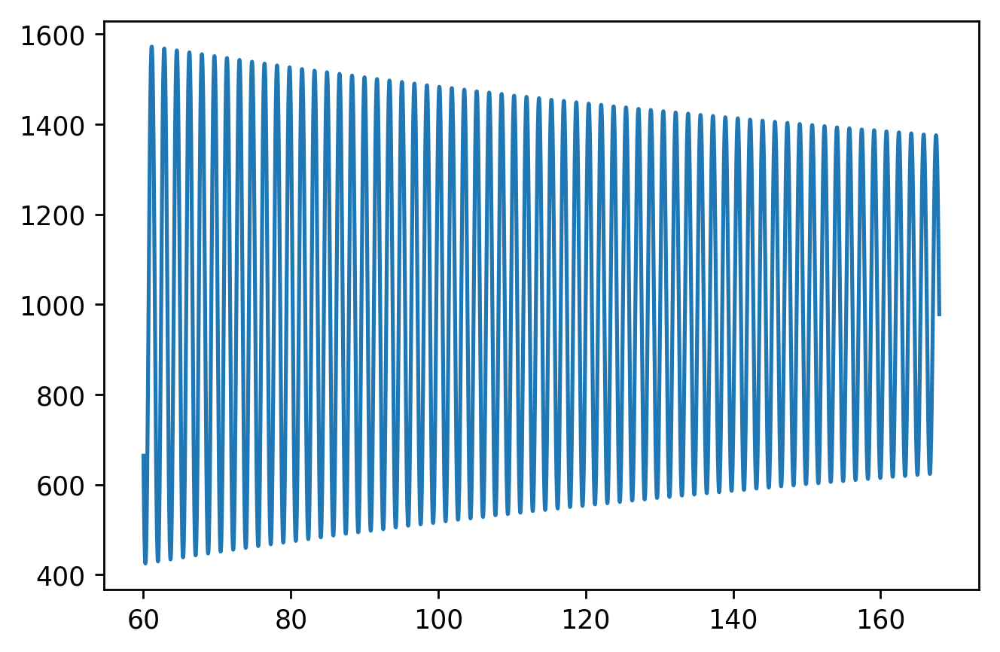

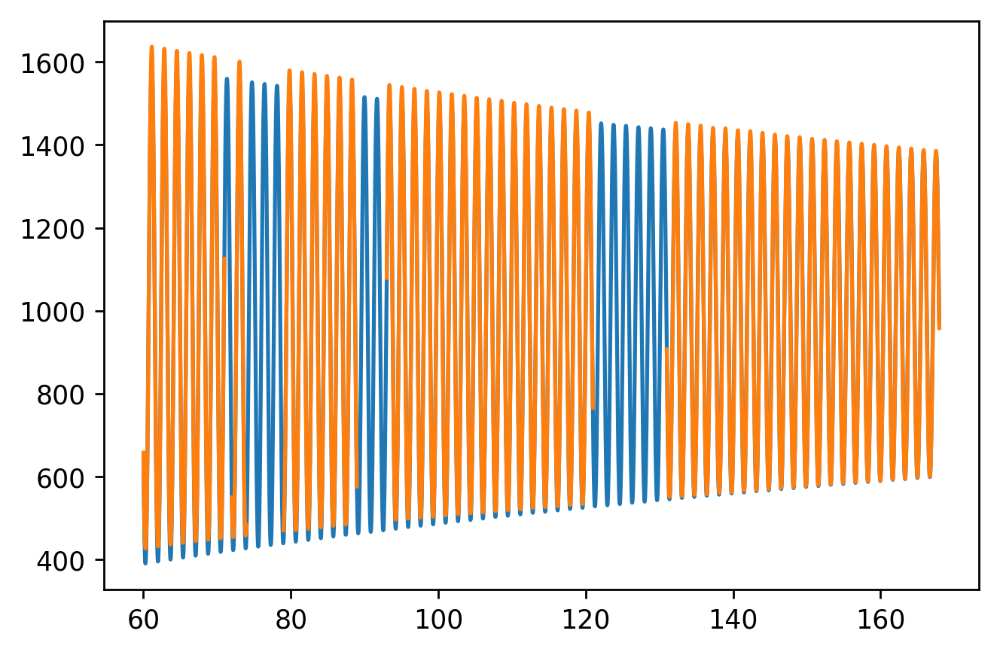

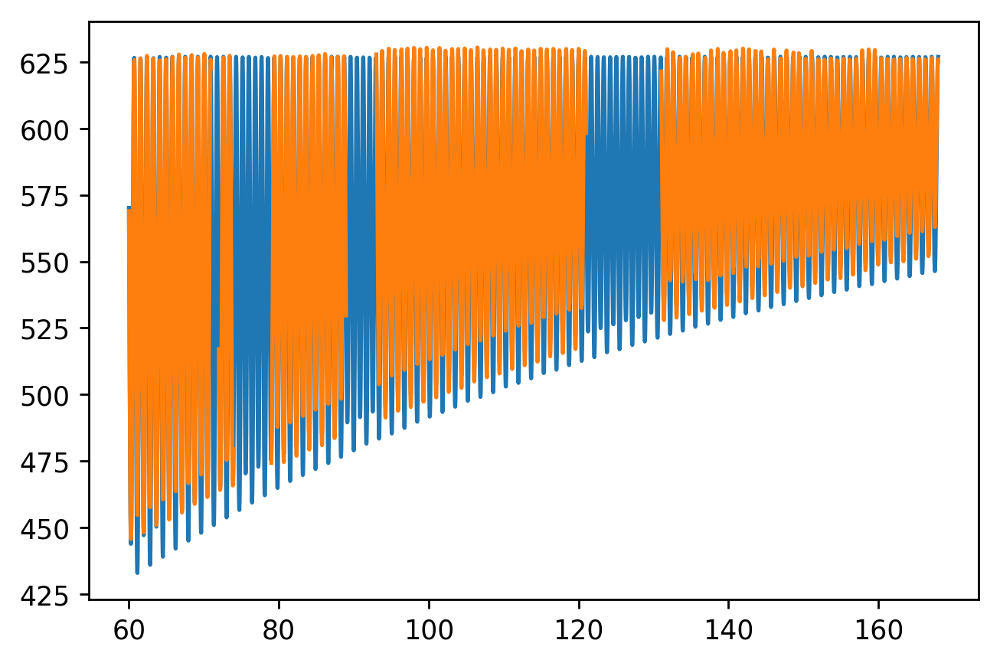

In [31]:
import pickle

readFit=True
if readFit:
    with open('fitout.pickle','rb') as f:
        fitout=pickle.load(f)
else:
    with open('fitout.pickle', 'wb') as f:
        pickle.dump(fitout, f)
print(fitout)
parGuess=fitout.x
Chi2xy(parGuess,tm,xmask,ymask,1042.25,x0,y0-1042.25,True)


x0 980.000000 y0 -415.250000 dt 2.29113 theta0 0.621269 g 9.84493 alpha 2.35241 delta -0.011009 lpixel 1042.250000
neval= 15861 chi2= 2.56956e+06


2569563.1235899851

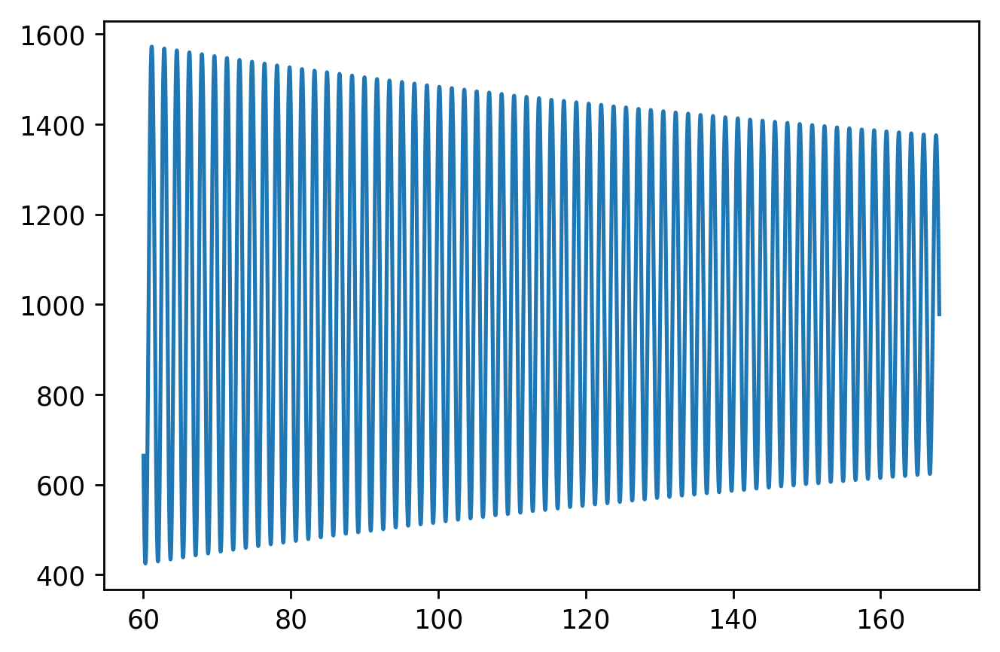

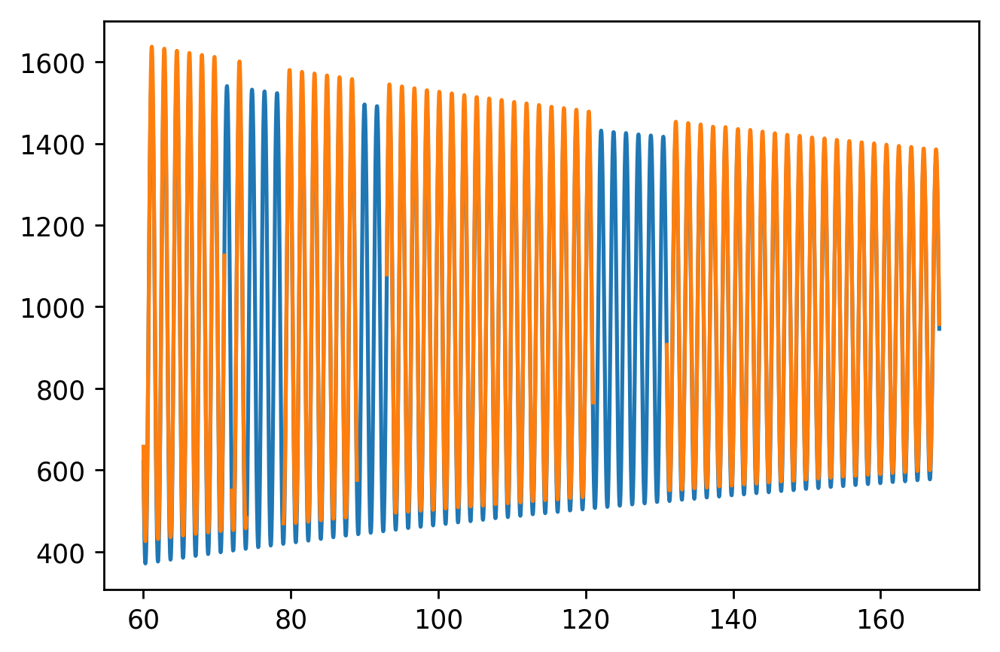

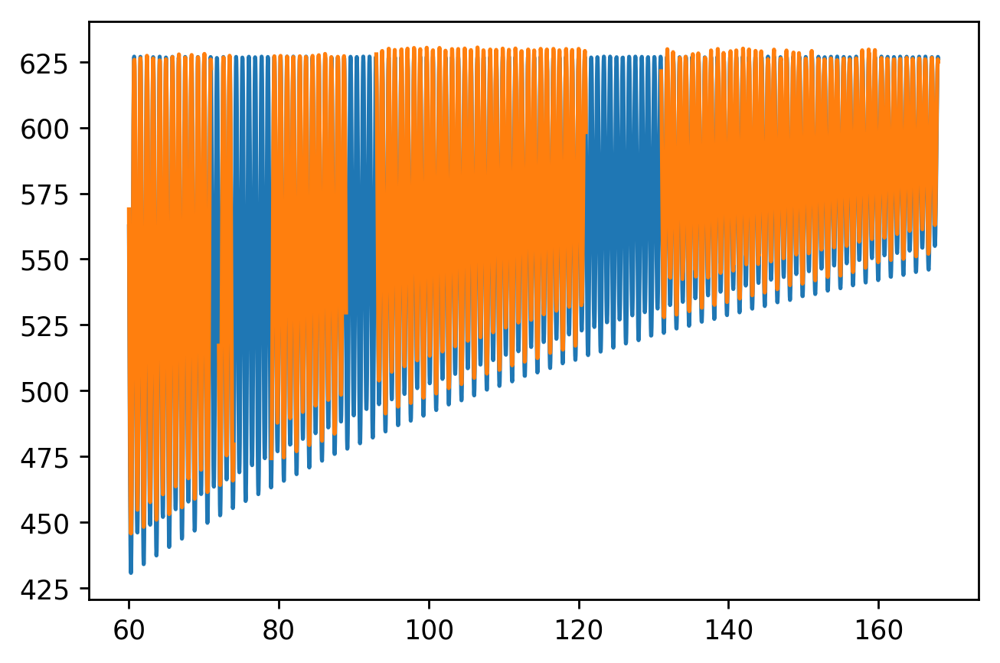

In [38]:
dt,theta0,g,alpha,delta=fitout.x
delta=-delta #to shift the x/y difference the other way
lpixel=1042.25
y0=-415.25
parameters=(lpixel,x0,y0,delta)
Chi2XY2(parameters,tm,xmask,ymask,dt,theta0,g,alpha,True)

In [39]:
dt,theta0,g,alpha,delta=fitout.x
delta=-delta  #to shift the tilt the other way
lpixel=1042.25
y0=-415.25
parameters=(lpixel,x0,y0,delta)
fitout2=scipy.optimize.minimize(Chi2XY2,parameters,args=(tm,xmask,ymask,dt,theta0,g,alpha,False), method='BFGS',options={'eps':np.array([1,1,1,1e-3]),'gtol':1})



x0 980.000000 y0 -415.250000 dt 2.29113 theta0 0.621269 g 9.84493 alpha 2.35241 delta -0.011009 lpixel 1042.250000
neval= 15861 chi2= 2.56956e+06
x0 980.000000 y0 -415.250000 dt 2.29113 theta0 0.621269 g 9.84493 alpha 2.35241 delta -0.011009 lpixel 1043.250000
neval= 15861 chi2= 2.54869e+06
x0 981.000000 y0 -415.250000 dt 2.29113 theta0 0.621269 g 9.84493 alpha 2.35241 delta -0.011009 lpixel 1042.250000
neval= 15861 chi2= 2.43569e+06
x0 980.000000 y0 -414.250000 dt 2.29113 theta0 0.621269 g 9.84493 alpha 2.35241 delta -0.011009 lpixel 1042.250000
neval= 15861 chi2= 2.5489e+06
x0 980.000000 y0 -415.250000 dt 2.29113 theta0 0.621269 g 9.84493 alpha 2.35241 delta -0.010009 lpixel 1042.250000
neval= 15861 chi2= 2.44559e+06
x0 980.000000 y0 -415.250000 dt 2.29113 theta0 0.621269 g 9.84493 alpha 2.35241 delta -0.011009 lpixel 1042.250000
neval= 15861 chi2= 2.56956e+06
x0 980.001091 y0 -415.249832 dt 2.29113 theta0 0.621269 g 9.84493 alpha 2.35241 delta 0.998990 lpixel 1042.250170
neval= 1586

neval= 15861 chi2= 844383
x0 996.724115 y0 -415.918589 dt 2.29113 theta0 0.621269 g 9.84493 alpha 2.35241 delta -0.004761 lpixel 1048.402783
neval= 15861 chi2= 830599
x0 1002.511096 y0 -415.909888 dt 2.29113 theta0 0.621269 g 9.84493 alpha 2.35241 delta -0.010642 lpixel 1048.015490
neval= 15861 chi2= 772578
x0 1002.511096 y0 -415.909888 dt 2.29113 theta0 0.621269 g 9.84493 alpha 2.35241 delta -0.010642 lpixel 1048.015490
neval= 15861 chi2= 772578
x0 1002.511096 y0 -415.909888 dt 2.29113 theta0 0.621269 g 9.84493 alpha 2.35241 delta -0.010642 lpixel 1049.015490
neval= 15861 chi2= 777454
x0 1003.511096 y0 -415.909888 dt 2.29113 theta0 0.621269 g 9.84493 alpha 2.35241 delta -0.010642 lpixel 1048.015490
neval= 15861 chi2= 759116
x0 1002.511096 y0 -414.909888 dt 2.29113 theta0 0.621269 g 9.84493 alpha 2.35241 delta -0.010642 lpixel 1048.015490
neval= 15861 chi2= 777138
x0 1002.511096 y0 -415.909888 dt 2.29113 theta0 0.621269 g 9.84493 alpha 2.35241 delta -0.009642 lpixel 1048.015490
neval= 

In [42]:
import pickle

readFit2=False
if readFit2:
    with open('fitout2.pickle','rb') as f:
        fitout2=pickle.load(f)
else:
    with open('fitout2.pickle', 'wb') as f:
        pickle.dump(fitout2, f)
print(fitout2)


      fun: 702708.7530234068
 hess_inv: array([[  1.69687272e-03,   1.64204396e-05,  -1.60248107e-03,
          7.83881272e-10],
       [  1.64204396e-05,   1.66665496e-03,   2.39357707e-05,
         -1.50432294e-06],
       [ -1.60248107e-03,   2.39357707e-05,   1.70441657e-03,
         -3.61504481e-08],
       [  7.83881272e-10,  -1.50432294e-06,  -3.61504481e-08,
          1.53235695e-09]])
      jac: array([  4.14310489e-06,   5.60162938e-04,  -6.40191138e-06,
         5.18757035e-01])
  message: 'Optimization terminated successfully.'
     nfev: 96
      nit: 10
     njev: 16
   status: 0
  success: True
        x: array([  1.04732074e+03,   1.01717503e+03,  -4.15896470e+02,
        -2.29284106e-02])


In [43]:
fitout2.keys()
print(fitout2)

      fun: 702708.7530234068
 hess_inv: array([[  1.69687272e-03,   1.64204396e-05,  -1.60248107e-03,
          7.83881272e-10],
       [  1.64204396e-05,   1.66665496e-03,   2.39357707e-05,
         -1.50432294e-06],
       [ -1.60248107e-03,   2.39357707e-05,   1.70441657e-03,
         -3.61504481e-08],
       [  7.83881272e-10,  -1.50432294e-06,  -3.61504481e-08,
          1.53235695e-09]])
      jac: array([  4.14310489e-06,   5.60162938e-04,  -6.40191138e-06,
         5.18757035e-01])
  message: 'Optimization terminated successfully.'
     nfev: 96
      nit: 10
     njev: 16
   status: 0
  success: True
        x: array([  1.04732074e+03,   1.01717503e+03,  -4.15896470e+02,
        -2.29284106e-02])


In [44]:
lpixel,x0,y0,delta=fitout2.x
parameters=(dt,theta0,g,alpha,delta)
fitout3=scipy.optimize.minimize(Chi2xy,parameters,args=(tm,xmask,ymask,lpixel,x0,y0,False),method='BFGS',
                               options={'eps':np.array([1e-5,1e-5,1e-5,1e-3,1e-5]),'gtol':1})


x0 1017.175035 y0 -415.896470 dt 2.29113 theta0 0.621269 g 9.84493 alpha 2.35241 delta -0.022928 lpixel 1047.320739
neval= 15861 chi2= 702709
x0 1017.175035 y0 -415.896470 dt 2.29114 theta0 0.621269 g 9.84493 alpha 2.35241 delta -0.022928 lpixel 1047.320739
neval= 15697 chi2= 702709
x0 1017.175035 y0 -415.896470 dt 2.29113 theta0 0.621279 g 9.84493 alpha 2.35241 delta -0.022928 lpixel 1047.320739
neval= 15665 chi2= 702712
x0 1017.175035 y0 -415.896470 dt 2.29113 theta0 0.621269 g 9.84494 alpha 2.35241 delta -0.022928 lpixel 1047.320739
neval= 15688 chi2= 702711
x0 1017.175035 y0 -415.896470 dt 2.29113 theta0 0.621269 g 9.84493 alpha 2.35341 delta -0.022928 lpixel 1047.320739
neval= 15645 chi2= 702768
x0 1017.175035 y0 -415.896470 dt 2.29113 theta0 0.621269 g 9.84493 alpha 2.35241 delta -0.022918 lpixel 1047.320739
neval= 15861 chi2= 702680
x0 1017.175035 y0 -415.896470 dt 2.29113 theta0 0.621269 g 9.84493 alpha 2.35241 delta -0.022928 lpixel 1047.320739
neval= 15861 chi2= 702709
x0 101

neval= 15779 chi2= 701976
x0 1017.175035 y0 -415.896470 dt 2.2911 theta0 0.62121 g 9.84486 alpha 2.35239 delta -0.022452 lpixel 1047.320739
neval= 15804 chi2= 701991
x0 1017.175035 y0 -415.896470 dt 2.2911 theta0 0.6212 g 9.84487 alpha 2.35239 delta -0.022452 lpixel 1047.320739
neval= 15672 chi2= 701973
x0 1017.175035 y0 -415.896470 dt 2.2911 theta0 0.6212 g 9.84486 alpha 2.35339 delta -0.022452 lpixel 1047.320739
neval= 15645 chi2= 702008
x0 1017.175035 y0 -415.896470 dt 2.2911 theta0 0.6212 g 9.84486 alpha 2.35239 delta -0.022442 lpixel 1047.320739
neval= 15678 chi2= 701975
x0 1017.175035 y0 -415.896470 dt 2.2911 theta0 0.621201 g 9.84486 alpha 2.35239 delta -0.022452 lpixel 1047.320739
neval= 15616 chi2= 701976
x0 1017.175035 y0 -415.896470 dt 2.2911 theta0 0.621201 g 9.84486 alpha 2.35239 delta -0.022452 lpixel 1047.320739
neval= 15616 chi2= 701976
x0 1017.175035 y0 -415.896470 dt 2.29111 theta0 0.621201 g 9.84486 alpha 2.35239 delta -0.022452 lpixel 1047.320739
neval= 15682 chi2= 

neval= 15654 chi2= 701976
x0 1017.175035 y0 -415.896470 dt 2.2911 theta0 0.6212 g 9.84487 alpha 2.35238 delta -0.022452 lpixel 1047.320739
neval= 15636 chi2= 701975
x0 1017.175035 y0 -415.896470 dt 2.2911 theta0 0.6212 g 9.84487 alpha 2.35238 delta -0.022452 lpixel 1047.320739
neval= 15636 chi2= 701975
x0 1017.175035 y0 -415.896470 dt 2.29111 theta0 0.6212 g 9.84487 alpha 2.35238 delta -0.022452 lpixel 1047.320739
neval= 15800 chi2= 701981
x0 1017.175035 y0 -415.896470 dt 2.2911 theta0 0.62121 g 9.84487 alpha 2.35238 delta -0.022452 lpixel 1047.320739
neval= 15722 chi2= 701987
x0 1017.175035 y0 -415.896470 dt 2.2911 theta0 0.6212 g 9.84488 alpha 2.35238 delta -0.022452 lpixel 1047.320739
neval= 15642 chi2= 701974
x0 1017.175035 y0 -415.896470 dt 2.2911 theta0 0.6212 g 9.84487 alpha 2.35338 delta -0.022452 lpixel 1047.320739
neval= 15632 chi2= 702007
x0 1017.175035 y0 -415.896470 dt 2.2911 theta0 0.6212 g 9.84487 alpha 2.35238 delta -0.022442 lpixel 1047.320739
neval= 15636 chi2= 701974

neval= 15620 chi2= 701977


x0 1017.175035 y0 -415.896470 dt 2.2911 theta0 0.621201 g 9.84487 alpha 2.35239 delta -0.022452 lpixel 1047.320739
neval= 15627 chi2= 701975
      fun: 701975.2007456115
 hess_inv: array([[  1.15901911e-07,  -1.75871517e-05,  -8.07587615e-07,
         -3.40046832e-04,   3.57002290e-06],
       [ -1.75871517e-05,   2.69833661e-03,   1.23906414e-04,
          5.21826686e-02,  -5.47695426e-04],
       [ -8.07587615e-07,   1.23906414e-04,   5.68972860e-06,
          2.39620493e-03,  -2.51499300e-05],
       [ -3.40046832e-04,   5.21826686e-02,   2.39620493e-03,
          1.00915539e+00,  -1.05917732e-02],
       [  3.57002290e-06,  -5.47695426e-04,  -2.51499300e-05,
         -1.05917732e-02,   1.11168813e-04]])
      jac: array([  -15579.44560191,  1467257.28076417,  -798511.13925688,
          30498.88285319,  -107299.61962206])
  message: 'Desired error not necessarily achieved due to precision loss.'
     nfev: 179
      nit: 4
     njev: 24
   status: 2
  success: False
        x: arra

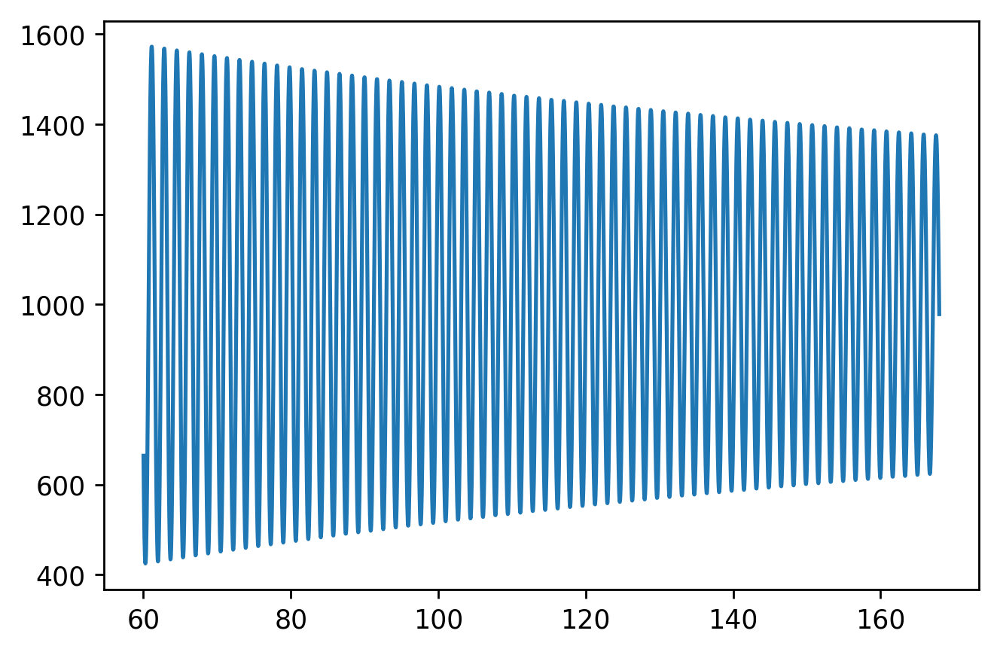

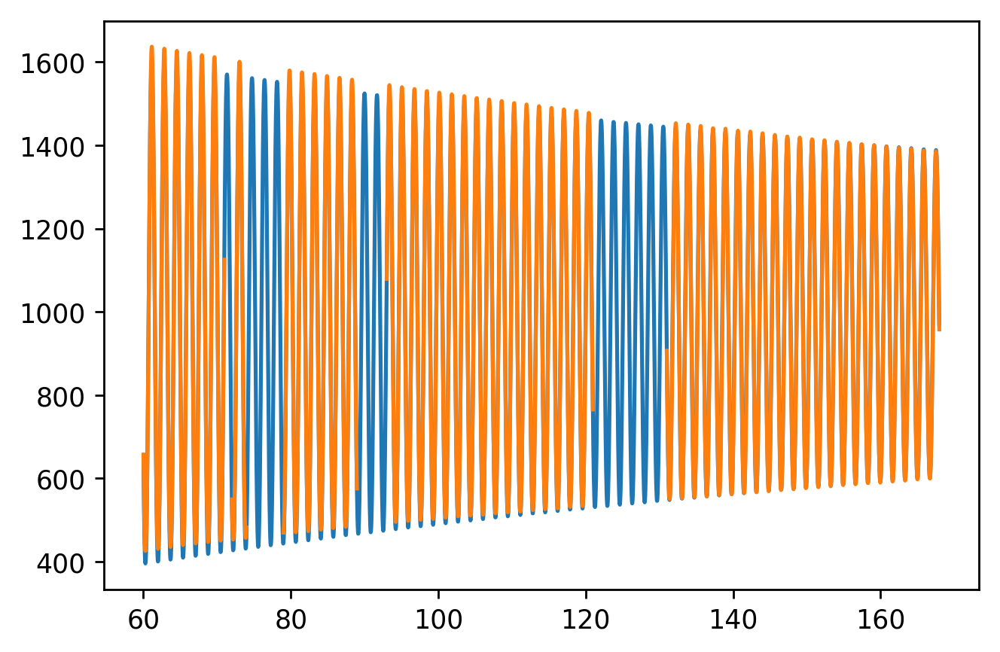

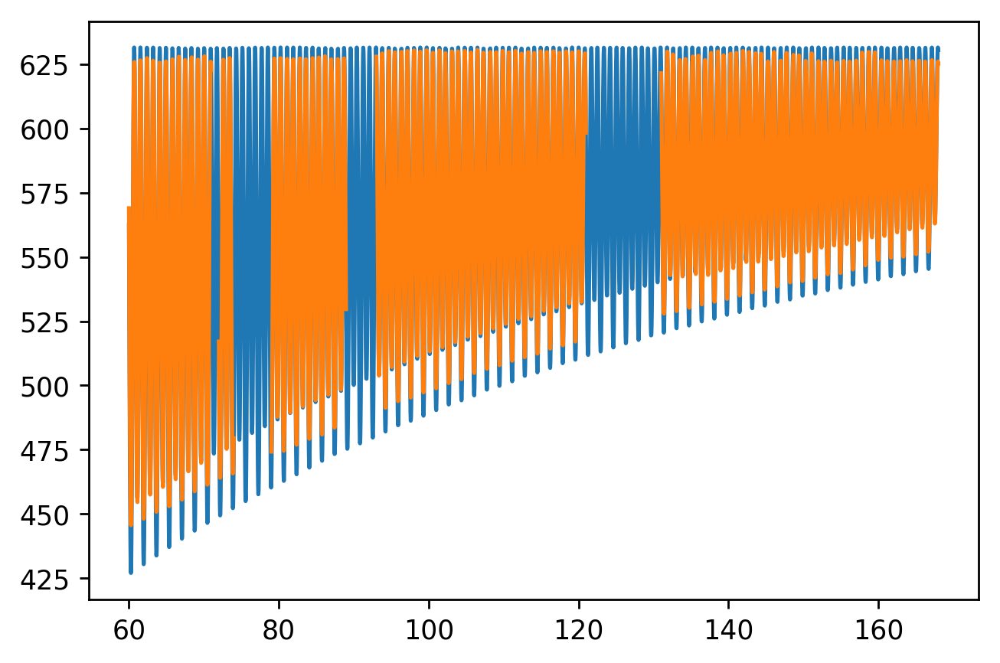

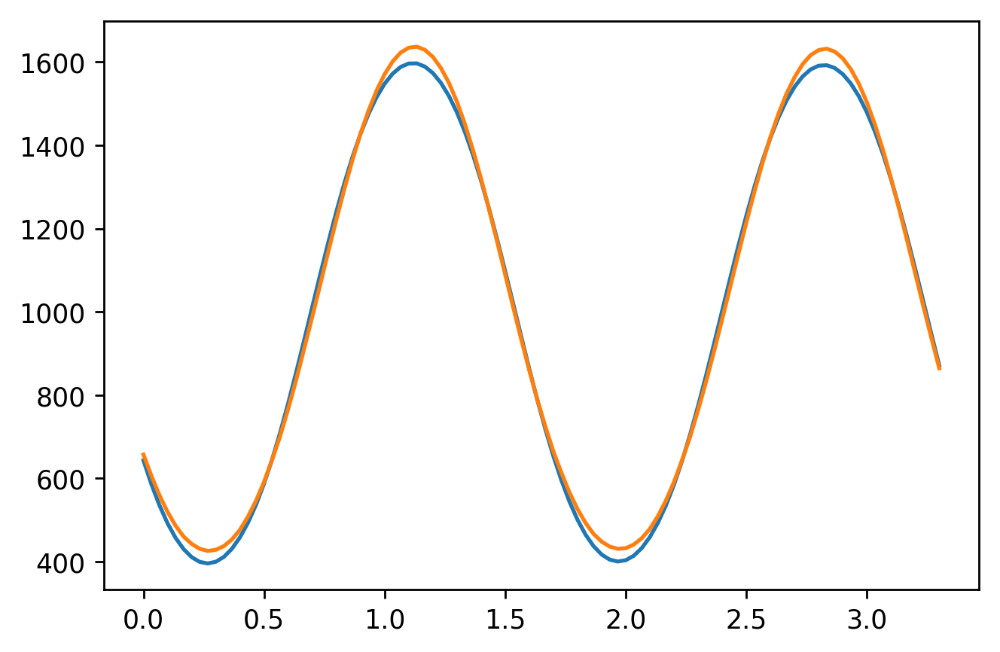

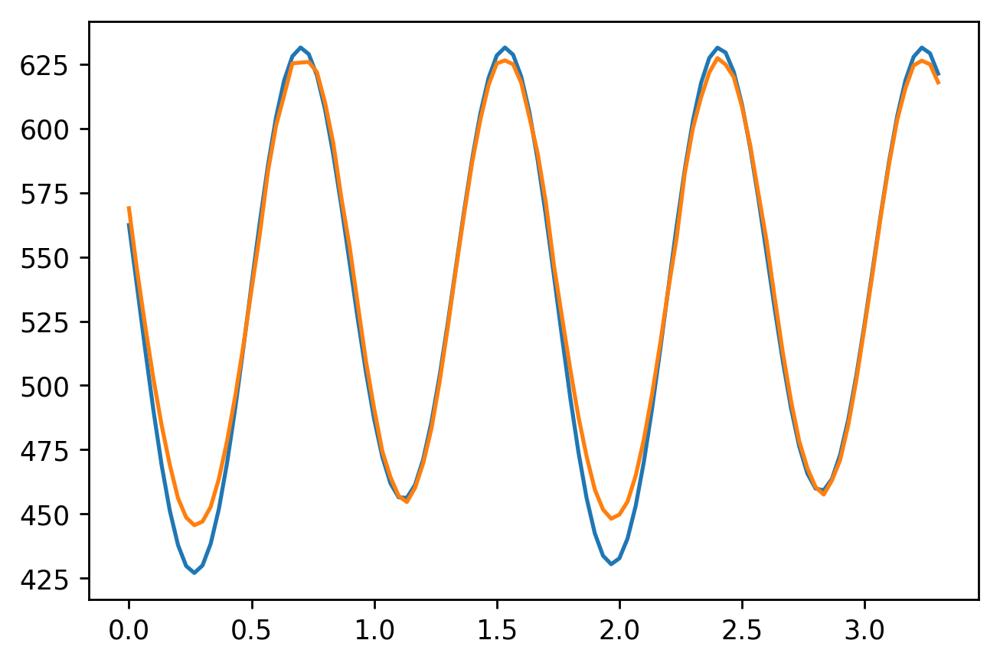

In [45]:
Chi2xy(fitout3.x,tm,xmask,ymask,lpixel,x0,y0,True)
print(fitout3)
dt,theta0,g,alpha,delta=fitout3.x
i1=0
i2=100
plt.figure()
theta=sol[:,0]+delta
plt.plot(t[i1:i2],x0+lpixel*np.sin(theta[i1:i2]))
plt.plot(t[i1:i2],xmask[i1:i2])
plt.figure()
plt.plot(t[i1:i2],y0+lpixel*np.cos(theta[i1:i2]))
plt.plot(t[i1:i2],ymask[i1:i2])


We are seeing some sort of beat between the data and fit.  Perhaps the oscillations?  THe other possibility might be z oscillations.  
Now let's look at the derived quantities.



In [46]:
pendC=fitout3.hess_inv
pendunc=np.sqrt(np.diagonal(pendC))

for i in range(0,5):
    print('%f %f'%(fitout3.x[i],pendunc[i]/30))  # the 30 scales the uncertainty by a factor of 30 in the chisquare calculation


2.291104 0.000011
0.621201 0.001732
9.844865 0.000080
2.352393 0.033486
-0.022452 0.000351


Our results: $\chi^2=701000$ for 4000 degrees of freedom, so we don't have a good fit.  If we attribute this to, say, angular momentum compound pendulum oscillations that we haven't taken into account in the fit, then we would say that we have underestimated our uncertainties by a factor of 10.  We can't always do this- there needs to be real systematic that we understand, but in this case we are probably fine.  Rather than scale our intrinsic uncertainty by 30, we will simply scale the uncertainties returned from the fit by 30.

The fit returns an acceleration due to gravity of $9.840\pm0.088$, and an (terrible!) air resistance factor of 2.35.  We simply must have some parameter wrong (Compare this to 2017, when we had an amazingly good factor for air resistance of $1.000\pm0.018$).  

In principle, we would keep working on the pendulum- remeasure the string diameter, correct for the length shift etc- because almost anything can be calculated precisely with a detailed model these days.  Since we are working within the restrictions of class time, we will move on "holding our noses" to this poor result.  

We also have a correction for the fact that we have ignored the compound pendulum.  From the calculation we saw that the compound pendulum has a period that is 0.7 radians/152 radians slower than a simple pendulum.  We fit our data with the assumption of a simple pendulum- whereas the data is the data for a compount pendulum.  Thus the data correspond to a slower pendulum - ie. a smaller gravitational constant.  This correction is 2x0.7/152*9.8=0.09 m**2/s, at an amplitude of 0.7, and decreases as the pendulum slows down.

What other corrections are needed?

What are our other uncertainties?  The length is uncertain by 1 mm/635, which translates to an error in g of 0.015, and our statistical uncertainty from the fit is 0.004

Our number, based on these measurements is $9.89 \pm 0.07$.  Instead of correcting, we compare it to a m measurement on the UofA campus (https://sites.ualberta.ca/~unsworth/UA-classes/210/notes210/B/210B4-2008.pdf) which found 9.8117 (then we don't need to make any of the other corrections.  

In [4]:
1/635*9.8
0.29/39.35*2*9.8

0.14444726810673444